In [3]:
import pandas as pd
import pickle
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.patches import Circle
from pybaseball import pitching_stats, playerid_reverse_lookup, playerid_lookup
import statsapi
from scipy.stats import zscore
from itertools import combinations
from sklearn.preprocessing import StandardScaler
from sklearn.metrics.pairwise import cosine_similarity, pairwise_distances
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.neighbors import NearestNeighbors
import umap
from sklearn.manifold import TSNE
import hdbscan
import matplotlib.cm as cm
from sklearn.metrics import silhouette_samples, silhouette_score
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import TensorDataset, DataLoader
from sklearn.model_selection import train_test_split
from itertools import product
import copy
import math

/opt/miniconda3/envs/iw/lib/python3.13/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


The code below is for graphs that will be used later during analysis

In [22]:
def draw_reference_circles(ax, radii=[6, 12, 18, 24]):
    for r in radii:
        circle = Circle((0, 0), r, edgecolor="lightgray", facecolor="none", lw=0.8, ls="--", zorder=0)
        ax.add_patch(circle)
    # Keep equal aspect ratio so circles look round
    ax.set_aspect("equal", adjustable="datalim")

In [23]:
def reshape_pitcher_season_df(pitcher_season_df):
    pitch_types = ["CH", "CU", "EP", "FC", "FF", "FS", "KN", "SI", "SL"]

    long_df = []
    for pitch in pitch_types:
        if f"pfx_x_{pitch}" not in pitcher_season_df.columns:
            continue
        temp = pitcher_season_df[["pitcher", "name", "game_year"]].copy()
        temp["pitch_type"] = pitch
        temp["pfx_x"] = pitcher_season_df[f"pfx_x_{pitch}"]
        temp["pfx_z"] = pitcher_season_df[f"pfx_z_{pitch}"]
        temp["release_speed"] = pitcher_season_df[f"release_speed_{pitch}"]
        temp["pitch_frac"] = pitcher_season_df.get(f"{pitch}_frac", None)
        long_df.append(temp)

    movement_long = pd.concat(long_df)
    # FIX: Filter out pitches not thrown (pfx, speed, or usage is NaN/0)
    movement_long = movement_long.dropna(subset=["pfx_x", "pfx_z", "release_speed", "pitch_frac"])
    movement_long = movement_long[movement_long["pitch_frac"] > 0.01]  # Remove pitches with <1% usage
    
    return movement_long

In [24]:
def plot_pitcher_movement(df, pitcher_name, year):
    p_df = df[(df["name"] == pitcher_name) & (df["game_year"] == year)]
    if p_df.empty:
        print(f"No data for {pitcher_name} ({year})")
        return

    plt.figure(figsize=(8, 8))
    sc = plt.scatter(
        p_df["pfx_x"],
        p_df["pfx_z"],
        c=p_df["release_speed"],
        s=p_df["pitch_frac"] * 2000 if "pitch_frac" in p_df else 200,
        cmap="coolwarm",
        edgecolors="black",
    )

    for _, row in p_df.iterrows():
        plt.text(row["pfx_x"], row["pfx_z"], row["pitch_type"], fontsize=9, ha="center", va="center")

    plt.axhline(0, color="gray", lw=1)
    plt.axvline(0, color="gray", lw=1)
    plt.xlabel("Horizontal Movement (inches)")
    plt.ylabel("Vertical Movement (inches)")
    plt.title(f"{pitcher_name} ({year}) Pitch Movement")
    plt.gca().invert_yaxis()
    cbar = plt.colorbar(sc)
    cbar.set_label("Velocity (mph)")
    plt.show()

In [120]:
def compare_pitchers_overlay(df, nameA, yearA, nameB, yearB, lim_inches=25, size_scale=5000):
    fig, ax = plt.subplots(figsize=(8, 8))
    colors = ["blue", "red"]

    summary_tables = {}

    for color, (pname, pyear) in zip(colors, [(nameA, yearA), (nameB, yearB)]):
        p_df = df[(df["name"] == pname) & (df["game_year"] == pyear)]
        if p_df.empty:
            print(f"No data for {pname} ({pyear})")
            continue

        # Convert feet → inches and flip horizontal direction
        p_df = p_df.copy()
        p_df["pfx_x"] = -p_df["pfx_x"] * 12
        p_df["pfx_z"] = p_df["pfx_z"] * 12

        # Scale circle size by pitch usage
        sizes = p_df["pitch_frac"] * size_scale

        ax.scatter(
            p_df["pfx_x"], p_df["pfx_z"],
            s=sizes,
            color=color, alpha=0.5, label=f"{pname} ({pyear})",
            edgecolors="black", zorder=3
        )

        for _, row in p_df.iterrows():
            ax.text(
            row["pfx_x"],
            row["pfx_z"],
            row["pitch_type"],
            fontsize=11,
            ha="center",
            va="center",   # <-- this is the key
            zorder=4,
        )


        # Store summary info for table - FIX: use pitch_type directly as key
        summary_tables[f"{pname} ({pyear})"] = {
            row["pitch_type"]: (f"{row['release_speed']:.1f}", f"{row['pitch_frac']*100:.1f}%")
            for _, row in p_df.iterrows()
        }

    # Reference lines & circles
    ax.axhline(0, color="gray", lw=1, zorder=1)
    ax.axvline(0, color="gray", lw=1, zorder=1)
    draw_reference_circles(ax)

    # Keep consistent framing
    ax.set_xlim(-lim_inches, lim_inches)
    ax.set_ylim(-lim_inches, lim_inches)
    ax.set_aspect("equal")

    ax.set_xlabel("Horizontal Movement (inches, arm-side → right)")
    ax.set_ylabel("Vertical Movement (inches, rise → up)")
    ax.set_title("Pitch Movement Comparison (Overlay)")
    ax.legend(markerscale=0.3)

    pitch_order = ["FF", "SI", "FC", "SL", "CU", "CH", "FS", "KN", "EP"]

    for i, (label, pdata) in enumerate(summary_tables.items()):
        # FIX: Only include pitches that the pitcher actually throws
        pitches_thrown = [p for p in pitch_order if p in pdata]
        
        # Build table using only pitches thrown by this pitcher
        velo_row = [pdata[p][0] for p in pitches_thrown]
        usage_row = [pdata[p][1] for p in pitches_thrown]
        summary_df = pd.DataFrame([velo_row, usage_row], index=["Velo (mph)", "Usage %"], columns=pitches_thrown)

        # Table placement (stacked vertically)
        y_offset = -0.25 - (i * 0.18)
        table_ax = fig.add_axes([0.1, y_offset, 0.8, 0.15])
        table_ax.axis("off")
        table = table_ax.table(
            cellText=summary_df.values,
            rowLabels=summary_df.index,
            colLabels=summary_df.columns,
            cellLoc="center",
            rowLoc="center",
            loc="center"
        )
        table.scale(1.2, 1.3)      # slightly larger cells
        table.auto_set_font_size(False)
        table.set_fontsize(10)     # <- was 8


        # Add pitcher label above table
        table_ax.text(
            0.5, 1.15,
            label,
            ha="center",
            va="bottom",
            fontsize=12,           # <- was 10
            color=colors[i],
            transform=table_ax.transAxes
        )

    plt.tight_layout()
    plt.show()

Code below processes the pitching data

In [6]:
with open(f"datasets/pitch_df.pkl", "rb") as f:
        df = pickle.load(f)
df = df.drop(['release_spin_rate', 'spin_axis', 'vx0', 'vy0', 'vz0', 'ax', 'ay', 'az', 'pitcher_days_since_prev_game', 'arm_angle', 'game_pk', 'game_type', 'effective_speed', 'api_break_z_with_gravity', 'api_break_x_arm', 'api_break_x_batter_in'], axis=1)
print(df.columns)

Index(['pitch_type', 'release_speed', 'release_pos_x', 'release_pos_z',
       'pitcher', 'p_throws', 'game_year', 'pfx_x', 'pfx_z',
       'release_extension', 'release_pos_y'],
      dtype='object')


In [7]:
def get_qualified_pitchers(year):
    df = pitching_stats(year, qual=1)
    
    # role classification: starter if majority of games are starts
    df['role'] = df.apply(lambda row: 'starter' if row['GS'] / row['G'] >= 0.5 else 'reliever', axis=1)
    
    # filter by innings
    if year != 2020:
        qualified = df[
            ((df['role'] == 'starter') & (df['IP'] >= 108)) |
            ((df['role'] == 'reliever') & (df['IP'] >= 54))
        ].copy()
    else:
        qualified = df[
            ((df['role'] == 'starter') & (df['IP'] >= 40)) |
            ((df['role'] == 'reliever') & (df['IP'] >= 20))
        ].copy()
    
    qualified['year'] = year
    return qualified

# Loop over seasons
qualified_all = pd.concat([get_qualified_pitchers(y) for y in range(2017, 2025)], ignore_index=True)

# Get unique FanGraphs IDs
fg_ids = qualified_all['IDfg'].unique().tolist()

# Map to MLBAM IDs
id_map = playerid_reverse_lookup(fg_ids, key_type='fangraphs')

# Merge the IDs onto your qualified pitcher list
qualified_all = qualified_all.merge(id_map[['key_fangraphs', 'key_mlbam']], 
                                    left_on='IDfg', right_on='key_fangraphs', 
                                    how='left')

# Clean up
qualified_all.rename(columns={'key_mlbam': 'mlbam_id'}, inplace=True)
qualified_all.drop(columns=['key_fangraphs'], inplace=True)

# Merge season by season
statcast_qualified = df.merge(
    qualified_all[['mlbam_id', 'year', 'role']],   # <- keep role
    left_on=['pitcher', 'game_year'], 
    right_on=['mlbam_id', 'year'], 
    how='inner'
)


In [8]:
num_pitcher_seasons = statcast_qualified.groupby(["pitcher", "game_year"]).ngroups
print("Number of pitcher-seasons:", num_pitcher_seasons)
# Total number of rows with at least one NaN in any column
num_rows_with_nans = statcast_qualified.isna().any(axis=1).sum()
print(f"Number of pitch rows with at least one NaN: {num_rows_with_nans}")

# Percentage of rows
total_rows = len(statcast_qualified)
print(f"Percentage: {num_rows_with_nans / total_rows * 100:.2f}%")

# Optional: see how many NaNs per column
print(statcast_qualified.isna().sum())

# Drop all pitch rows with any NaN
statcast_clean = statcast_qualified.dropna(axis=0, how='any').copy()

print(f"Rows after dropping NaNs: {len(statcast_clean)}")


Number of pitcher-seasons: 2111
Number of pitch rows with at least one NaN: 10733
Percentage: 0.32%
pitch_type            8054
release_speed         7669
release_pos_x         7839
release_pos_z         7839
pitcher                  0
p_throws                 0
game_year                0
pfx_x                 7762
pfx_z                 7756
release_extension    10315
release_pos_y         7839
mlbam_id                 0
year                     0
role                     0
dtype: int64
Rows after dropping NaNs: 3385985


In [ ]:
# Make normalized features for outlier detection
def add_normalized_features(df):
    """Flip x-direction features for lefties (batter-perspective)."""
    df = df.copy()
    flip_cols = ['release_pos_x', 'pfx_x']
    for col in flip_cols:
        if col in df.columns:
            df[col + '_norm'] = df.apply(
                lambda row: -row[col] if row['p_throws'] == 'L' else row[col],
                axis=1
            )
    return df

statcast_clean_norm = add_normalized_features(statcast_clean)

# Build list of numerical columns for outlier detection
numerical_cols = statcast_clean_norm.select_dtypes(include='number').columns.tolist()

# Replace raw x-direction features with normalized versions
cols_for_outlier_check = [
    c if c not in ['release_pos_x', 'pfx_x']
    else c + '_norm'
    for c in numerical_cols
]

# Compute z-scores per pitch type
def zscore_per_group(group):
    return group[cols_for_outlier_check].apply(zscore)

z_scores_by_pitch = statcast_clean_norm.groupby('pitch_type', group_keys=False).apply(zscore_per_group)

# Identify outliers (abs z-score > 4)
outliers_bool = z_scores_by_pitch.abs() > 4

# Create long-form table of outliers
outlier_long = outliers_bool.stack()
outlier_long = outlier_long[outlier_long]  # keep only True
outlier_long = outlier_long.reset_index()
outlier_long.columns = ['row_index', 'feature', 'is_outlier']

# Merge with pitcher info and get actual values
cols_to_use = ['pitcher', 'pitch_type'] + cols_for_outlier_check
statcast_subset = statcast_clean_norm[cols_to_use].reset_index()

outlier_details = outlier_long.merge(
    statcast_subset,
    left_on='row_index',
    right_on='index'
)

outlier_details['value'] = outlier_details.apply(
    lambda x: statcast_clean_norm.loc[x['row_index'], x['feature']],
    axis=1
)

print(outlier_details.head(20))



/opt/miniconda3/envs/iw/lib/python3.13/site-packages/pandas/core/apply.py:1081: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  results[i] = self.func(v, *self.args, **self.kwargs)
/opt/miniconda3/envs/iw/lib/python3.13/site-packages/pandas/core/apply.py:1081: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  results[i] = self.func(v, *self.args, **self.kwargs)
/opt/miniconda3/envs/iw/lib/python3.13/site-packages/pandas/core/apply.py:1081: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  results[i] = self.func(v, *self.args, **self.kwargs)
/opt/miniconda3/envs/iw/lib/python3.13/site-packages/pandas/core/apply.py:1081: Ru

    row_index            feature  is_outlier  index   pitcher pitch_type  \
0         407  release_extension        True    407  621389.0         CH   
1         407      release_pos_y        True    407  621389.0         CH   
2        1032              pfx_z        True   1032  446399.0         KC   
3        1288            pitcher        True   1288  112526.0         SI   
4        1288           mlbam_id        True   1288  112526.0         SI   
5        1289            pitcher        True   1289  112526.0         SI   
6        1289           mlbam_id        True   1289  112526.0         SI   
7        1290            pitcher        True   1290  112526.0         FF   
8        1290           mlbam_id        True   1290  112526.0         FF   
9        1291            pitcher        True   1291  112526.0         SI   
10       1291           mlbam_id        True   1291  112526.0         SI   
11       1292            pitcher        True   1292  112526.0         SI   
12       129

In [ ]:
# Count original pitch types
pitch_counts = statcast_clean['pitch_type'].value_counts()
print(pitch_counts)

# Define a mapping
pitch_map = {
    # Fastballs
    'FF': 'FF',   # Four-seam
    'FA': 'FF',   # Map FA to FF
    'FC': 'FC',   # Cutter
    'SI': 'SI',   # Sinker
    'FS': 'FS',   # Splitter
    'FO': 'FS',   # Occasionally FO is logged, treat as Splitter
    'SV': 'SL',   # Slurve -> Sliders
    'ST': 'SL',   # Sweeper -> Sliders

    # Offspeed / Breaking
    'SL': 'SL',   # Slider
    'CU': 'CU',   # Curveball
    'KC': 'CU',   # Knuckle curve -> Curveball
    'CS': 'CU',   # Slow curve
    'CH': 'CH',   # Changeup
    'SC': 'CH',   # Screwball -> Changeup
    'KN': 'KN',   # Knuckleball
    'EP': 'DROP',   # Eephus, dropping

    # Rare / to drop
    'PO': 'DROP',   # Pitch out, dropping
}

# Apply mapping
statcast_clean['pitch_grouped'] = statcast_clean['pitch_type'].map(pitch_map)

# Drop unwanted pitches
statcast_clean = statcast_clean[statcast_clean['pitch_grouped'] != 'DROP']

# See new grouped counts
grouped_counts = statcast_clean['pitch_grouped'].value_counts()
print(grouped_counts)

pitch_type
FF    1133966
SI     584040
SL     514959
CH     363918
FC     255162
CU     248252
ST      97712
KC      96750
FS      69796
SV      15874
KN       3351
FO        911
CS        497
EP        402
PO        287
FA         71
SC         37
Name: count, dtype: int64
pitch_grouped
FF    1134037
SL     628545
SI     584040
CH     363955
CU     345499
FC     255162
FS      70707
KN       3351
Name: count, dtype: int64


In [11]:
# Group by handedness + year to normalize within context
def flag_release_outliers(df):
    df['release_pos_x_z'] = df.groupby(['p_throws','game_year'])['release_pos_x'].transform(zscore)
    return df

statcast_clean = flag_release_outliers(statcast_clean)

# Filter out extreme outliers (e.g. |z| > 4)
statcast_clean = statcast_clean[statcast_clean['release_pos_x_z'].abs() <= 4]

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_22911/2539225547.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df['release_pos_x_z'] = df.groupby(['p_throws','game_year'])['release_pos_x'].transform(zscore)


In [12]:
fastball_types = ['FF', 'SI', 'FC']  # adjust to your dataset if needed

# Filter out any fastball slower than 70 mph
statcast_clean = statcast_clean[~((statcast_clean['pitch_type'].isin(fastball_types)) &
                                  (statcast_clean['release_speed'] < 70))]
print(list(statcast_clean.columns))
print(statcast_clean['pitch_type'].unique())

['pitch_type', 'release_speed', 'release_pos_x', 'release_pos_z', 'pitcher', 'p_throws', 'game_year', 'pfx_x', 'pfx_z', 'release_extension', 'release_pos_y', 'mlbam_id', 'year', 'role', 'pitch_grouped', 'release_pos_x_z']
['FC' 'FF' 'CH' 'SI' 'SL' 'CU' 'FS' 'KC' 'ST' 'FO' 'SV' 'KN' 'CS' 'SC'
 'FA']


In [13]:
def create_pitcher_season_df(statcast_clean):
    """
    Converts pitch-level Statcast data into a pitcher-season level dataframe
    with averaged pitch metrics per pitch type, pitch usage fractions,
    and overall release position metrics.
    """
    statcast_clean = statcast_clean.copy()
    statcast_clean['p_throws_num'] = statcast_clean['p_throws'].map({'R': 1, 'L': 0})

    numeric_cols = [
        'release_speed', 'release_pos_x', 'release_pos_z', 
        'pfx_x', 'pfx_z', 'release_extension'
    ]

    pitch_agg = (
        statcast_clean
        .groupby(['pitcher', 'game_year', 'pitch_grouped'])[numeric_cols]
        .mean()
        .reset_index()
    )

    pitch_specific_cols = ['release_speed', 'pfx_x', 'pfx_z']

    pitcher_season_df = pitch_agg.pivot_table(
        index=['pitcher', 'game_year'],
        columns='pitch_grouped',
        values=pitch_specific_cols,
        fill_value=0
    )

    pitcher_season_df.columns = ['_'.join(col).strip() for col in pitcher_season_df.columns.values]
    pitcher_season_df = pitcher_season_df.reset_index()

    # --- pitch fractions (your existing code) ---
    pitch_counts = (
        statcast_clean
        .groupby(['pitcher', 'game_year', 'pitch_grouped'])
        .size()
        .reset_index(name='pitch_count')
    )

    pitch_counts['pitch_frac'] = (
        pitch_counts.groupby(['pitcher', 'game_year'])['pitch_count']
        .transform(lambda x: x / x.sum())
    )

    pitch_frac_pivot = pitch_counts.pivot_table(
        index=['pitcher', 'game_year'],
        columns='pitch_grouped',
        values='pitch_frac',
        fill_value=0
    )
    pitch_frac_pivot.columns = [f"{col}_frac" for col in pitch_frac_pivot.columns]
    pitch_frac_pivot = pitch_frac_pivot.reset_index()

    pitcher_season_df = pitcher_season_df.merge(pitch_frac_pivot, on=['pitcher', 'game_year'])

    # --- overall release position metrics (existing) ---
    release_means = (
        statcast_clean
        .groupby(['pitcher', 'game_year'])[['release_pos_x', 'release_pos_z', 'release_extension']]
        .mean()
        .reset_index()
    )
    pitcher_season_df = pitcher_season_df.merge(release_means, on=['pitcher', 'game_year'], how='left')

    # --- NEW: handedness and role at pitcher-season level ---
    hand_role = (
        statcast_clean[['pitcher', 'game_year', 'p_throws', 'p_throws_num', 'role']]
        .drop_duplicates(subset=['pitcher', 'game_year'])
    )
    pitcher_season_df = pitcher_season_df.merge(hand_role, on=['pitcher', 'game_year'], how='left')

    return pitcher_season_df


# Rebuild after editing
pitcher_season_df = create_pitcher_season_df(statcast_clean)
print(pitcher_season_df[['pitcher', 'game_year', 'p_throws', 'p_throws_num', 'role']].head())


    pitcher  game_year p_throws p_throws_num      role
0  112526.0       2017        R            1   starter
1  112526.0       2018        R            1   starter
2  279571.0       2017        R            1  reliever
3  282332.0       2017        L            0   starter
4  282332.0       2018        L            0   starter


In [14]:
# Get unique MLBAM IDs
mlbam_ids = pitcher_season_df["pitcher"].unique()

# Look up player info
id_lookup = playerid_reverse_lookup(mlbam_ids)

# Merge with your pitcher-season DataFrame
pitcher_season_df = pitcher_season_df.merge(
    id_lookup[['key_mlbam', 'name_first', 'name_last']],
    how='left',
    left_on='pitcher',
    right_on='key_mlbam'
)

# Optional: create a full name column
pitcher_season_df['name'] = pitcher_season_df['name_first'] + ' ' + pitcher_season_df['name_last']
pitcher_season_df = pitcher_season_df.drop('key_mlbam', axis=1)

In [15]:
pitch_types = ['FF', 'SL', 'CH', 'CU', 'SI', 'FC', 'FS', 'KN']
# Define cutoff (<1%)
cutoff = 0.02

# Find all pitch fraction columns
frac_cols = [col for col in pitcher_season_df.columns if col.endswith('_frac')]

# Apply threshold: set any pitch fraction < 1% to 0
for col in frac_cols:
    pitcher_season_df.loc[pitcher_season_df[col] < cutoff, col] = 0

for pitch in pitch_types:
    frac_col = f'{pitch}_frac'
    bin_col = f'throws_{pitch}'
    pitcher_season_df[bin_col] = (pitcher_season_df[frac_col] > 0).astype(int)

Empty DataFrame
Columns: [pitcher, pitch_type, frequency]
Index: []


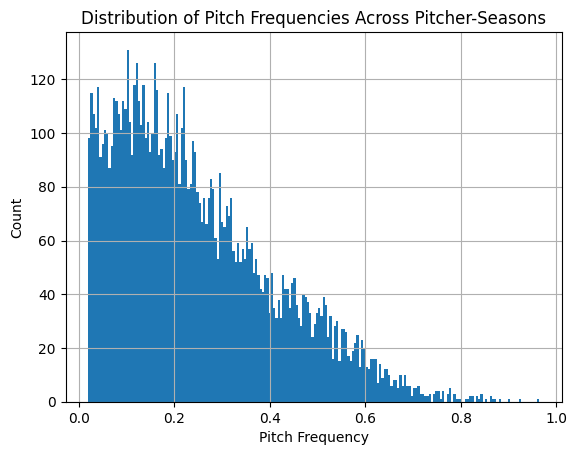

In [16]:
# Melt so you have one row per pitcher-pitch combo
pitch_freqs = pitcher_season_df.melt(
    id_vars=['pitcher'],
    value_vars=[col for col in pitcher_season_df.columns if col.endswith('_frac')],
    var_name='pitch_type',
    value_name='frequency'
)

pitch_freqs = pitch_freqs[pitch_freqs['frequency'] > 0]

# Sort to see lowest frequencies
lowest_freqs = pitch_freqs.sort_values('frequency').head(20)

low_freq_threshold = 0.02
rare_pitches = pitch_freqs[pitch_freqs['frequency'] < low_freq_threshold]
print(rare_pitches.sort_values('frequency'))

pitch_freqs['frequency'].hist(bins=200)
plt.xlabel('Pitch Frequency')
plt.ylabel('Count')
plt.title('Distribution of Pitch Frequencies Across Pitcher-Seasons')
plt.show()

In [17]:
league_avg = {}

for pitch in pitch_types:
    # columns for this pitch's metrics
    metric_cols = [
        col for col in pitcher_season_df.columns
        if col.endswith(f'_{pitch}')
        and not col.endswith('_frac')
        and not col.startswith('throws_')
    ]
    throws_col = f'throws_{pitch}'

    if not metric_cols or throws_col not in pitcher_season_df.columns:
        continue

    mask_has_pitch = pitcher_season_df[throws_col] == 1

    # League avg only among pitchers who actually throw this pitch (after your 2% cutoff)
    league_avg[pitch] = pitcher_season_df.loc[mask_has_pitch, metric_cols].mean()


In [18]:
for pitch in pitch_types:
    metric_cols = [
        col for col in pitcher_season_df.columns
        if col.endswith(f'_{pitch}')
        and not col.endswith('_frac')
        and not col.startswith('throws_')
    ]
    throws_col = f'throws_{pitch}'

    # Skip if we don't have this pitch, or no league average
    if pitch not in league_avg or not metric_cols or throws_col not in pitcher_season_df.columns:
        continue

    mask_no_pitch = pitcher_season_df[throws_col] == 0

    # For each metric column, fill non-throwers with the league-average value
    for col in metric_cols:
        fill_value = league_avg[pitch][col]  # scalar
        pitcher_season_df.loc[mask_no_pitch, col] = fill_value


In [19]:
id_cols = ['pitcher', 'game_year', 'name', 'name_first', 'name_last']
meta_cols = ['p_throws', 'role', 'p_throws_num']  # keep but don't scale/use as features
exclude_cols = [c for c in pitcher_season_df.columns if c.endswith('_frac') or c.startswith('throws_') or c in meta_cols]
feature_cols = [c for c in pitcher_season_df.columns if c not in id_cols + exclude_cols]

scaler = StandardScaler()
X_scaled = scaler.fit_transform(pitcher_season_df[feature_cols])

# Turn back into a DataFrame for readability
X_scaled_df = pd.DataFrame(X_scaled, columns=feature_cols, index=pitcher_season_df.index)


In [21]:
def find_similar_pitchers_by_name(
    pitcher_name: str,
    year: int,
    X_df: pd.DataFrame,
    meta_df: pd.DataFrame,
    n_neighbors: int = 10,
    overlay_df: pd.DataFrame | None = None,
    plot_overlays: bool = False,
    overlay_kwargs: dict | None = None,
):
    """
    Find the n_neighbors most similar pitcher-seasons to
    (pitcher_name, year) using cosine similarity in X_df.

    If plot_overlays is True and overlay_df is provided, also call
    compare_pitchers_overlay for (input pitcher, each neighbor).
    """

    # 1. Find the row index for this pitcher-season
    name_lower = meta_df['name'].str.lower()
    mask = (name_lower == pitcher_name.lower()) & (meta_df['game_year'] == year)
    idx = meta_df.index[mask]

    if len(idx) == 0:
        raise ValueError(f"No row found for name='{pitcher_name}', year={year}")
    if len(idx) > 1:
        raise ValueError(f"Multiple rows found for name='{pitcher_name}', year={year}")

    target_idx = idx[0]
    # Use canonical name from meta_df in case of casing differences
    base_name = meta_df.loc[target_idx, "name"]
    base_year = meta_df.loc[target_idx, "game_year"]

    # 2. Compute cosine similarity between this row and everyone
    sims = cosine_similarity(X_df.loc[[target_idx]], X_df)[0]
    sims_series = pd.Series(sims, index=X_df.index)

    # 3. Drop self and take top-k
    sims_series = sims_series.drop(index=target_idx)
    top_idx = sims_series.nlargest(n_neighbors).index
    top_sims = sims_series.loc[top_idx]

    # 4. Attach metadata
    result = meta_df.loc[top_idx, ['pitcher', 'game_year', 'name',
                                   'name_first', 'name_last']].copy()
    result['cosine_similarity'] = top_sims.values
    result = result.sort_values('cosine_similarity', ascending=False)

    # 5. Optionally: generate overlays
    if plot_overlays and overlay_df is not None:
        if overlay_kwargs is None:
            overlay_kwargs = {}
        for _, row in result.iterrows():
            compare_pitchers_overlay(
                df=overlay_df,
                nameA=base_name,
                yearA=base_year,
                nameB=row["name"],
                yearB=row["game_year"],
                **overlay_kwargs
            )

    return result


Using the raw, standardized space (X_scaled_df) for cosine similarity

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_22911/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


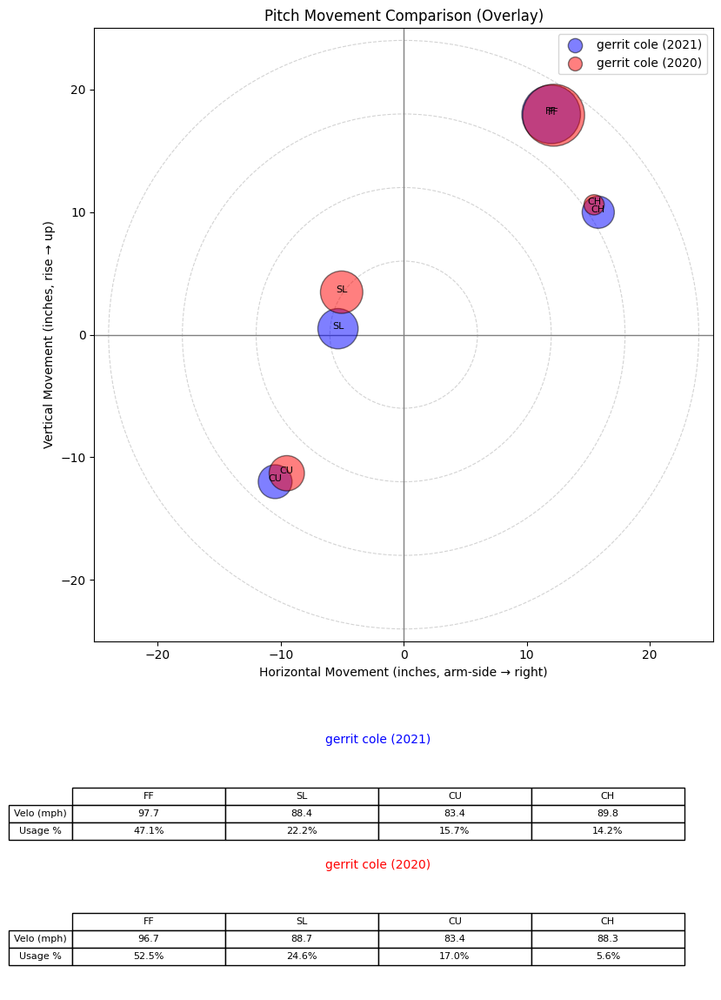

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_22911/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


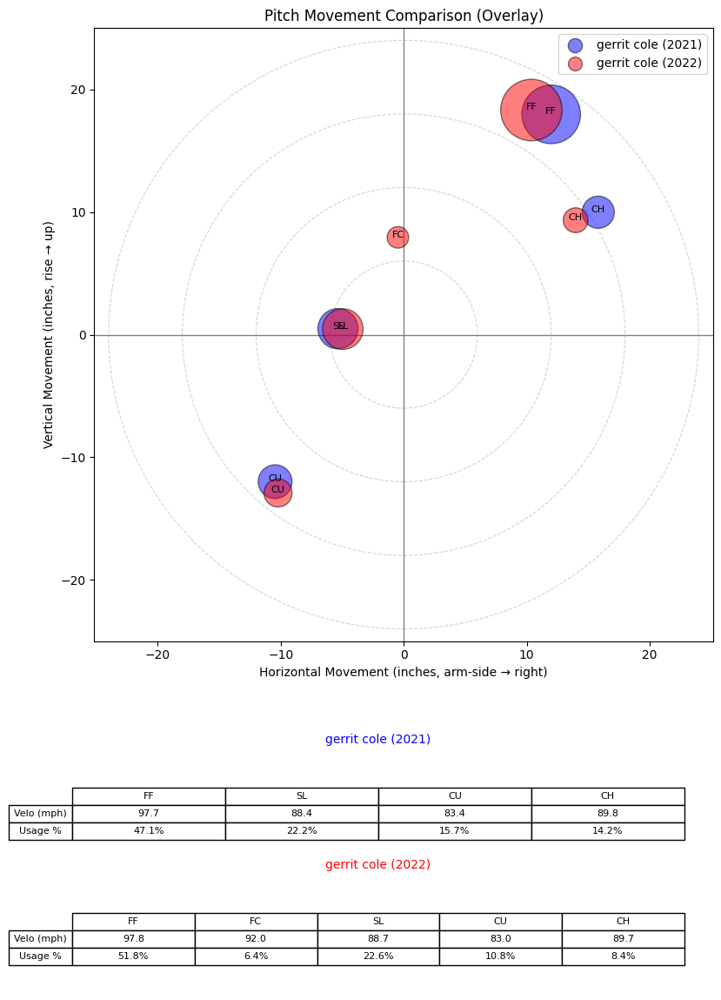

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_22911/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


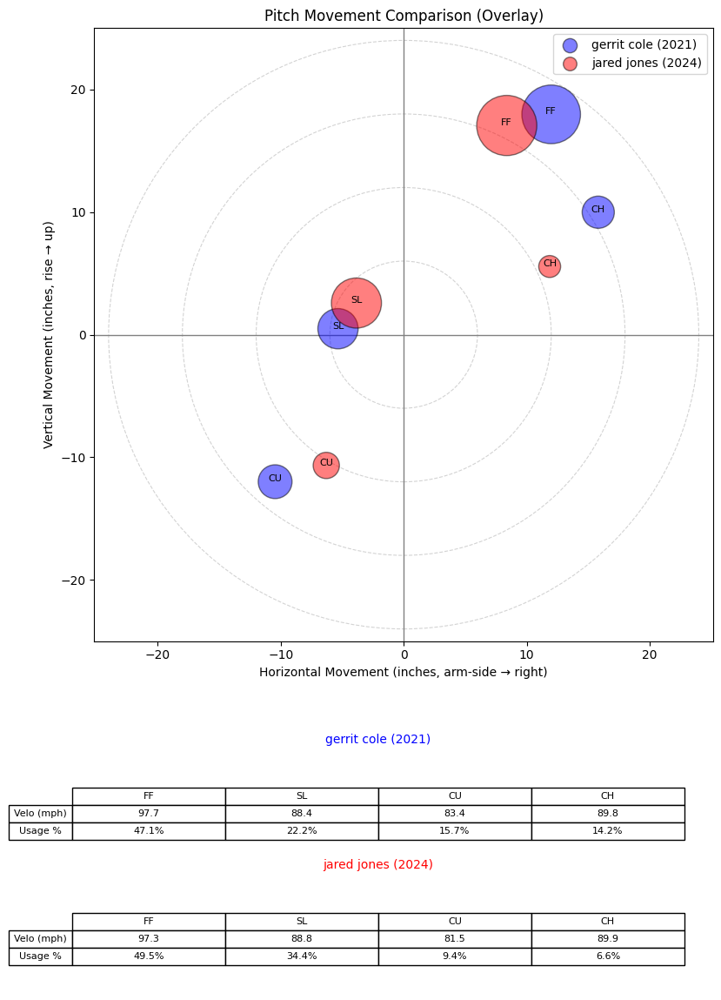

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_22911/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


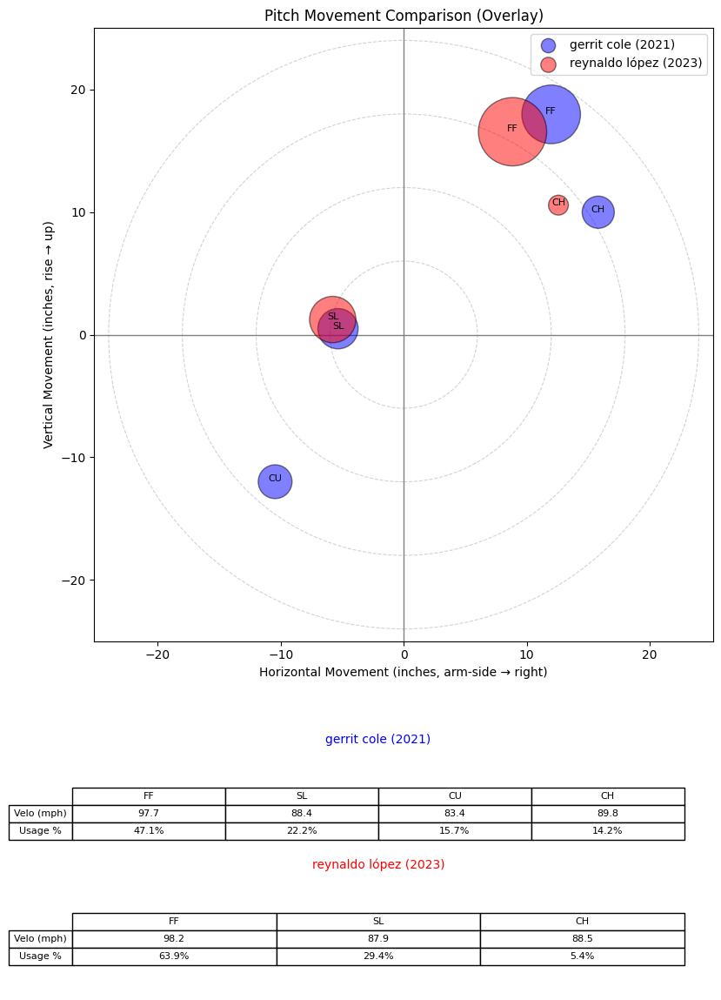

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_22911/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


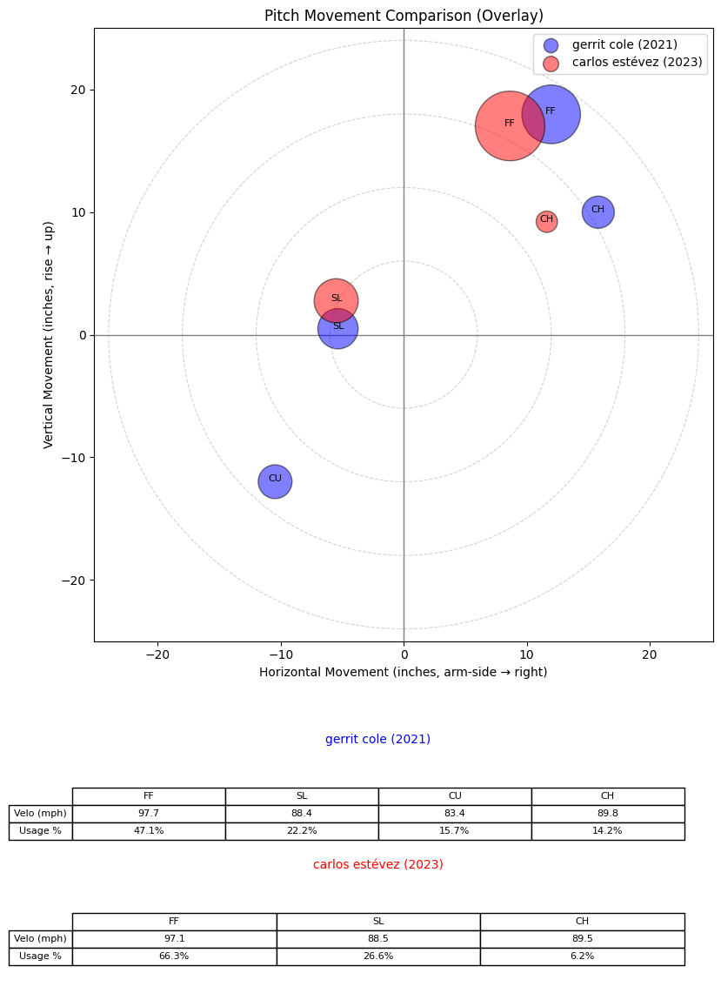

       pitcher  game_year            name name_first name_last  \
535   543037.0       2020     gerrit cole     gerrit      cole   
537   543037.0       2022     gerrit cole     gerrit      cole   
2083  683003.0       2024     jared jones      jared     jones   
1429  625643.0       2023  reynaldo lópez   reynaldo     lópez   
1218  608032.0       2023  carlos estévez     carlos   estévez   

      cosine_similarity  
535            0.955329  
537            0.867092  
2083           0.859433  
1429           0.828092  
1218           0.823301  


In [82]:
movement_long = reshape_pitcher_season_df(pitcher_season_df)

neighbors = find_similar_pitchers_by_name(
    pitcher_name="gerrit cole",
    year=2021,
    X_df=X_scaled_df,
    meta_df=pitcher_season_df,
    n_neighbors=5,
    overlay_df=movement_long,
    plot_overlays=True,
    overlay_kwargs={"lim_inches": 25, "size_scale": 5000},
)
print(neighbors)


Using PCA now for cosine similarity

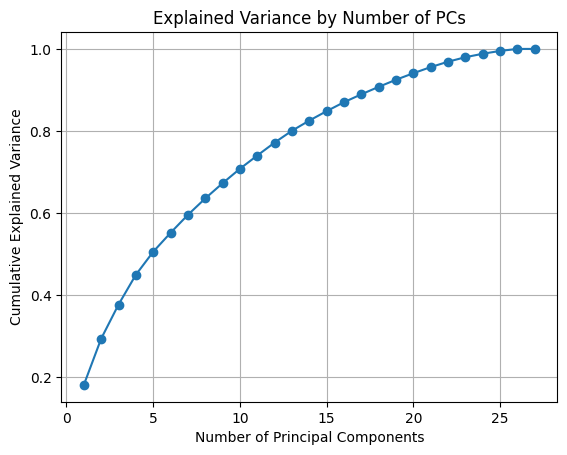

Number of components to explain 90% variance: 18


In [26]:
# Fit PCA
pca = PCA()
pca.fit(X_scaled_df)

# Explained variance ratio for each component
explained_variance = pca.explained_variance_ratio_

# Cumulative variance explained
cumulative_variance = np.cumsum(explained_variance)

# Plot
plt.plot(range(1, len(cumulative_variance)+1), cumulative_variance, marker='o')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance by Number of PCs')
plt.grid(True)
plt.show()

target_variance = 0.90  # e.g. keep 90% of total variance

n_components = np.argmax(cumulative_variance >= target_variance) + 1
print(f"Number of components to explain {target_variance*100:.0f}% variance: {n_components}")

In [27]:
pca = PCA(n_components=n_components)
X_pca = pca.fit_transform(X_scaled_df)

# Turn into a DataFrame with identical index
X_pca_df = pd.DataFrame(
    X_pca,
    index=X_scaled_df.index,
    columns=[f"PC{i+1}" for i in range(X_pca.shape[1])]
)

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


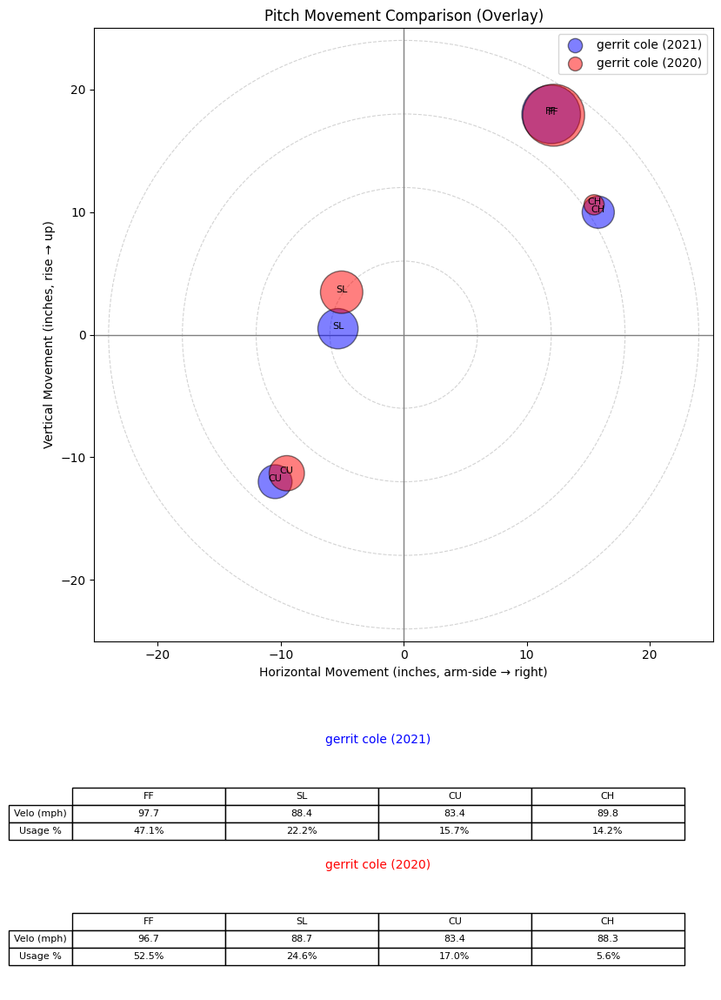

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


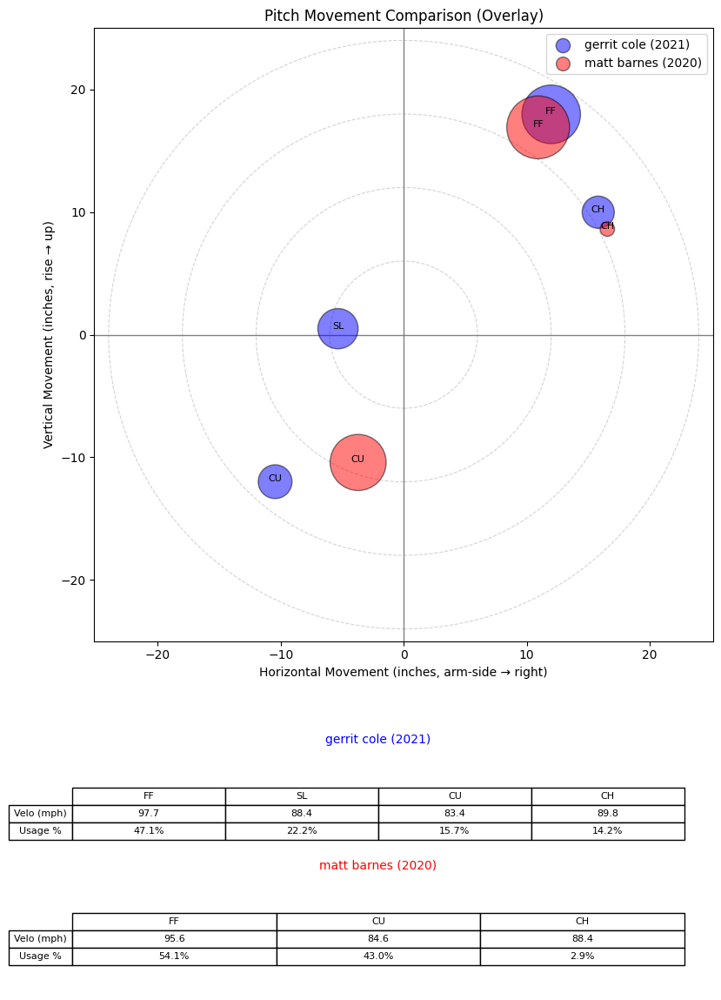

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


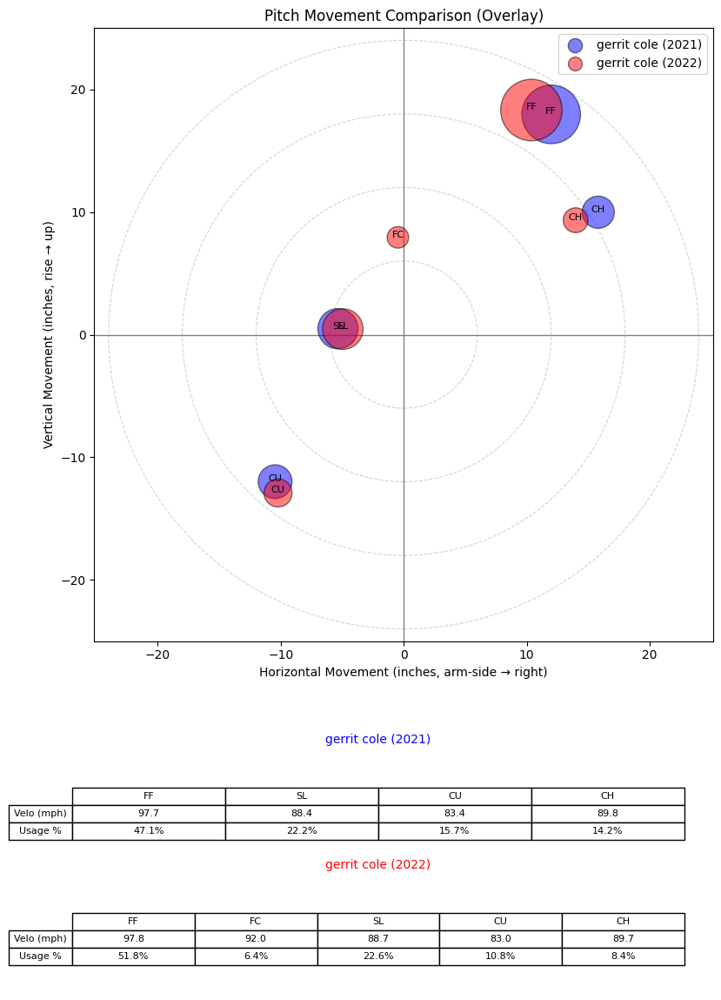

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


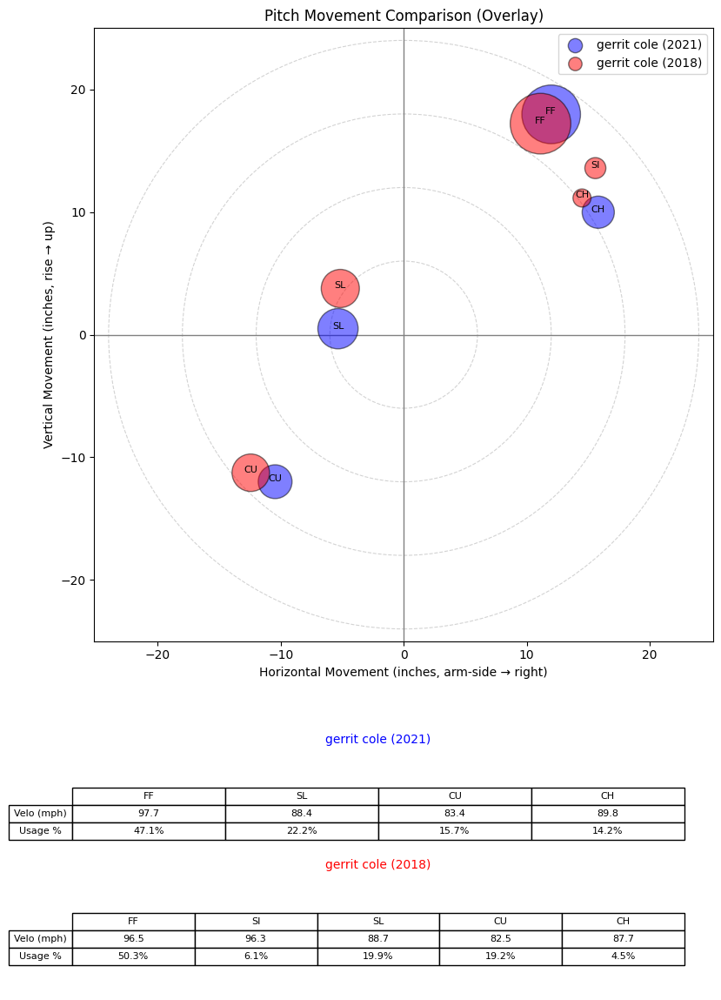

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


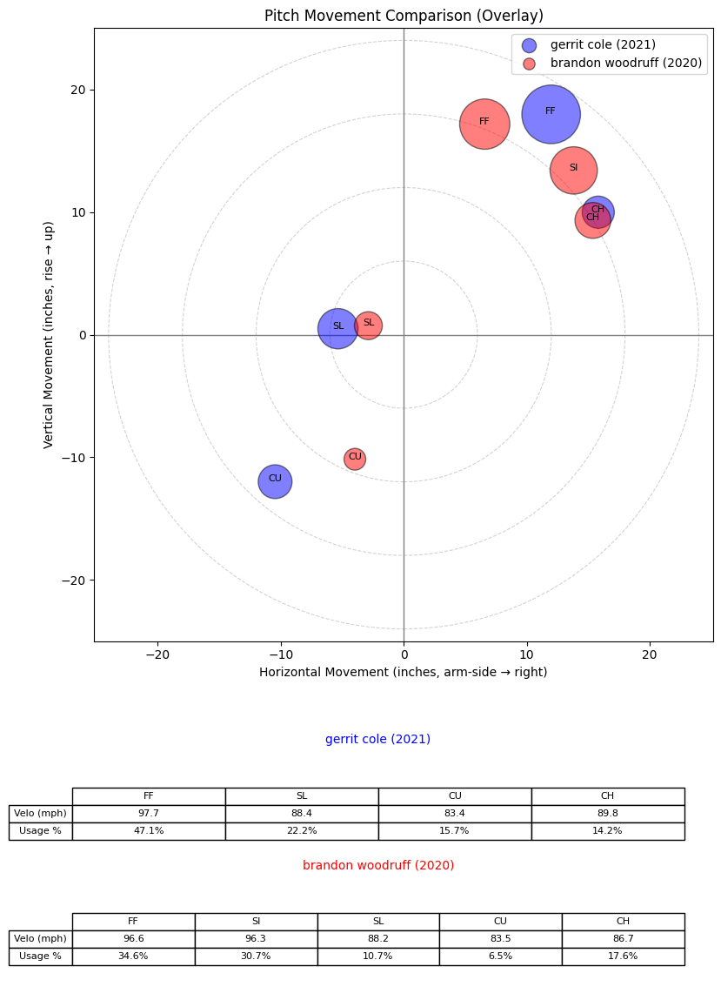

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


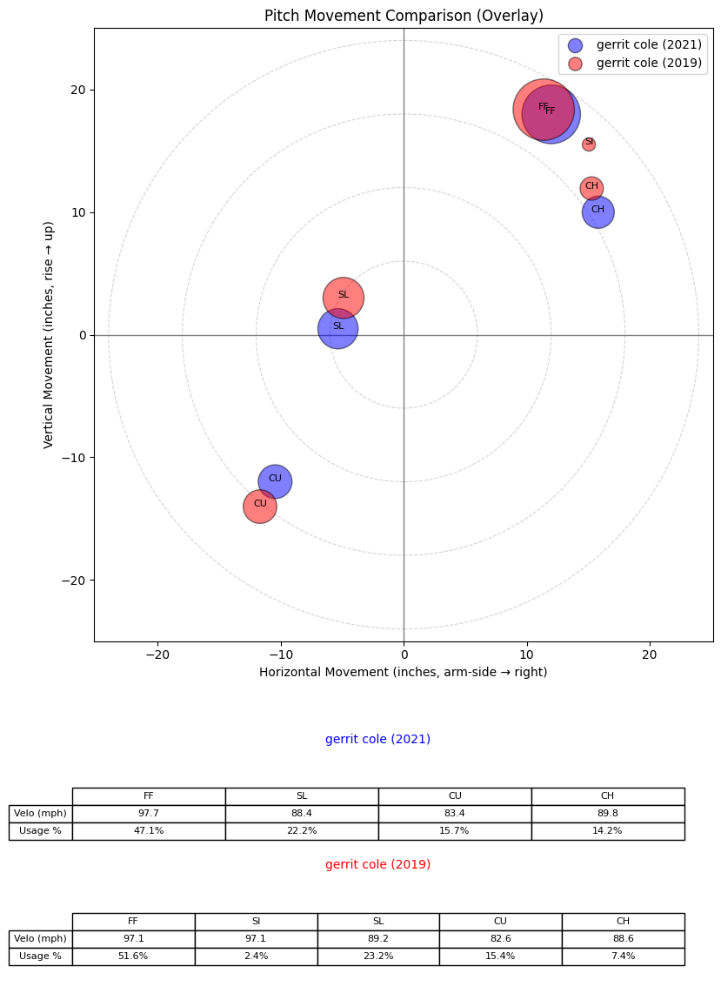

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


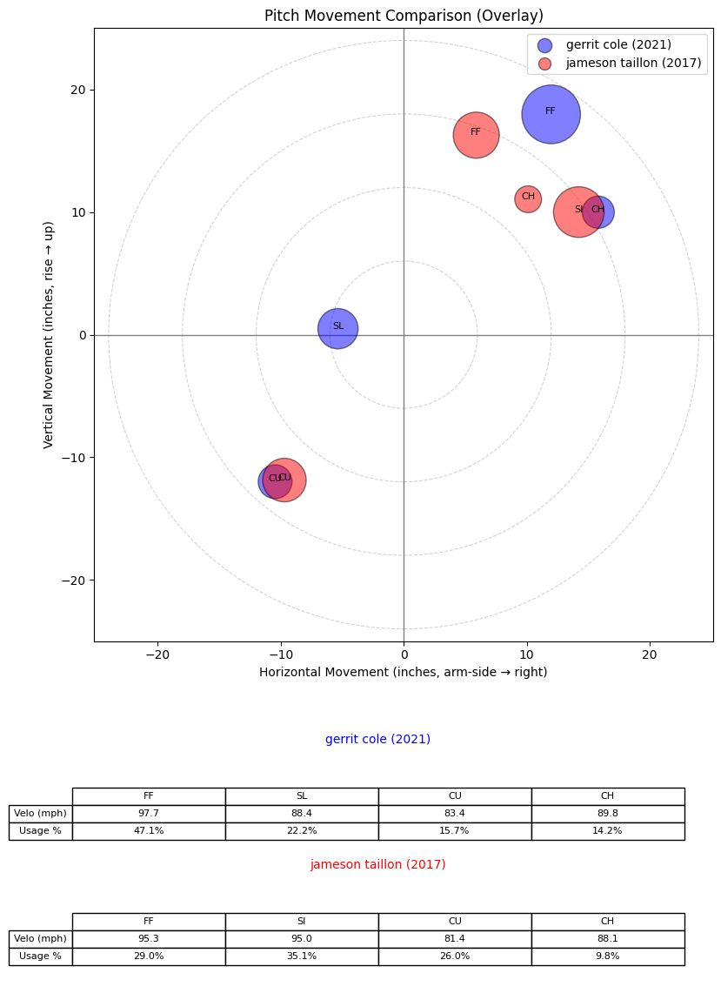

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


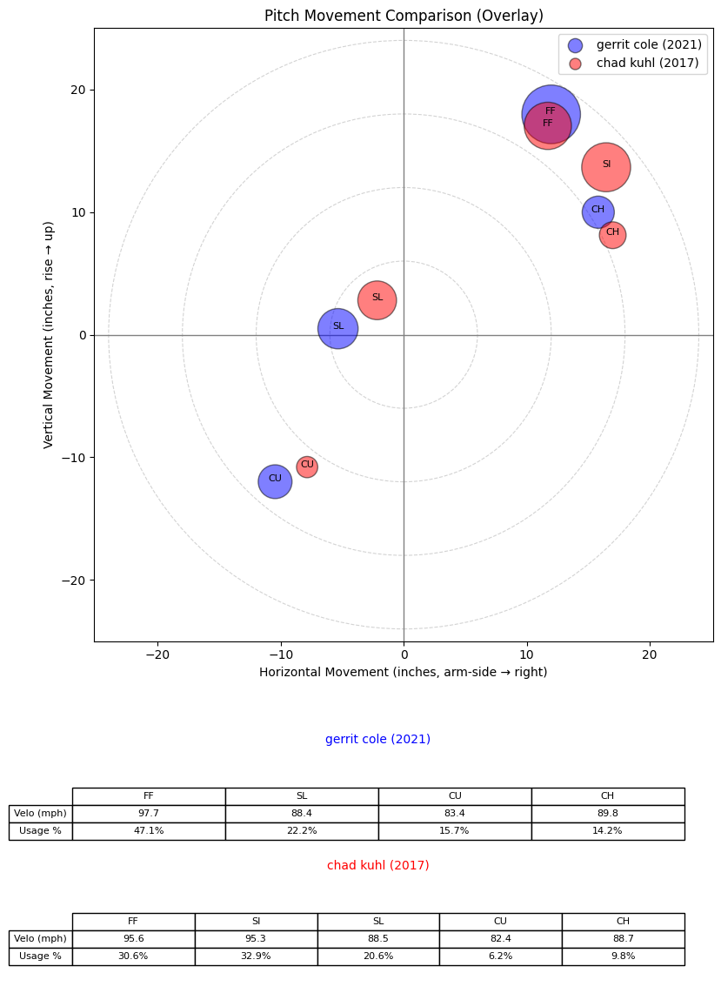

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


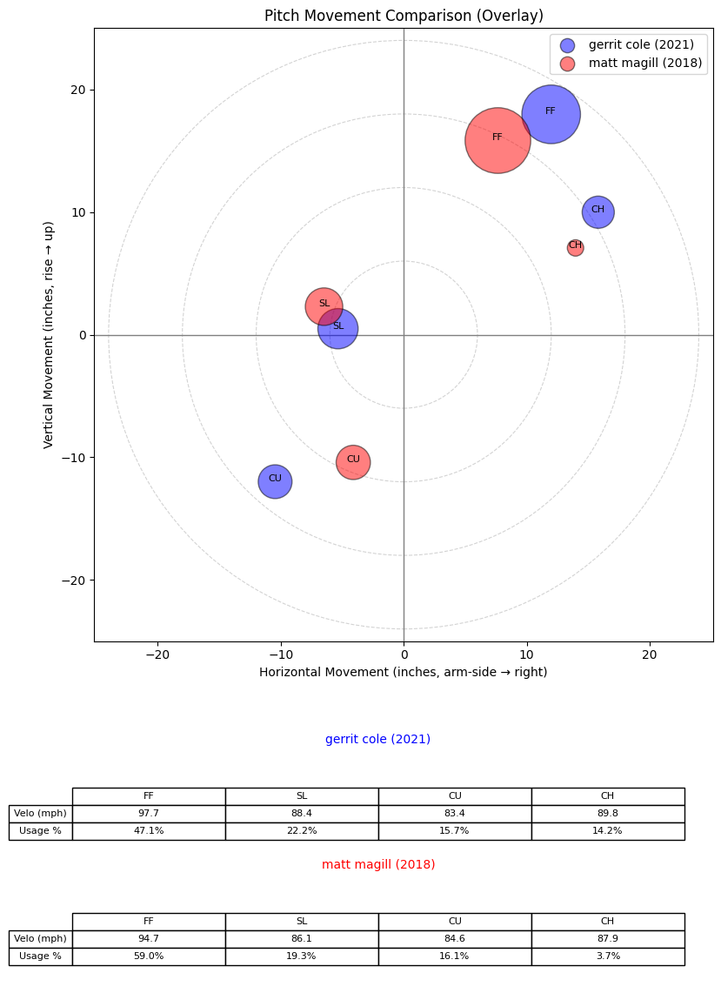

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


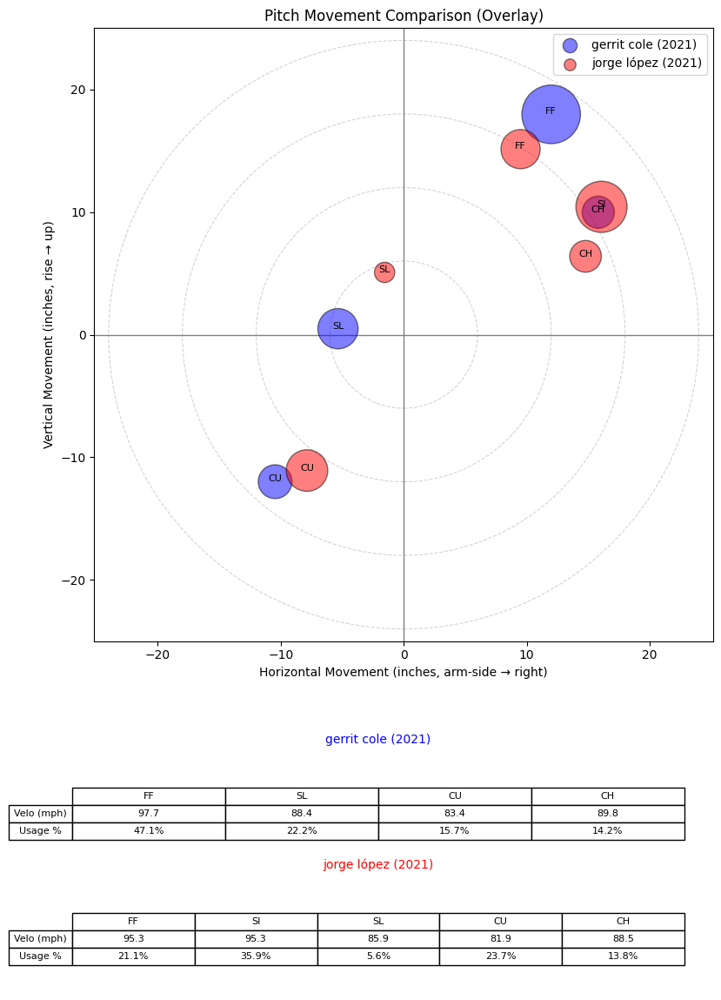

       pitcher  game_year              name name_first name_last  \
535   543037.0       2020       gerrit cole     gerrit      cole   
1007  598264.0       2020       matt barnes       matt    barnes   
537   543037.0       2022       gerrit cole     gerrit      cole   
533   543037.0       2018       gerrit cole     gerrit      cole   
1132  605540.0       2020  brandon woodruff    brandon  woodruff   
534   543037.0       2019       gerrit cole     gerrit      cole   
894   592791.0       2017   jameson taillon    jameson   taillon   
1515  641771.0       2017         chad kuhl       chad      kuhl   
589   543483.0       2018       matt magill       matt    magill   
1090  605347.0       2021       jorge lópez      jorge     lópez   

      cosine_similarity  
535            0.953488  
1007           0.905679  
537            0.889713  
533            0.885864  
1132           0.883376  
534            0.876286  
894            0.874230  
1515           0.867549  
589            0.

In [252]:
# Now reuse the exact same function, just change X_df
neighbors = find_similar_pitchers_by_name(
    pitcher_name="gerrit cole",
    year=2021,
    X_df=X_pca_df,
    meta_df=pitcher_season_df,
    n_neighbors=10,
    overlay_df=movement_long,
    plot_overlays=True,
    overlay_kwargs={"lim_inches": 25, "size_scale": 5000},
)
print(neighbors)

In [25]:
print(pitcher_season_df.columns)

Index(['pitcher', 'game_year', 'pfx_x_CH', 'pfx_x_CU', 'pfx_x_EP', 'pfx_x_FC',
       'pfx_x_FF', 'pfx_x_FS', 'pfx_x_KN', 'pfx_x_SI', 'pfx_x_SL', 'pfx_z_CH',
       'pfx_z_CU', 'pfx_z_EP', 'pfx_z_FC', 'pfx_z_FF', 'pfx_z_FS', 'pfx_z_KN',
       'pfx_z_SI', 'pfx_z_SL', 'release_speed_CH', 'release_speed_CU',
       'release_speed_EP', 'release_speed_FC', 'release_speed_FF',
       'release_speed_FS', 'release_speed_KN', 'release_speed_SI',
       'release_speed_SL', 'CH_frac', 'CU_frac', 'EP_frac', 'FC_frac',
       'FF_frac', 'FS_frac', 'KN_frac', 'SI_frac', 'SL_frac', 'release_pos_x',
       'release_pos_z', 'release_extension', 'p_throws', 'p_throws_num',
       'role', 'name_first', 'name_last', 'name', 'throws_FF', 'throws_SL',
       'throws_CH', 'throws_CU', 'throws_SI', 'throws_FC', 'throws_FS',
       'throws_KN', 'throws_EP'],
      dtype='object')


In [28]:
def find_similar_pitchers_by_name_same_hand_role(
    pitcher_name: str,
    year: int,
    X_df: pd.DataFrame,
    meta_df: pd.DataFrame,
    n_neighbors: int = 10,
    overlay_df: pd.DataFrame | None = None,
    plot_overlays: bool = False,
    overlay_kwargs: dict | None = None,
):
    """
    Same as find_similar_pitchers_by_name, but restricts neighbors to
    the same handedness (p_throws) and role ('starter'/'reliever') as
    the input pitcher.
    """

    # 1. Find the row index for this pitcher-season
    name_lower = meta_df['name'].str.lower()
    mask = (name_lower == pitcher_name.lower()) & (meta_df['game_year'] == year)
    idx = meta_df.index[mask]

    if len(idx) == 0:
        raise ValueError(f"No row found for name='{pitcher_name}', year={year}")
    if len(idx) > 1:
        raise ValueError(f"Multiple rows found for name='{pitcher_name}', year={year}")

    target_idx = idx[0]

    # canonical info for this pitcher-season
    base_name = meta_df.loc[target_idx, "name"]
    base_year = meta_df.loc[target_idx, "game_year"]
    base_hand = meta_df.loc[target_idx, "p_throws"]    # "R" / "L"
    base_role = meta_df.loc[target_idx, "role"]        # "starter" / "reliever"

    # 2. Cosine similarity to everyone
    sims = cosine_similarity(X_df.loc[[target_idx]], X_df)[0]
    sims_series = pd.Series(sims, index=X_df.index)

    # 3. Restrict to same hand + same role, and drop self
    same_group_mask = (
        (meta_df['p_throws'] == base_hand) &
        (meta_df['role'] == base_role) &
        (meta_df.index != target_idx)
    )
    sims_series = sims_series[same_group_mask]

    # 4. Take top-k
    top_idx = sims_series.nlargest(n_neighbors).index
    top_sims = sims_series.loc[top_idx]

    # 5. Attach metadata
    result = meta_df.loc[top_idx, ['pitcher', 'game_year', 'name',
                                   'name_first', 'name_last',
                                   'p_throws', 'role']].copy()
    result['cosine_similarity'] = top_sims.values
    result = result.sort_values('cosine_similarity', ascending=False)

    # 6. Optional overlays
    if plot_overlays and overlay_df is not None:
        if overlay_kwargs is None:
            overlay_kwargs = {}
        for _, row in result.iterrows():
            compare_pitchers_overlay(
                df=overlay_df,
                nameA=base_name,
                yearA=base_year,
                nameB=row["name"],
                yearB=row["game_year"],
                **overlay_kwargs
            )

    return result


/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


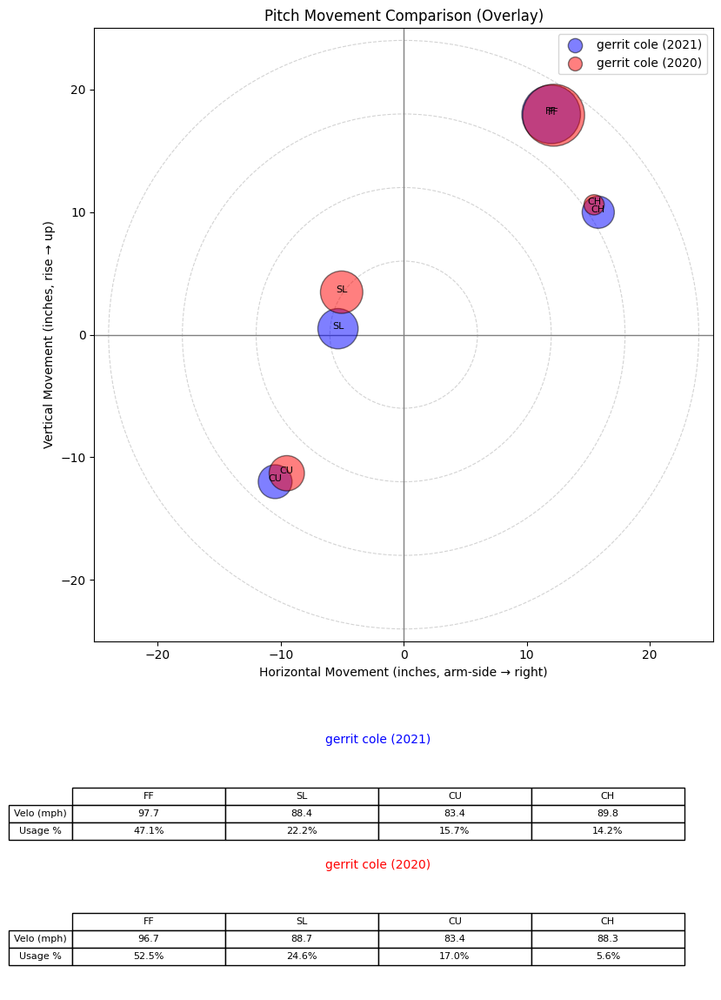

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


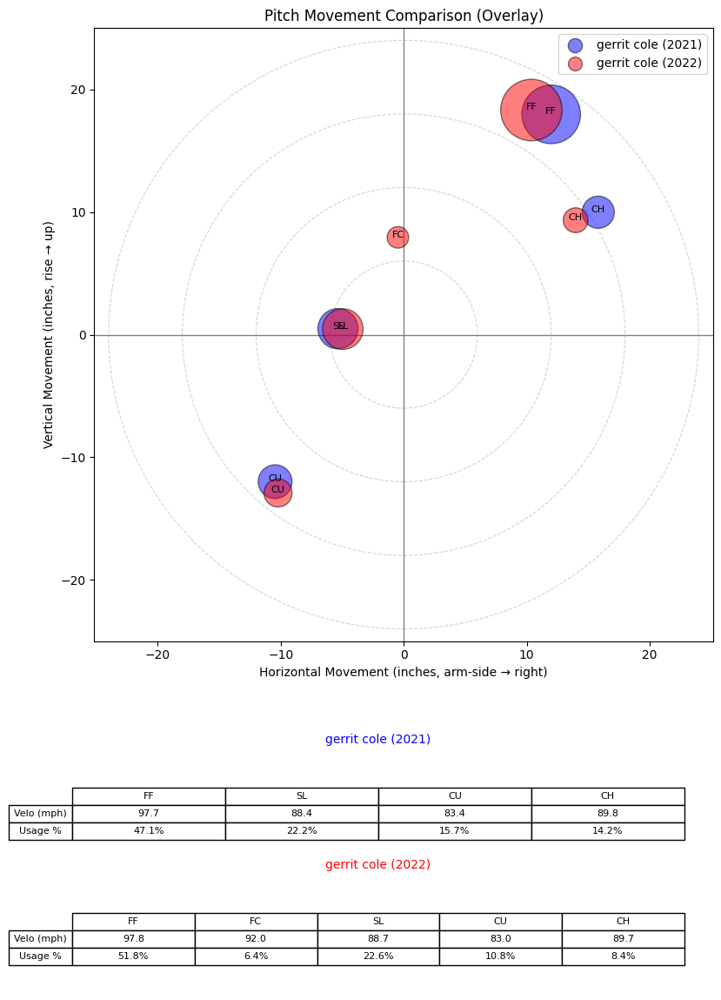

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


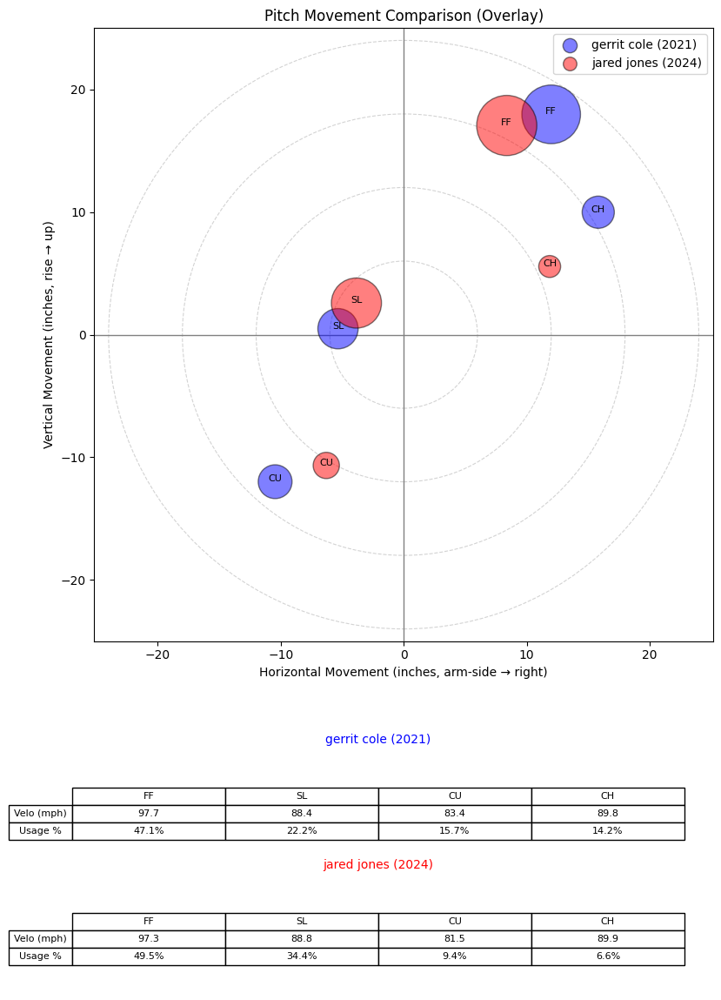

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


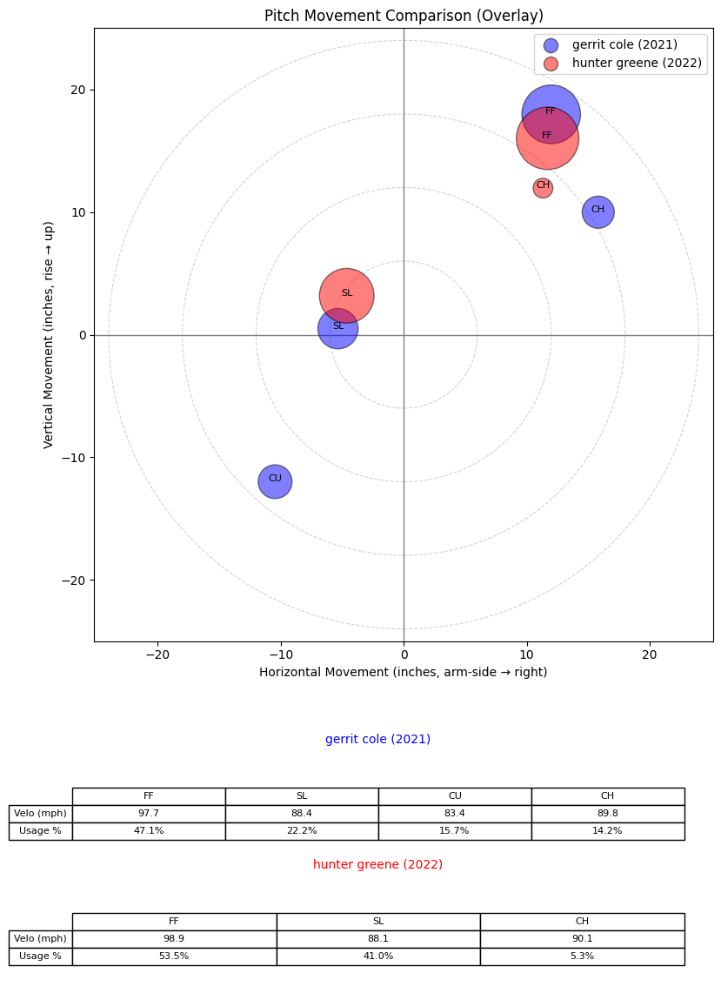

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


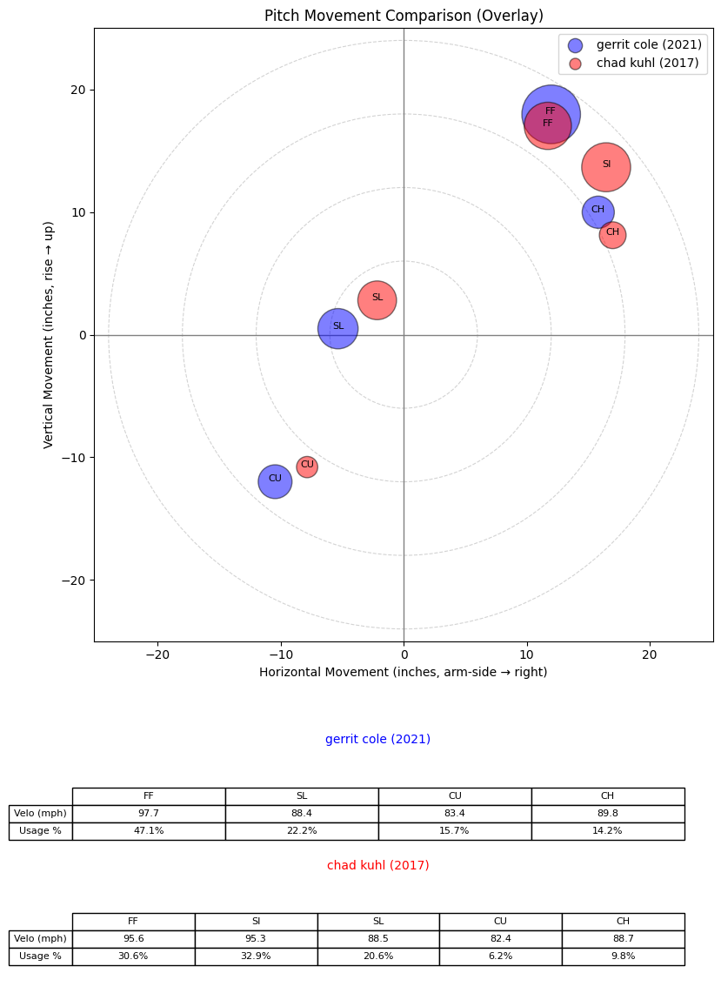

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


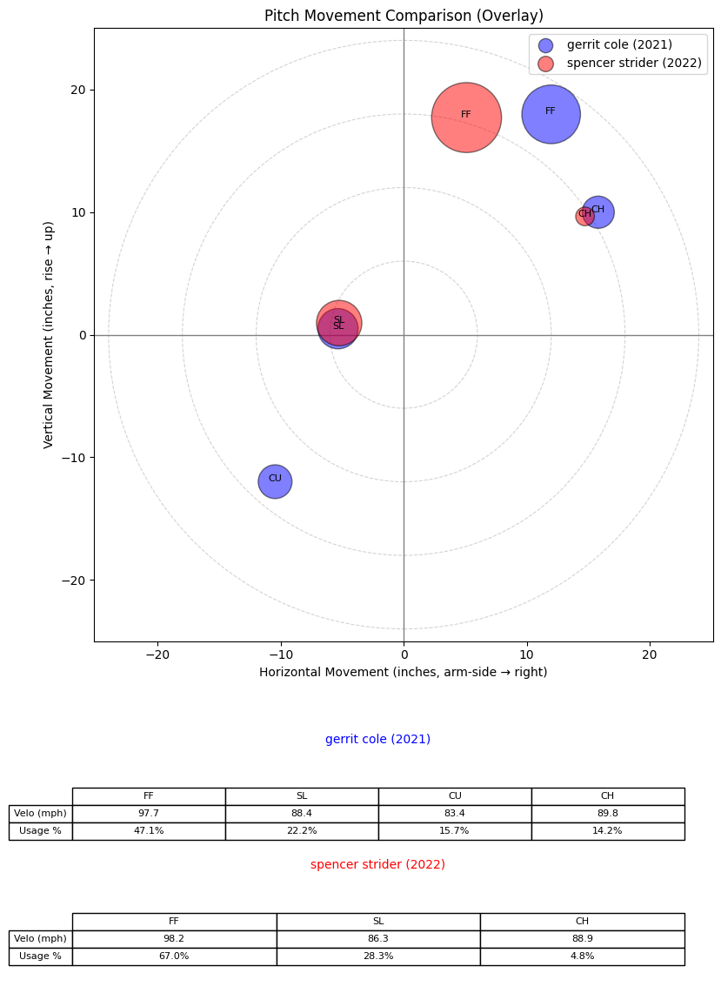

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


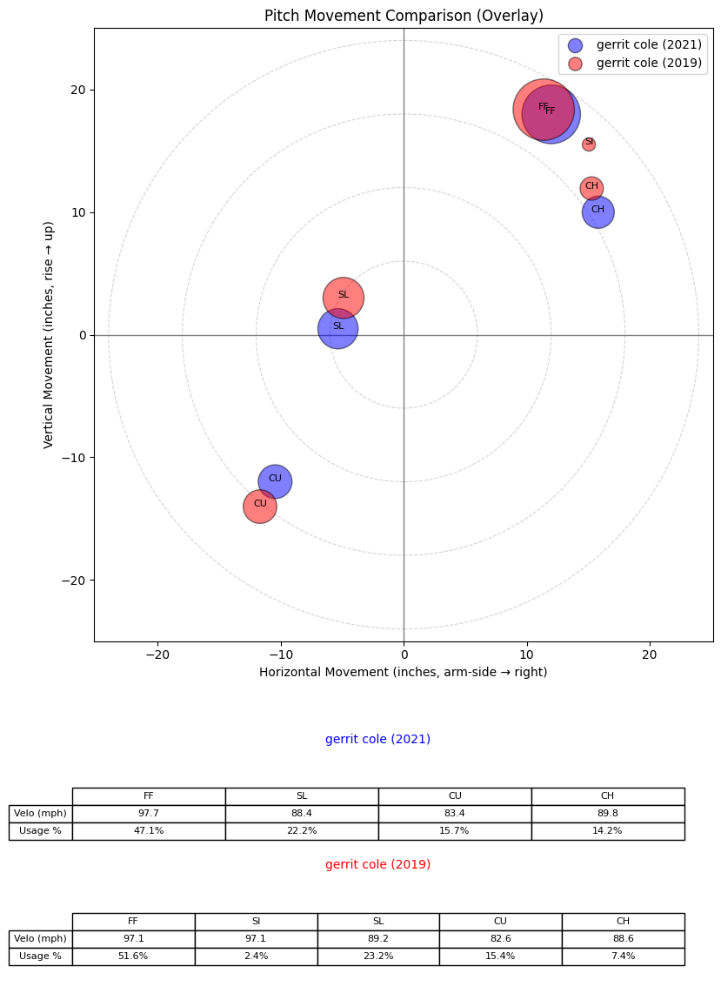

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


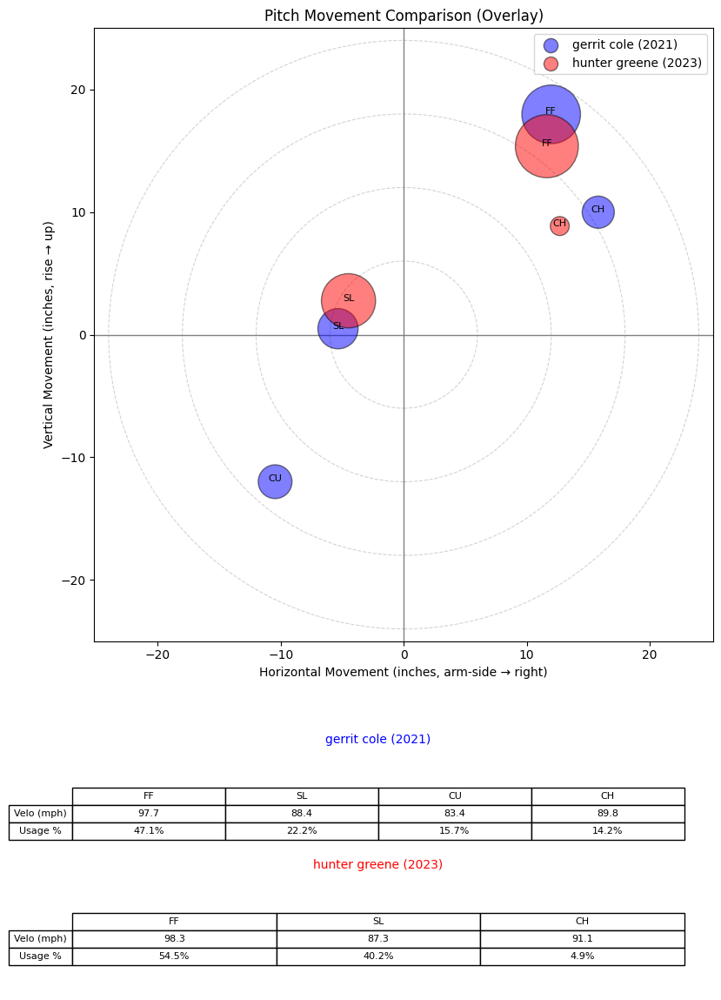

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


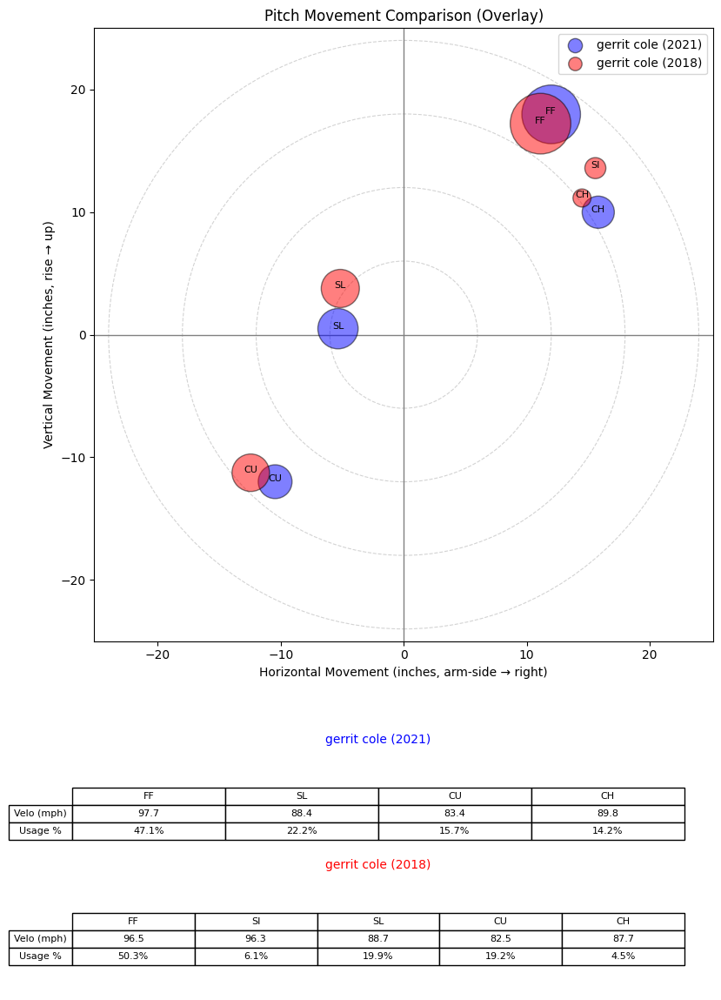

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


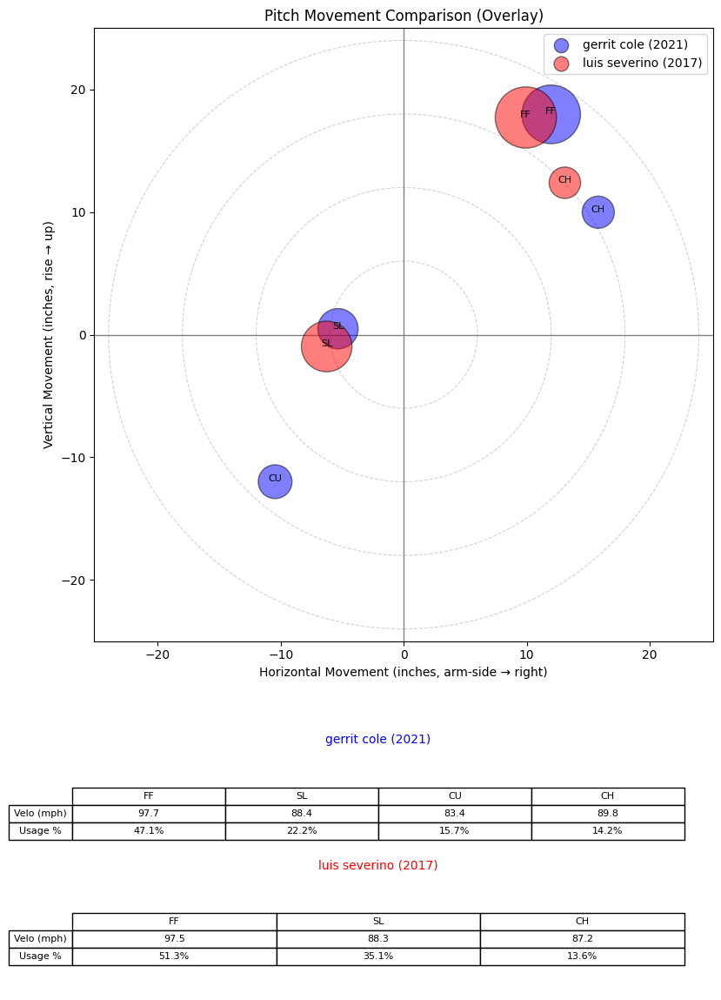

,pitcher,game_year,name,name_first,name_last,p_throws,role,cosine_similarity
535,543037.0,2020,gerrit cole,gerrit,cole,R,starter,0.955329
537,543037.0,2022,gerrit cole,gerrit,cole,R,starter,0.867092
2083,683003.0,2024,jared jones,jared,jones,R,starter,0.859433
1925,668881.0,2022,hunter greene,hunter,greene,R,starter,0.785916
1515,641771.0,2017,chad kuhl,chad,kuhl,R,starter,0.776105
2024,675911.0,2022,spencer strider,spencer,strider,R,starter,0.773680
534,543037.0,2019,gerrit cole,gerrit,cole,R,starter,0.770408
1926,668881.0,2023,hunter greene,hunter,greene,R,starter,0.769195
533,543037.0,2018,gerrit cole,gerrit,cole,R,starter,0.765934
1388,622663.0,2017,luis severino,luis,severino,R,starter,0.756207


In [253]:
neighbors_same = find_similar_pitchers_by_name_same_hand_role(
    pitcher_name="gerrit cole",
    year=2021,
    X_df=X_scaled_df,
    meta_df=pitcher_season_df,
    n_neighbors=10,
    overlay_df=movement_long,  # or whatever df your compare_pitchers_overlay expects
    plot_overlays=True,
    overlay_kwargs={"lim_inches": 25, "size_scale": 5000},
)
display(neighbors_same)


/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


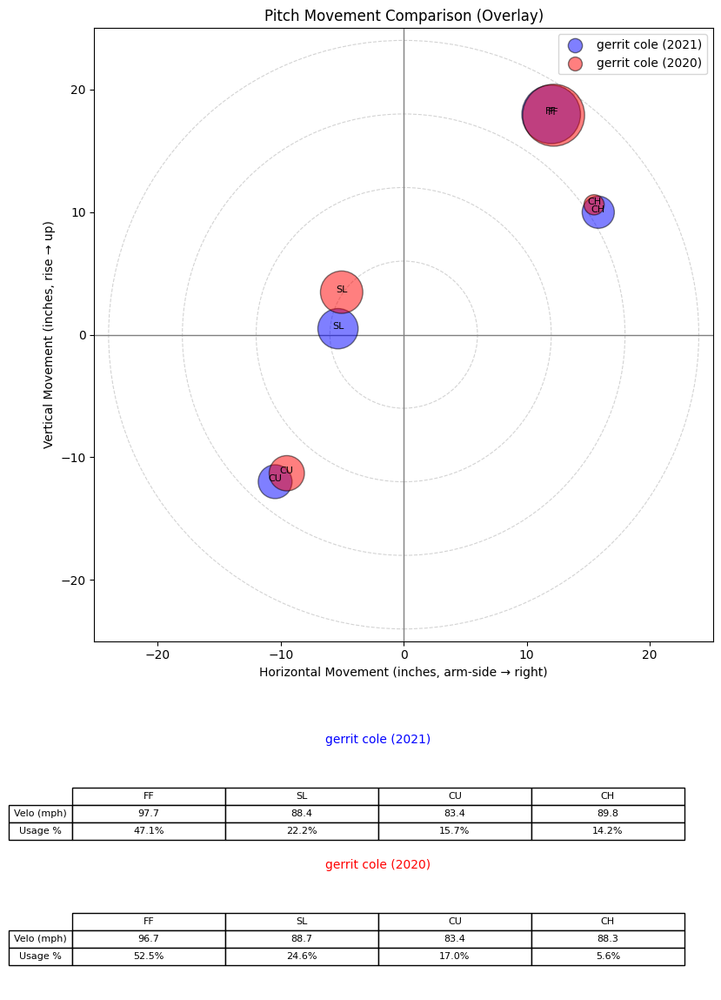

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


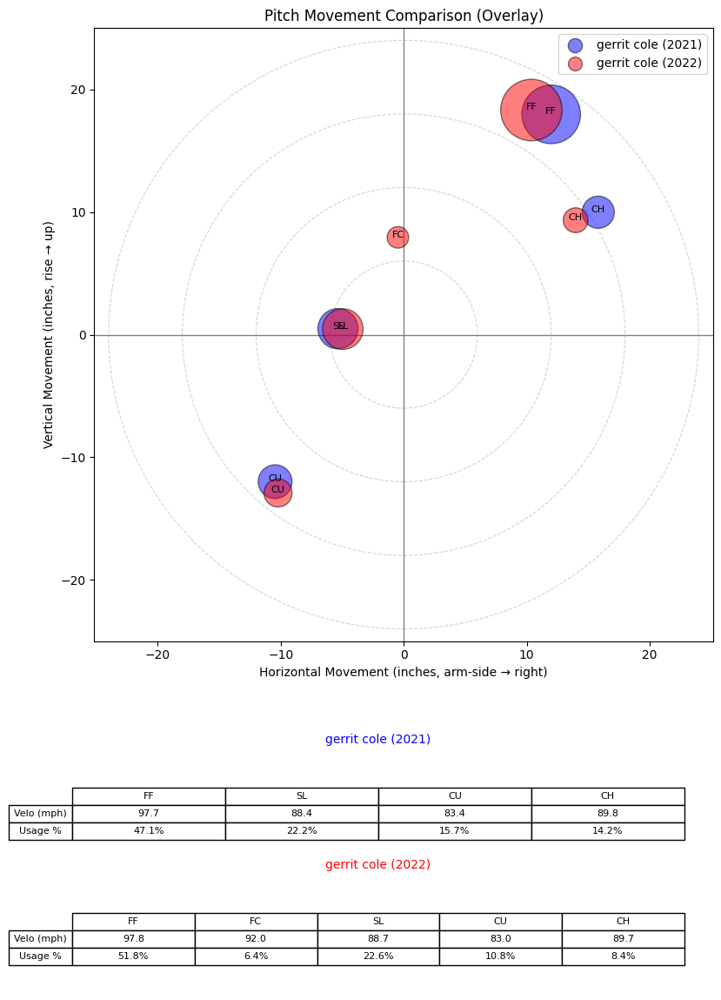

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


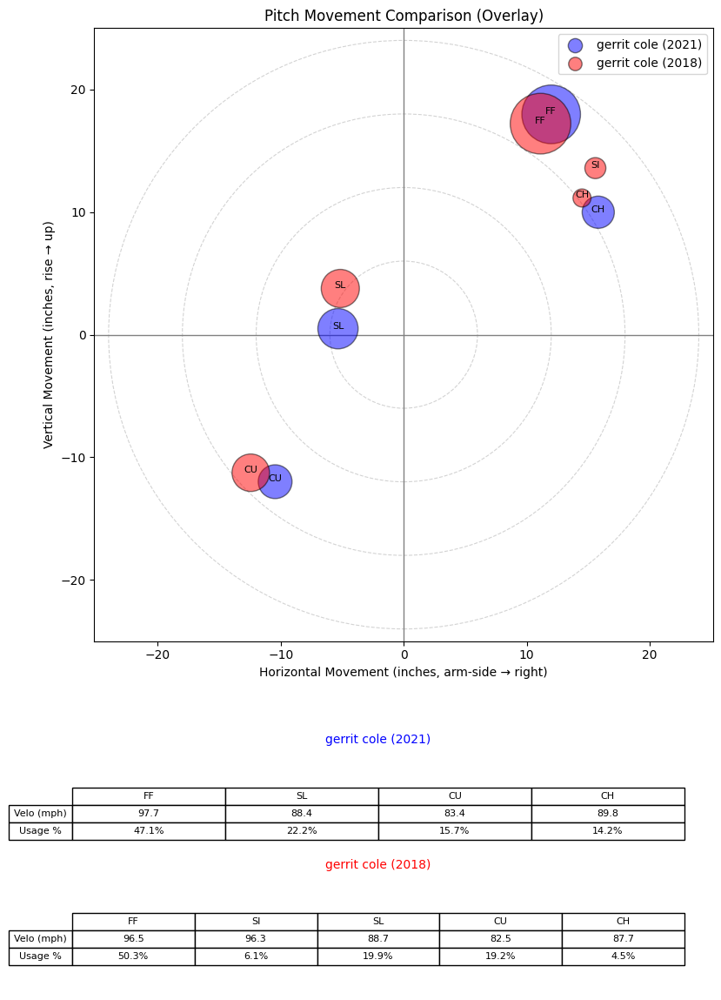

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


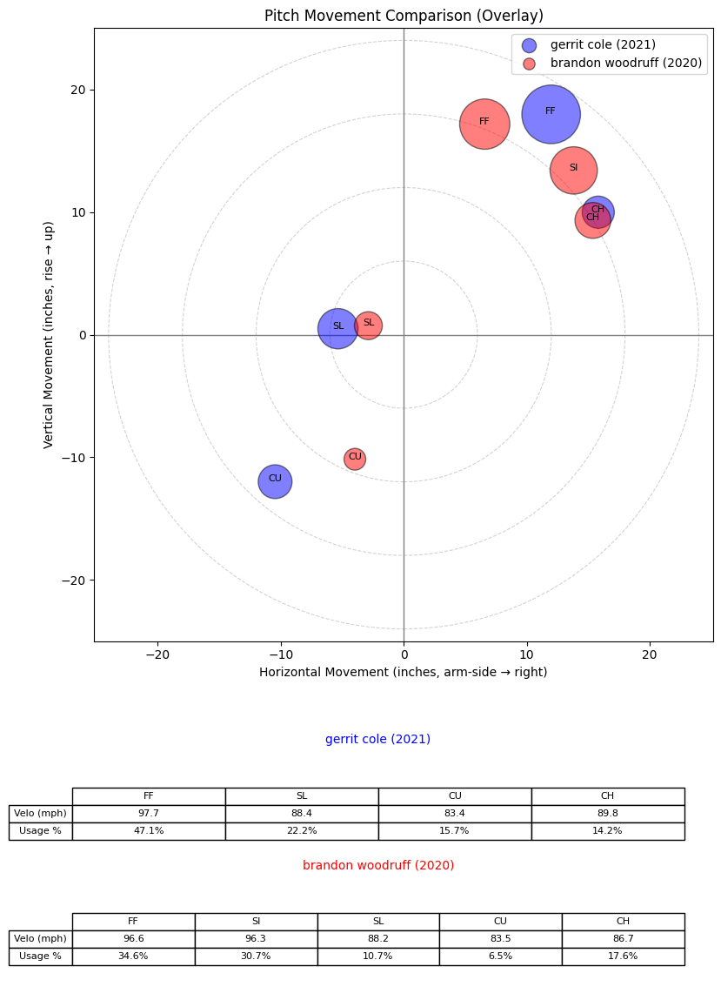

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


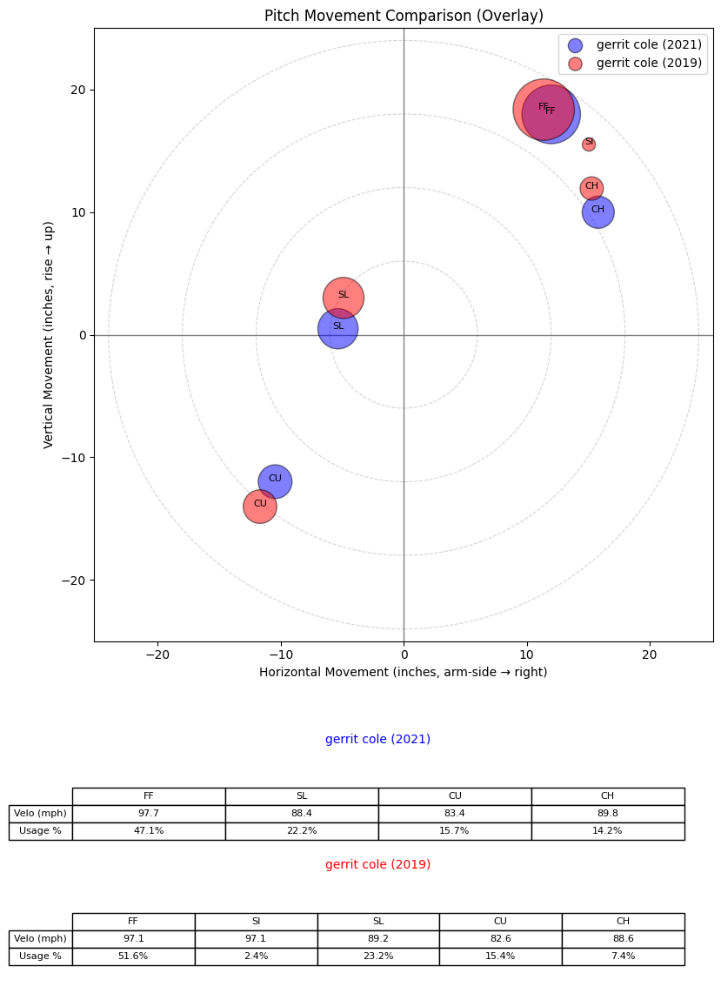

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


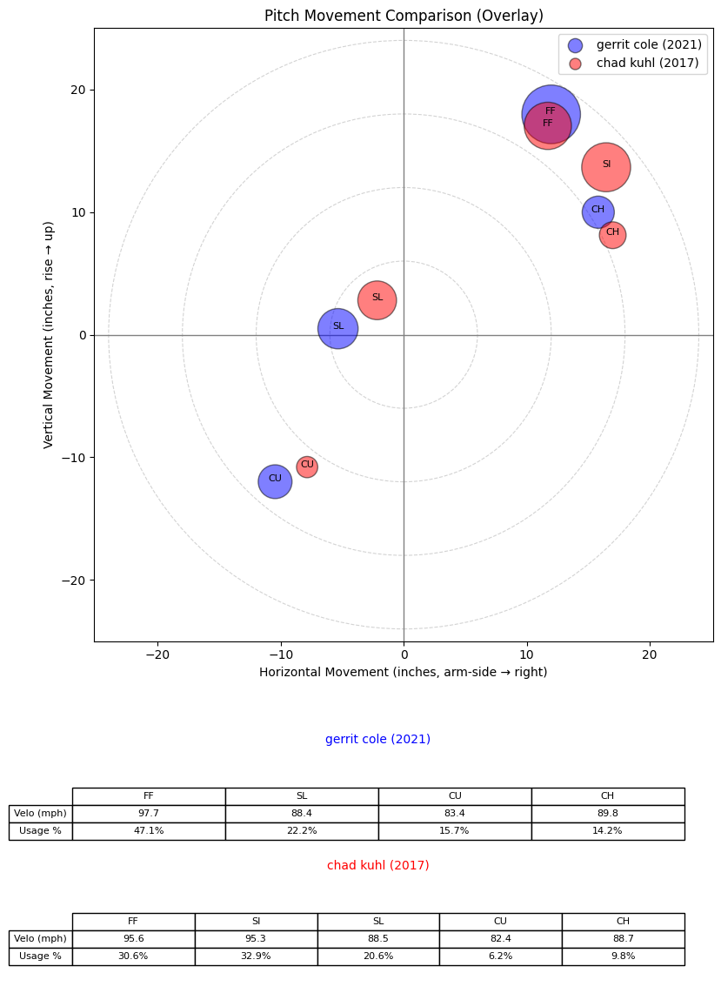

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


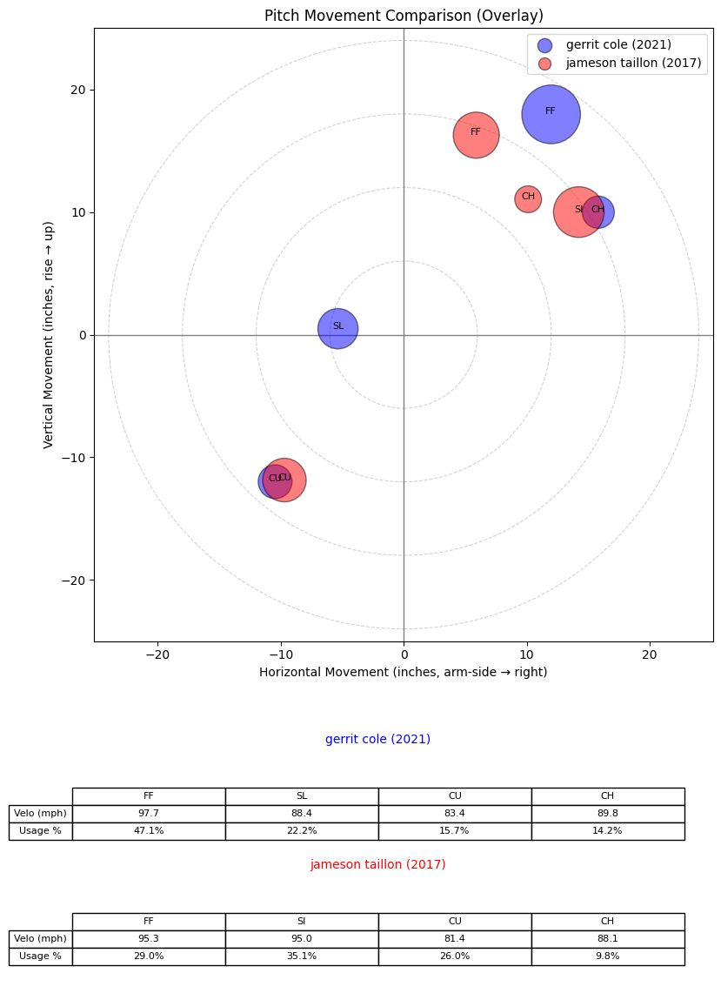

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


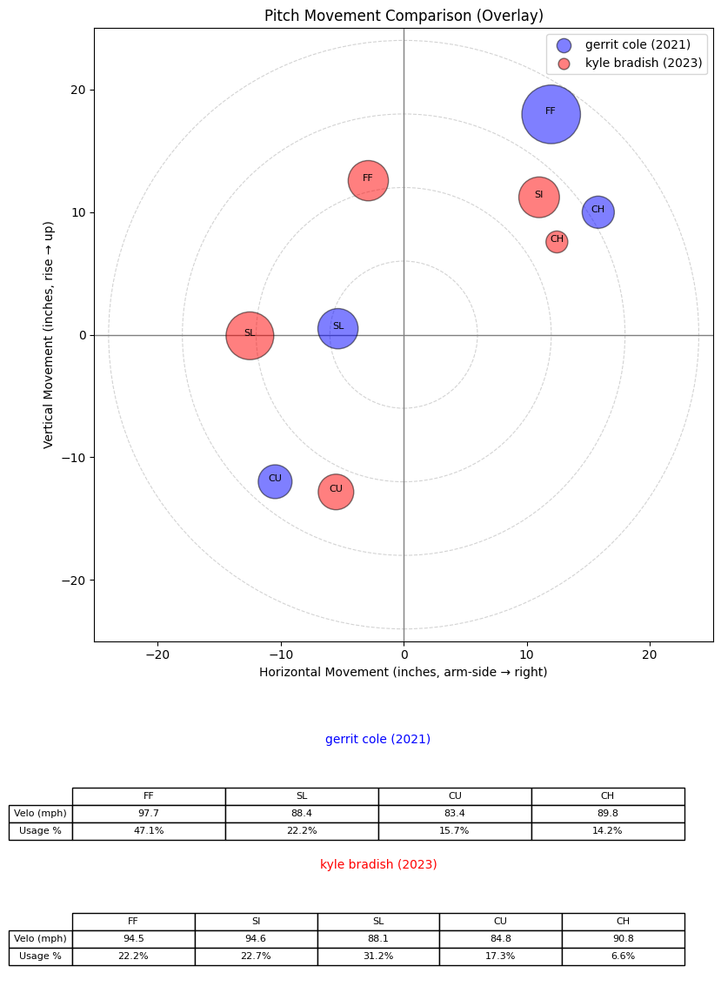

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


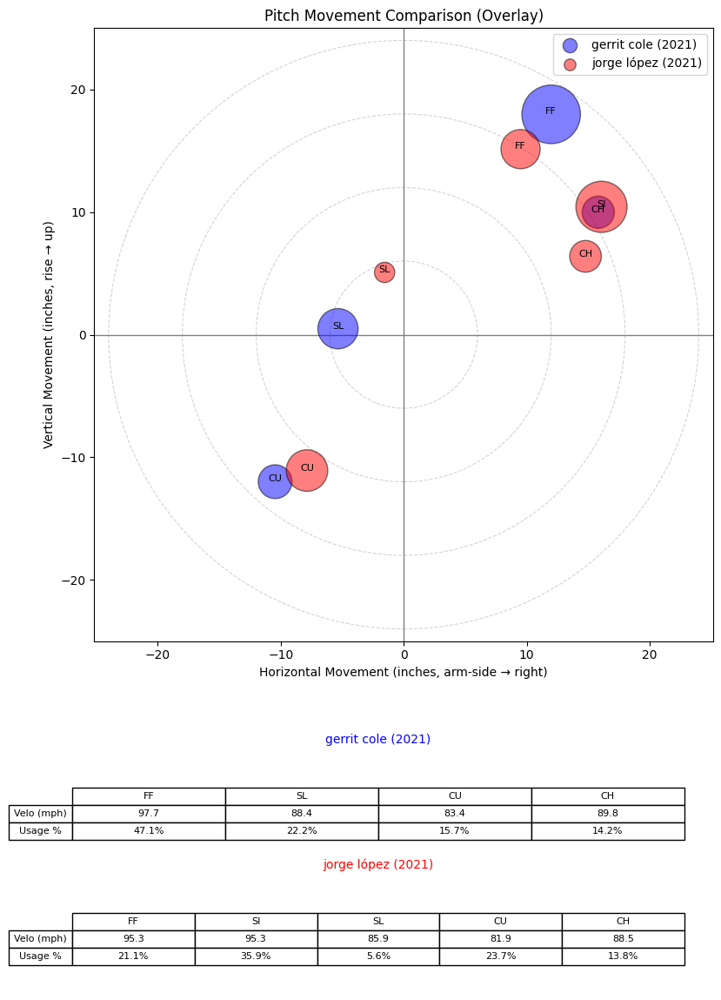

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


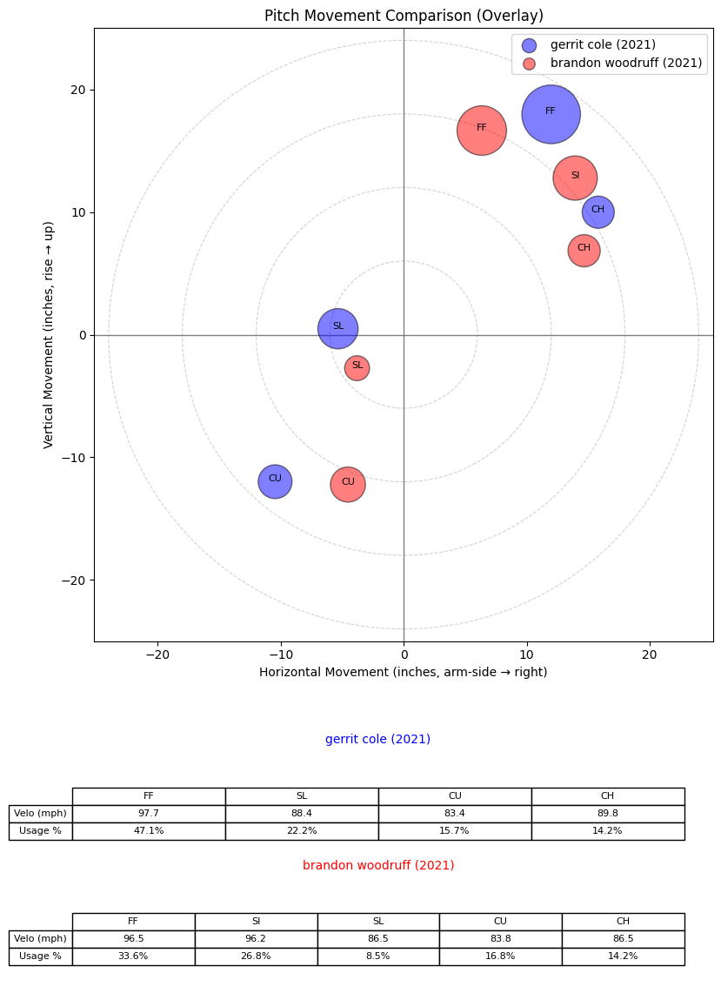

,pitcher,game_year,name,name_first,name_last,p_throws,role,cosine_similarity
535,543037.0,2020,gerrit cole,gerrit,cole,R,starter,0.953627
537,543037.0,2022,gerrit cole,gerrit,cole,R,starter,0.901558
533,543037.0,2018,gerrit cole,gerrit,cole,R,starter,0.890623
1132,605540.0,2020,brandon woodruff,brandon,woodruff,R,starter,0.888780
534,543037.0,2019,gerrit cole,gerrit,cole,R,starter,0.877606
1515,641771.0,2017,chad kuhl,chad,kuhl,R,starter,0.875560
894,592791.0,2017,jameson taillon,jameson,taillon,R,starter,0.874906
2069,680694.0,2023,kyle bradish,kyle,bradish,R,starter,0.858235
1090,605347.0,2021,jorge lópez,jorge,lópez,R,starter,0.850163
1133,605540.0,2021,brandon woodruff,brandon,woodruff,R,starter,0.839118


In [140]:
neighbors_same = find_similar_pitchers_by_name_same_hand_role(
    pitcher_name="gerrit cole",
    year=2021,
    X_df=X_pca_df,
    meta_df=pitcher_season_df,
    n_neighbors=10,
    overlay_df=movement_long,  # or whatever df your compare_pitchers_overlay expects
    plot_overlays=True,
    overlay_kwargs={"lim_inches": 25, "size_scale": 5000},
)
display(neighbors_same)


In [ ]:
neighbors_same = find_similar_pitchers_by_name_same_hand_role(
    pitcher_name="aroldis chapman",
    year=2023,
    X_df=X_scaled_df,
    meta_df=pitcher_season_df,
    n_neighbors=10,
    overlay_df=movement_long,  # or whatever df your compare_pitchers_overlay expects
    plot_overlays=True,
    overlay_kwargs={"lim_inches": 25, "size_scale": 5000},
)
display(neighbors_same)


In [ ]:
neighbors_same = find_similar_pitchers_by_name_same_hand_role(
    pitcher_name="aroldis chapman",
    year=2023,
    X_df=X_pca_df,
    meta_df=pitcher_season_df,
    n_neighbors=10,
    overlay_df=movement_long,  # or whatever df your compare_pitchers_overlay expects
    plot_overlays=True,
    overlay_kwargs={"lim_inches": 25, "size_scale": 5000},
)
display(neighbors_same)


In [ ]:
neighbors_same = find_similar_pitchers_by_name_same_hand_role(
    pitcher_name="brusdar graterol",
    year=2023,
    X_df=X_scaled_df,
    meta_df=pitcher_season_df,
    n_neighbors=10,
    overlay_df=movement_long,  # or whatever df your compare_pitchers_overlay expects
    plot_overlays=True,
    overlay_kwargs={"lim_inches": 25, "size_scale": 5000},
)
display(neighbors_same)


In [ ]:
neighbors_same = find_similar_pitchers_by_name_same_hand_role(
    pitcher_name="brusdar graterol",
    year=2023,
    X_df=X_pca_df,
    meta_df=pitcher_season_df,
    n_neighbors=10,
    overlay_df=movement_long,  # or whatever df your compare_pitchers_overlay expects
    plot_overlays=True,
    overlay_kwargs={"lim_inches": 25, "size_scale": 5000},
)
display(neighbors_same)


Below I will begin clustering, starting with K-Means in the raw, standardized space.

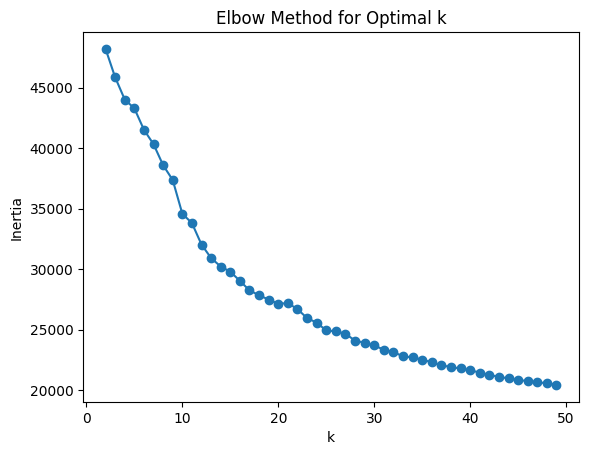

In [254]:
inertias = []
K = range(2, 50)
for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_scaled_df)
    inertias.append(kmeans.inertia_)

plt.plot(K, inertias, 'o-')
plt.xlabel('k')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal k')
plt.show()

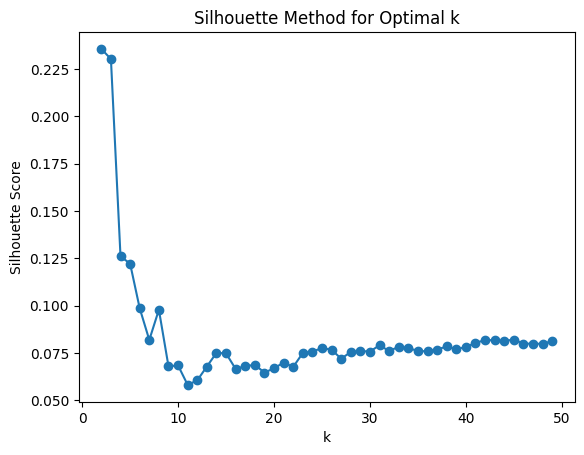

In [255]:
sil_scores = []
for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(X_scaled_df)
    sil_scores.append(silhouette_score(X_scaled_df, labels))

plt.plot(K, sil_scores, 'o-')
plt.xlabel('k')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Method for Optimal k')
plt.show()

Now K-Means for PCA

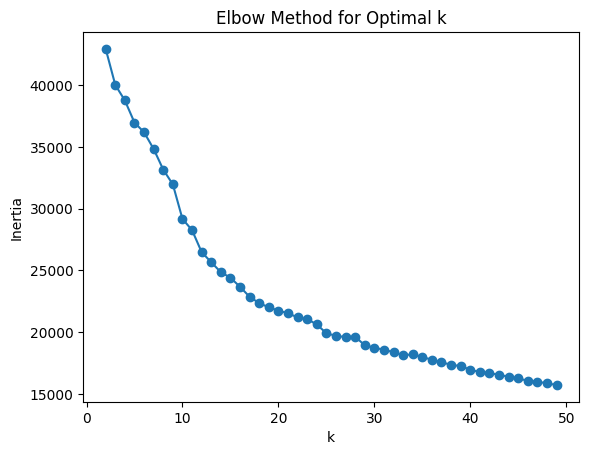

In [256]:
inertias = []
K = range(2, 50)
for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_pca_df)
    inertias.append(kmeans.inertia_)

plt.plot(K, inertias, 'o-')
plt.xlabel('k')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal k')
plt.show()

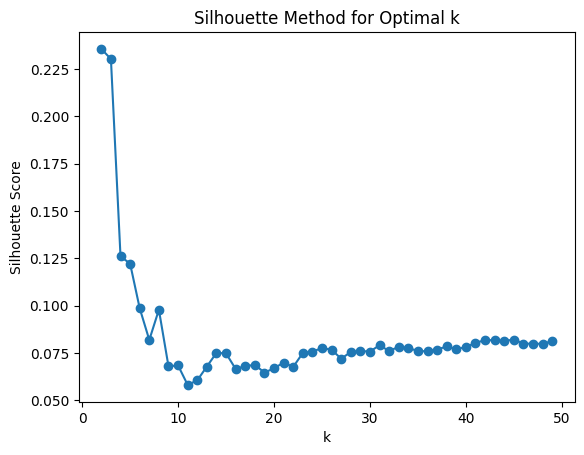

In [257]:
sil_scores = []
for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(X_scaled_df)
    sil_scores.append(silhouette_score(X_scaled_df, labels))

plt.plot(K, sil_scores, 'o-')
plt.xlabel('k')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Method for Optimal k')
plt.show()

In [258]:
clusterer = hdbscan.HDBSCAN(min_cluster_size=5, metric='euclidean')
labels_on_raw = clusterer.fit_predict(X_scaled_df)

/opt/miniconda3/envs/iw/lib/python3.13/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/miniconda3/envs/iw/lib/python3.13/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


In [259]:
# basic counts, including noise as -1
label_counts_raw = pd.Series(labels_on_raw).value_counts().sort_index()
print(label_counts_raw)

# number of non-noise clusters
cluster_ids = np.unique(labels_on_raw[labels_on_raw != -1])
n_clusters = len(cluster_ids)
print(f"Number of clusters (excluding noise): {n_clusters}")

# noise fraction
noise_frac = (labels_on_raw == -1).mean()
print(f"Noise fraction: {noise_frac:.2%}")

-1     231
 0       7
 1    1873
Name: count, dtype: int64
Number of clusters (excluding noise): 2
Noise fraction: 10.94%


HDBSCAN on PCA space

In [260]:
clusterer = hdbscan.HDBSCAN(min_cluster_size=5, metric='euclidean')
labels_on_pca = clusterer.fit_predict(X_pca_df)

/opt/miniconda3/envs/iw/lib/python3.13/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/miniconda3/envs/iw/lib/python3.13/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


In [261]:
labels = labels_on_pca

# basic counts, including noise as -1
label_counts = pd.Series(labels).value_counts().sort_index()
print(label_counts)

# number of non-noise clusters
cluster_ids = np.unique(labels[labels != -1])
n_clusters = len(cluster_ids)
print(f"Number of clusters (excluding noise): {n_clusters}")

# noise fraction
noise_frac = (labels == -1).mean()
print(f"Noise fraction: {noise_frac:.2%}")

-1     163
 0       7
 1    1941
Name: count, dtype: int64
Number of clusters (excluding noise): 2
Noise fraction: 7.72%


Now GMM on raw, standardized space

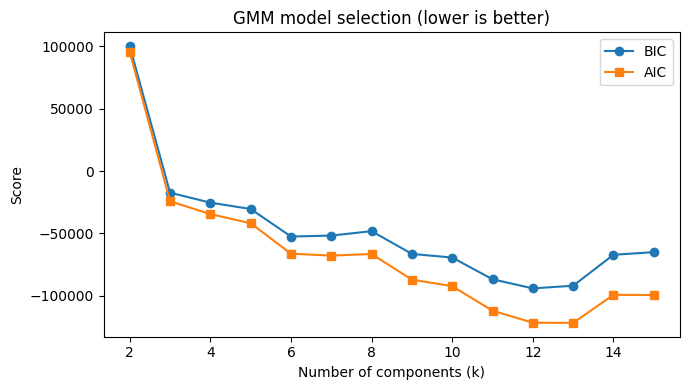

Best k by BIC: 12
Silhouette score (GMM on raw): 0.004759461724762661


In [262]:
n_components_range = range(2, 16)  # try 2–15 clusters
bics = []
aics = []

for k in n_components_range:
    gmm = GaussianMixture(
        n_components=k,
        covariance_type='full',
        random_state=42
    )
    gmm.fit(X_scaled_df)
    bics.append(gmm.bic(X_scaled_df))
    aics.append(gmm.aic(X_scaled_df))

# Plot BIC/AIC vs k
plt.figure(figsize=(7, 4))
plt.plot(n_components_range, bics, marker='o', label='BIC')
plt.plot(n_components_range, aics, marker='s', label='AIC')
plt.xlabel("Number of components (k)")
plt.ylabel("Score")
plt.title("GMM model selection (lower is better)")
plt.legend()
plt.tight_layout()
plt.show()

# Choose best_k by minimum BIC (could also use AIC)
best_k = list(n_components_range)[np.argmin(bics)]
print("Best k by BIC:", best_k)

gmm = GaussianMixture(
    n_components=best_k,
    covariance_type='full',
    n_init=5,        # multiple initializations for stability
    random_state=42
).fit(X_scaled_df)

cluster_labels = gmm.predict(X_scaled_df)        # hard assignments
cluster_probs = gmm.predict_proba(X_scaled_df)   # soft memberships

if len(np.unique(cluster_labels)) > 1:
    sil = silhouette_score(X_scaled_df, cluster_labels)
    print("Silhouette score (GMM on raw):", sil)
else:
    print("Only one cluster found; silhouette undefined.")

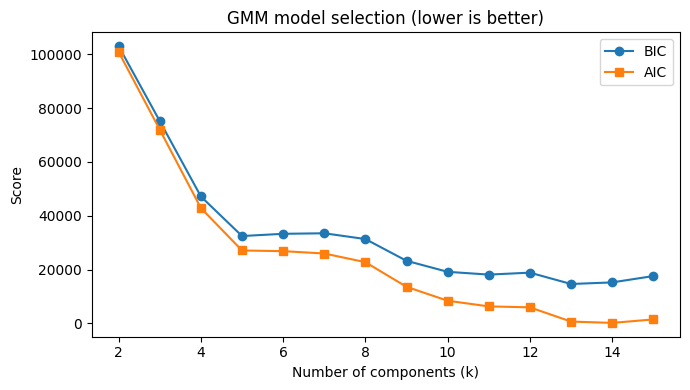

Best k by BIC: 13
Silhouette score (GMM on PCA): -0.0005455059748645932


In [263]:
n_components_range = range(2, 16)  # try 2–15 clusters
bics = []
aics = []

for k in n_components_range:
    gmm = GaussianMixture(
        n_components=k,
        covariance_type='full',
        random_state=42
    )
    gmm.fit(X_pca_df)
    bics.append(gmm.bic(X_pca_df))
    aics.append(gmm.aic(X_pca_df))

# Plot BIC/AIC vs k
plt.figure(figsize=(7, 4))
plt.plot(n_components_range, bics, marker='o', label='BIC')
plt.plot(n_components_range, aics, marker='s', label='AIC')
plt.xlabel("Number of components (k)")
plt.ylabel("Score")
plt.title("GMM model selection (lower is better)")
plt.legend()
plt.tight_layout()
plt.show()

# Choose best_k by minimum BIC (could also use AIC)
best_k = list(n_components_range)[np.argmin(bics)]
print("Best k by BIC:", best_k)

gmm = GaussianMixture(
    n_components=best_k,
    covariance_type='full',
    n_init=5,        # multiple initializations for stability
    random_state=42
).fit(X_pca_df)

cluster_labels = gmm.predict(X_pca_df)        # hard assignments
cluster_probs = gmm.predict_proba(X_pca_df)   # soft memberships

if len(np.unique(cluster_labels)) > 1:
    sil = silhouette_score(X_pca_df, cluster_labels)
    print("Silhouette score (GMM on PCA):", sil)
else:
    print("Only one cluster found; silhouette undefined.")

In [38]:
print(pitcher_season_df.columns)

Index(['pitcher', 'game_year', 'pfx_x_CH', 'pfx_x_CU', 'pfx_x_EP', 'pfx_x_FC',
       'pfx_x_FF', 'pfx_x_FS', 'pfx_x_KN', 'pfx_x_SI', 'pfx_x_SL', 'pfx_z_CH',
       'pfx_z_CU', 'pfx_z_EP', 'pfx_z_FC', 'pfx_z_FF', 'pfx_z_FS', 'pfx_z_KN',
       'pfx_z_SI', 'pfx_z_SL', 'release_speed_CH', 'release_speed_CU',
       'release_speed_EP', 'release_speed_FC', 'release_speed_FF',
       'release_speed_FS', 'release_speed_KN', 'release_speed_SI',
       'release_speed_SL', 'CH_frac', 'CU_frac', 'EP_frac', 'FC_frac',
       'FF_frac', 'FS_frac', 'KN_frac', 'SI_frac', 'SL_frac', 'release_pos_x',
       'release_pos_z', 'release_extension', 'p_throws', 'p_throws_num',
       'role', 'name_first', 'name_last', 'name', 'throws_FF', 'throws_SL',
       'throws_CH', 'throws_CU', 'throws_SI', 'throws_FC', 'throws_FS',
       'throws_KN', 'throws_EP'],
      dtype='object')


Since this clustering was poor, I'll now cluster in subgroups (righty starters, lefty starters, righty relievers, lefty relievers)

In [29]:
# masks for groups

meta_df = pitcher_season_df  # just for shorter code

mask_RS = (meta_df["role"] == "starter")  & (meta_df["p_throws"] == "R")
mask_LS = (meta_df["role"] == "starter")  & (meta_df["p_throws"] == "L")
mask_RR = (meta_df["role"] == "reliever") & (meta_df["p_throws"] == "R")
mask_LR = (meta_df["role"] == "reliever") & (meta_df["p_throws"] == "L")

print("RHP starters:",  mask_RS.sum())
print("LHP starters:",  mask_LS.sum())
print("RHP relievers:", mask_RR.sum())
print("LHP relievers:", mask_LR.sum())


RHP starters: 652
LHP starters: 267
RHP relievers: 913
LHP relievers: 279


In [40]:
def kmeans_cluster_group(
    X_df,
    meta_df,
    mask,
    label_col_name,
    n_clusters=4,
    random_state=42,
):
    """
    Run K-Means on a subset of rows defined by mask.
    - X_df: feature DataFrame (X_pca_df or X_scaled_df)
    - meta_df: pitcher_season_df (labels written here)
    - mask: boolean mask selecting one group (e.g. RHP starters)
    - label_col_name: new column in meta_df to hold labels
    """

    idx_group = meta_df.index[mask]
    X_group = X_df.loc[idx_group]

    if len(X_group) < n_clusters:
        print(f"{label_col_name}: not enough points (n={len(X_group)}) for k={n_clusters}. Skipping.")
        meta_df.loc[idx_group, label_col_name] = -1
        return None

    kmeans = KMeans(
        n_clusters=n_clusters,
        n_init=20,
        random_state=random_state,
    )
    labels = kmeans.fit_predict(X_group.values)

    meta_df.loc[idx_group, label_col_name] = labels

    # Optional: silhouette for this group
    if len(np.unique(labels)) > 1:
        sil = silhouette_score(X_group.values, labels)
        print(f"{label_col_name}: silhouette = {sil:.3f}")
    else:
        print(f"{label_col_name}: only one cluster found.")

    return kmeans


In [41]:
def hdbscan_cluster_group(
    X_df,
    meta_df,
    mask,
    label_col_name,
    min_cluster_size=5,
    metric="euclidean",
):
    """
    Run HDBSCAN on a subset of rows defined by mask.
    - X_df: feature DataFrame (X_pca_df or X_scaled_df)
    - meta_df: pitcher_season_df
    - mask: boolean mask selecting one group
    - label_col_name: new column for labels (HDBSCAN uses -1 for noise)
    """

    idx_group = meta_df.index[mask]
    X_group = X_df.loc[idx_group]

    if len(X_group) < min_cluster_size:
        print(f"{label_col_name}: not enough points (n={len(X_group)}) for min_cluster_size={min_cluster_size}. Skipping.")
        meta_df.loc[idx_group, label_col_name] = -1
        return None

    clusterer = hdbscan.HDBSCAN(
        min_cluster_size=min_cluster_size,
        metric=metric,
    )
    labels = clusterer.fit_predict(X_group.values)

    meta_df.loc[idx_group, label_col_name] = labels
    meta_df.loc[idx_group, label_col_name + "_prob"] = clusterer.probabilities_

    print(
        f"{label_col_name}: "
        f"{(labels != -1).sum()} clustered, "
        f"{(labels == -1).sum()} noise, "
        f"{len(np.unique(labels[labels != -1]))} clusters"
    )

    return clusterer


In [42]:
def gmm_cluster_group(
    X_df,
    meta_df,
    mask,
    label_col_name,
    n_components_range=range(2, 10),
    covariance_type="full",
    random_state=42,
):
    """
    Run GMM clustering on a subset of rows defined by mask.
    - X_df: feature DataFrame (X_pca_df or X_scaled_df)
    - meta_df: pitcher_season_df (will get a new column with labels)
    - mask: boolean mask selecting one group (e.g. RHP starters)
    - label_col_name: where to store cluster labels in meta_df
    """

    idx_group = meta_df.index[mask]
    X_group = X_df.loc[idx_group]

    n_samples = len(X_group)
    if n_samples < 2:
        print(f"Group {label_col_name} too small ({n_samples} rows). Skipping.")
        meta_df.loc[idx_group, label_col_name] = -1
        return None

    # Ensure k < n_samples
    k_range = [k for k in n_components_range if k < n_samples]
    if not k_range:
        print(f"No valid k for group {label_col_name} (n={n_samples}). Skipping.")
        meta_df.loc[idx_group, label_col_name] = -1
        return None

    X = X_group.values

    # Model selection via BIC
    bics = []
    for k in k_range:
        gmm = GaussianMixture(
            n_components=k,
            covariance_type=covariance_type,
            random_state=random_state,
        )
        gmm.fit(X)
        bics.append(gmm.bic(X))

    best_k = k_range[int(np.argmin(bics))]
    print(f"{label_col_name}: best k by BIC = {best_k}")

    gmm = GaussianMixture(
        n_components=best_k,
        covariance_type=covariance_type,
        n_init=5,
        random_state=random_state,
    ).fit(X)

    labels = gmm.predict(X)
    probs = gmm.predict_proba(X)
    conf = probs.max(axis=1)

    # Write back to meta_df
    meta_df.loc[idx_group, label_col_name] = labels
    meta_df.loc[idx_group, label_col_name + "_conf"] = conf

    # Optional: silhouette within this group
    if len(np.unique(labels)) > 1:
        sil = silhouette_score(X, labels)
        print(f"{label_col_name}: silhouette = {sil:.3f}")
    else:
        print(f"{label_col_name}: only one cluster found (k={best_k}).")

    return gmm

raw, standardized space

In [265]:
X_features_raw = X_scaled_df

# K-MEANS (raw space)
kmeans_RS_pca = kmeans_cluster_group(
    X_df=X_features_raw,
    meta_df=pitcher_season_df,
    mask=mask_RS,
    label_col_name="cluster_kmeans_RS_raw",
    n_clusters=4,   # pick a starting k, tweak later
)

kmeans_LS_pca = kmeans_cluster_group(
    X_df=X_features_raw,
    meta_df=pitcher_season_df,
    mask=mask_LS,
    label_col_name="cluster_kmeans_LS_raw",
    n_clusters=4,
)

kmeans_RR_pca = kmeans_cluster_group(
    X_df=X_features_raw,
    meta_df=pitcher_season_df,
    mask=mask_RR,
    label_col_name="cluster_kmeans_RR_raw",
    n_clusters=4,
)

kmeans_LR_pca = kmeans_cluster_group(
    X_df=X_features_raw,
    meta_df=pitcher_season_df,
    mask=mask_LR,
    label_col_name="cluster_kmeans_LR_raw",
    n_clusters=4,
)

# HDBSCAN (raw space)
hdb_RS_pca = hdbscan_cluster_group(
    X_df=X_features_raw,
    meta_df=pitcher_season_df,
    mask=mask_RS,
    label_col_name="cluster_hdbscan_RS_raw",
    min_cluster_size=5,
)

hdb_LS_pca = hdbscan_cluster_group(
    X_df=X_features_raw,
    meta_df=pitcher_season_df,
    mask=mask_LS,
    label_col_name="cluster_hdbscan_LS_raw",
    min_cluster_size=5,
)

hdb_RR_pca = hdbscan_cluster_group(
    X_df=X_features_raw,
    meta_df=pitcher_season_df,
    mask=mask_RR,
    label_col_name="cluster_hdbscan_RR_raw",
    min_cluster_size=5,
)

hdb_LR_pca = hdbscan_cluster_group(
    X_df=X_features_raw,
    meta_df=pitcher_season_df,
    mask=mask_LR,
    label_col_name="cluster_hdbscan_LR_raw",
    min_cluster_size=5,
)


cluster_kmeans_RS_raw: silhouette = 0.142
cluster_kmeans_LS_raw: silhouette = 0.107
cluster_kmeans_RR_raw: silhouette = 0.095
cluster_kmeans_LR_raw: silhouette = 0.190
cluster_hdbscan_RS_raw: 376 clustered, 276 noise, 2 clusters
cluster_hdbscan_LS_raw: 59 clustered, 208 noise, 5 clusters
cluster_hdbscan_RR_raw: 662 clustered, 251 noise, 4 clusters
cluster_hdbscan_LR_raw: 274 clustered, 5 noise, 2 clusters


/opt/miniconda3/envs/iw/lib/python3.13/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/miniconda3/envs/iw/lib/python3.13/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/miniconda3/envs/iw/lib/python3.13/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/miniconda3/envs/iw/lib/python3.13/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/miniconda3/envs/iw/lib/python3.13/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and w

In [266]:
X_features_pca = X_pca_df  # 19 PCs, same index as pitcher_season_df

# K-MEANS (PCA space)
kmeans_RS_pca = kmeans_cluster_group(
    X_df=X_features_pca,
    meta_df=pitcher_season_df,
    mask=mask_RS,
    label_col_name="cluster_kmeans_RS_pca",
    n_clusters=4,   # pick a starting k, tweak later
)

kmeans_LS_pca = kmeans_cluster_group(
    X_df=X_features_pca,
    meta_df=pitcher_season_df,
    mask=mask_LS,
    label_col_name="cluster_kmeans_LS_pca",
    n_clusters=4,
)

kmeans_RR_pca = kmeans_cluster_group(
    X_df=X_features_pca,
    meta_df=pitcher_season_df,
    mask=mask_RR,
    label_col_name="cluster_kmeans_RR_pca",
    n_clusters=4,
)

kmeans_LR_pca = kmeans_cluster_group(
    X_df=X_features_pca,
    meta_df=pitcher_season_df,
    mask=mask_LR,
    label_col_name="cluster_kmeans_LR_pca",
    n_clusters=4,
)

# HDBSCAN (PCA space)
hdb_RS_pca = hdbscan_cluster_group(
    X_df=X_features_pca,
    meta_df=pitcher_season_df,
    mask=mask_RS,
    label_col_name="cluster_hdbscan_RS_pca",
    min_cluster_size=5,
)

hdb_LS_pca = hdbscan_cluster_group(
    X_df=X_features_pca,
    meta_df=pitcher_season_df,
    mask=mask_LS,
    label_col_name="cluster_hdbscan_LS_pca",
    min_cluster_size=5,
)

hdb_RR_pca = hdbscan_cluster_group(
    X_df=X_features_pca,
    meta_df=pitcher_season_df,
    mask=mask_RR,
    label_col_name="cluster_hdbscan_RR_pca",
    min_cluster_size=5,
)

hdb_LR_pca = hdbscan_cluster_group(
    X_df=X_features_pca,
    meta_df=pitcher_season_df,
    mask=mask_LR,
    label_col_name="cluster_hdbscan_LR_pca",
    min_cluster_size=5,
)


# GMM (PCA space)
gmm_RS = gmm_cluster_group(
    X_df=X_features_pca,
    meta_df=pitcher_season_df,
    mask=mask_RS,
    label_col_name="cluster_gmm_RS_pca",
)

gmm_LS = gmm_cluster_group(
    X_df=X_features_pca,
    meta_df=pitcher_season_df,
    mask=mask_LS,
    label_col_name="cluster_gmm_LS_pca",
)

gmm_RR = gmm_cluster_group(
    X_df=X_features_pca,
    meta_df=pitcher_season_df,
    mask=mask_RR,
    label_col_name="cluster_gmm_RR_pca",
)

gmm_LR = gmm_cluster_group(
    X_df=X_features_pca,
    meta_df=pitcher_season_df,
    mask=mask_LR,
    label_col_name="cluster_gmm_LR_pca",
)



cluster_kmeans_RS_pca: silhouette = 0.152
cluster_kmeans_LS_pca: silhouette = 0.143
cluster_kmeans_RR_pca: silhouette = 0.105
cluster_kmeans_LR_pca: silhouette = 0.231
cluster_hdbscan_RS_pca: 416 clustered, 236 noise, 2 clusters
cluster_hdbscan_LS_pca: 185 clustered, 82 noise, 2 clusters
cluster_hdbscan_RR_pca: 709 clustered, 204 noise, 3 clusters
cluster_hdbscan_LR_pca: 274 clustered, 5 noise, 2 clusters


/opt/miniconda3/envs/iw/lib/python3.13/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/miniconda3/envs/iw/lib/python3.13/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/miniconda3/envs/iw/lib/python3.13/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/miniconda3/envs/iw/lib/python3.13/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/miniconda3/envs/iw/lib/python3.13/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and w

cluster_gmm_RS_pca: best k by BIC = 5
cluster_gmm_RS_pca: silhouette = 0.027
cluster_gmm_LS_pca: best k by BIC = 3
cluster_gmm_LS_pca: silhouette = 0.070
cluster_gmm_RR_pca: best k by BIC = 6
cluster_gmm_RR_pca: silhouette = 0.009
cluster_gmm_LR_pca: best k by BIC = 5
cluster_gmm_LR_pca: silhouette = 0.125


Now I will train an autoencoder

In [30]:
def self_season_retrieval_score(
    Z_df,
    meta_df,
    k=5,                      # you’re using 5 now
    max_year_diff=3,
    name_col="pitcher_name",
    year_col="year",
):
    """
    For each *eligible* pitcher-season (one that has at least one other
    season of the same pitcher within max_year_diff years), look at its
    top-k neighbors (excluding itself) and see if any neighbor is another
    season of the same pitcher (respecting max_year_diff).

    Returns:
        hit_rate:  hits / num_eligible
        mrr:       mean reciprocal rank over eligible rows
        num_eligible: number of pitcher-seasons that could possibly have a hit
    """
    Z = Z_df.values
    # L2 normalize for cosine similarity
    Z_norm = Z / np.linalg.norm(Z, axis=1, keepdims=True)
    sims = Z_norm @ Z_norm.T  # n x n cosine similarity matrix

    names = meta_df[name_col].values
    years = meta_df[year_col].values

    n = Z.shape[0]

    # ---- 1. Compute which rows are eligible ----
    eligible = np.zeros(n, dtype=bool)
    for i in range(n):
        same_name = (names == names[i])
        same_name[i] = False  # exclude self
        if max_year_diff is not None:
            same_name = same_name & (np.abs(years - years[i]) <= max_year_diff)
        if same_name.any():
            eligible[i] = True

    eligible_idx = np.where(eligible)[0]
    num_eligible = len(eligible_idx)

    if num_eligible == 0:
        # No one has multiple seasons; metric isn't defined
        return float("nan"), float("nan"), 0

    # ---- 2. Compute hit@k and MRR over *eligible* only ----
    hits = 0
    rr_sum = 0.0

    for i in eligible_idx:
        sim_row = sims[i].copy()
        sim_row[i] = -np.inf  # exclude self
        nn_idx = np.argsort(-sim_row)[:k]  # top-k neighbors

        found_rank = None
        for rank, j in enumerate(nn_idx, start=1):
            if names[j] != names[i]:
                continue
            if max_year_diff is not None:
                if abs(years[j] - years[i]) > max_year_diff:
                    continue
            found_rank = rank
            break

        if found_rank is not None:
            hits += 1
            rr_sum += 1.0 / found_rank

    hit_rate = hits / num_eligible
    mrr = rr_sum / num_eligible

    return hit_rate, mrr, num_eligible


In [31]:
# 1. Convert to tensor
X_np = X_scaled_df.values.astype("float32")
X_train, X_val = train_test_split(X_np, test_size=0.1, random_state=42)

X_train_t = torch.tensor(X_train, dtype=torch.float32)
X_val_t   = torch.tensor(X_val,   dtype=torch.float32)

train_ds = TensorDataset(X_train_t)
val_ds   = TensorDataset(X_val_t)

train_loader = DataLoader(train_ds, batch_size=64, shuffle=True)
val_loader   = DataLoader(val_ds,   batch_size=64, shuffle=False)

input_dim = X_scaled_df.shape[1]

In [32]:
class Autoencoder(nn.Module):
    def __init__(self, input_dim, latent_dim=15, hidden_dims=(128, 64), dropout=0.1):
        super().__init__()
        h1, h2 = hidden_dims
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, h1),
            nn.BatchNorm1d(h1),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(h1, h2),
            nn.BatchNorm1d(h2),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(h2, latent_dim),
        )
        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, h2),
            nn.BatchNorm1d(h2),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(h2, h1),
            nn.BatchNorm1d(h1),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(h1, input_dim),
        )

    def encode(self, x):
        z = self.encoder(x)
        z_norm = F.normalize(z, dim=-1)
        return z_norm

    def forward(self, x):
        z = self.encoder(x)
        z_norm = F.normalize(z, dim=-1)
        x_hat = self.decoder(z)     # decode from unnormalized z
        return x_hat, z_norm


In [33]:
model = Autoencoder(input_dim, latent_dim=15, hidden_dims=(128, 64), dropout=0.1)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3, weight_decay=1e-5)

In [34]:
# training for hyperparameter tuning
def train_autoencoder_once(
    input_dim,
    train_ds,
    val_ds,
    latent_dim=15,
    hidden_dims=(128, 64),
    dropout=0.1,
    lr=1e-3,
    weight_decay=1e-5,
    batch_size=64,
    n_epochs=50,
    patience=8,
    device=device,
):
    train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=True)
    val_loader   = DataLoader(val_ds,   batch_size=batch_size, shuffle=False)

    model = Autoencoder(
        input_dim=input_dim,
        latent_dim=latent_dim,
        hidden_dims=hidden_dims,
        dropout=dropout,
    ).to(device)

    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(
        model.parameters(),
        lr=lr,
        weight_decay=weight_decay,
    )

    best_val_loss = math.inf
    best_state = None
    no_improve_epochs = 0

    for epoch in range(1, n_epochs + 1):
        # ---- Train ----
        model.train()
        train_loss = 0.0
        for (batch,) in train_loader:
            batch = batch.to(device)
            optimizer.zero_grad()
            recon, _ = model(batch)
            loss = criterion(recon, batch)
            loss.backward()
            optimizer.step()
            train_loss += loss.item() * batch.size(0)

        train_loss /= len(train_ds)

        # ---- Validation ----
        model.eval()
        val_loss = 0.0
        with torch.no_grad():
            for (batch,) in val_loader:
                batch = batch.to(device)
                recon, _ = model(batch)
                loss = criterion(recon, batch)
                val_loss += loss.item() * batch.size(0)
        val_loss /= len(val_ds)

        # early stopping bookkeeping
        if val_loss < best_val_loss - 1e-5:
            best_val_loss = val_loss
            best_state = copy.deepcopy(model.state_dict())
            no_improve_epochs = 0
        else:
            no_improve_epochs += 1

        # optional: print a little progress
        print(
            f"[latent={latent_dim}, hidden={hidden_dims}, drop={dropout:.2f}] "
            f"Epoch {epoch:02d} | train={train_loss:.6f} | val={val_loss:.6f}"
        )

        if no_improve_epochs >= patience:
            print("  Early stopping.")
            break

    if best_state is not None:
        model.load_state_dict(best_state)

    return best_val_loss, model


In [35]:
latent_dims   = [8, 10, 12, 15, 20]
hidden_options = [(128, 64), (256, 128)]
dropouts      = [0.0, 0.1]
weight_decays = [1e-5, 1e-4]

results = []

for ld, hd, d, wd in product(latent_dims, hidden_options, dropouts, weight_decays):
    print("=" * 80)
    print(f"Config: latent_dim={ld}, hidden_dims={hd}, dropout={d}, weight_decay={wd}")
    
    # 1) Train AE for this config
    val_loss, model = train_autoencoder_once(
        input_dim=input_dim,
        train_ds=train_ds,
        val_ds=val_ds,
        latent_dim=ld,
        hidden_dims=hd,
        dropout=d,
        weight_decay=wd,
        lr=1e-3,         # you can also grid over this if you want
        n_epochs=50,
        batch_size=64,
        patience=8,
        device=device,
    )

    # 2) Get latent embeddings for *all* pitcher-seasons
    model.eval()
    with torch.no_grad():
        X_all_t = torch.tensor(
            X_scaled_df.values.astype("float32"),
            device=device,
        )
        # use encode() to get normalized embeddings
        Z = model.encode(X_all_t)
        Z_np = Z.cpu().numpy()

    X_ae_df = pd.DataFrame(
        Z_np,
        index=X_scaled_df.index,
        columns=[f"AE{i+1}" for i in range(ld)],
    )

    # 3) Compute self-season retrieval scores
    hit5, mrr5, n_elig = self_season_retrieval_score(
        X_ae_df,
        pitcher_season_df,
        k=5,
        max_year_diff=3,
        name_col="name",
        year_col="game_year",
    )

    print(
    f"  val_loss={val_loss:.6f} | self_hit@5={hit5:.3f} | "
    f"self_MRR={mrr5:.3f} | eligible={n_elig}"
    )

    results.append({
        "latent_dim": ld,
        "hidden_dims": hd,
        "dropout": d,
        "weight_decay": wd,
        "val_loss": val_loss,
        "self_hit@5": hit5,
        "self_MRR": mrr5,
        "num_eligible": n_elig,
    })

results_df = pd.DataFrame(results)


Config: latent_dim=8, hidden_dims=(128, 64), dropout=0.0, weight_decay=1e-05
[latent=8, hidden=(128, 64), drop=0.00] Epoch 01 | train=0.843650 | val=0.613137
[latent=8, hidden=(128, 64), drop=0.00] Epoch 02 | train=0.579847 | val=0.443457
[latent=8, hidden=(128, 64), drop=0.00] Epoch 03 | train=0.496331 | val=0.377551
[latent=8, hidden=(128, 64), drop=0.00] Epoch 04 | train=0.446280 | val=0.339778
[latent=8, hidden=(128, 64), drop=0.00] Epoch 05 | train=0.412896 | val=0.317404
[latent=8, hidden=(128, 64), drop=0.00] Epoch 06 | train=0.388288 | val=0.303576
[latent=8, hidden=(128, 64), drop=0.00] Epoch 07 | train=0.369646 | val=0.293938
[latent=8, hidden=(128, 64), drop=0.00] Epoch 08 | train=0.349183 | val=0.282864
[latent=8, hidden=(128, 64), drop=0.00] Epoch 09 | train=0.340618 | val=0.283574
[latent=8, hidden=(128, 64), drop=0.00] Epoch 10 | train=0.337488 | val=0.276685
[latent=8, hidden=(128, 64), drop=0.00] Epoch 11 | train=0.319322 | val=0.270571
[latent=8, hidden=(128, 64), dro

In [36]:
# example: sort by val_loss ascending, then MRR descending
display(
    results_df.sort_values(
        by=["val_loss", "self_MRR"],
        ascending=[True, False],
    )
)

,latent_dim,hidden_dims,dropout,weight_decay,val_loss,self_hit@5,self_MRR,num_eligible
36,20,"(256, 128)",0.0,0.00001,0.053647,0.823188,0.744560,1725
37,20,"(256, 128)",0.0,0.00010,0.059049,0.823188,0.736647,1725
33,20,"(128, 64)",0.0,0.00010,0.078129,0.817391,0.726899,1725
32,20,"(128, 64)",0.0,0.00001,0.078263,0.798841,0.709343,1725
39,20,"(256, 128)",0.1,0.00010,0.079999,0.819710,0.729072,1725
29,15,"(256, 128)",0.0,0.00010,0.080998,0.801739,0.708329,1725
28,15,"(256, 128)",0.0,0.00001,0.082397,0.795362,0.707343,1725
38,20,"(256, 128)",0.1,0.00001,0.084537,0.817971,0.736087,1725
25,15,"(128, 64)",0.0,0.00010,0.094969,0.776232,0.685507,1725
30,15,"(256, 128)",0.1,0.00001,0.096657,0.800000,0.713942,1725


In [37]:
best_row = results_df.sort_values(
        by=["val_loss", "self_MRR"],
        ascending=[True, False],
    ).iloc[0]
ld = best_row['latent_dim']
hd = best_row['hidden_dims']
d = best_row['dropout']
wd = best_row['weight_decay']

val_loss, model = train_autoencoder_once(
        input_dim=input_dim,
        train_ds=train_ds,
        val_ds=val_ds,
        latent_dim=ld,
        hidden_dims=hd,
        dropout=d,
        weight_decay=wd,
        lr=1e-3,         # you can also grid over this if you want
        n_epochs=50,
        batch_size=64,
        patience=8,
        device=device,
)


[latent=20, hidden=(256, 128), drop=0.00] Epoch 01 | train=0.640100 | val=0.385382
[latent=20, hidden=(256, 128), drop=0.00] Epoch 02 | train=0.384814 | val=0.234967
[latent=20, hidden=(256, 128), drop=0.00] Epoch 03 | train=0.302053 | val=0.174709
[latent=20, hidden=(256, 128), drop=0.00] Epoch 04 | train=0.256793 | val=0.161358
[latent=20, hidden=(256, 128), drop=0.00] Epoch 05 | train=0.222300 | val=0.156962
[latent=20, hidden=(256, 128), drop=0.00] Epoch 06 | train=0.201789 | val=0.128381
[latent=20, hidden=(256, 128), drop=0.00] Epoch 07 | train=0.172917 | val=0.114207
[latent=20, hidden=(256, 128), drop=0.00] Epoch 08 | train=0.154957 | val=0.119220
[latent=20, hidden=(256, 128), drop=0.00] Epoch 09 | train=0.141681 | val=0.099006
[latent=20, hidden=(256, 128), drop=0.00] Epoch 10 | train=0.131963 | val=0.097623
[latent=20, hidden=(256, 128), drop=0.00] Epoch 11 | train=0.128335 | val=0.103381
[latent=20, hidden=(256, 128), drop=0.00] Epoch 12 | train=0.117771 | val=0.098446
[lat

In [38]:
model.eval()
with torch.no_grad():
    X_all_t = torch.tensor(
        X_scaled_df.values.astype("float32"),
        device=device
    )
    _, Z = model(X_all_t)
    Z_np = Z.cpu().numpy()

latent_dim = Z_np.shape[1]
X_ae_df = pd.DataFrame(
    Z_np,
    index=X_scaled_df.index,
    columns=[f"AE{i+1}" for i in range(latent_dim)],
)


/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


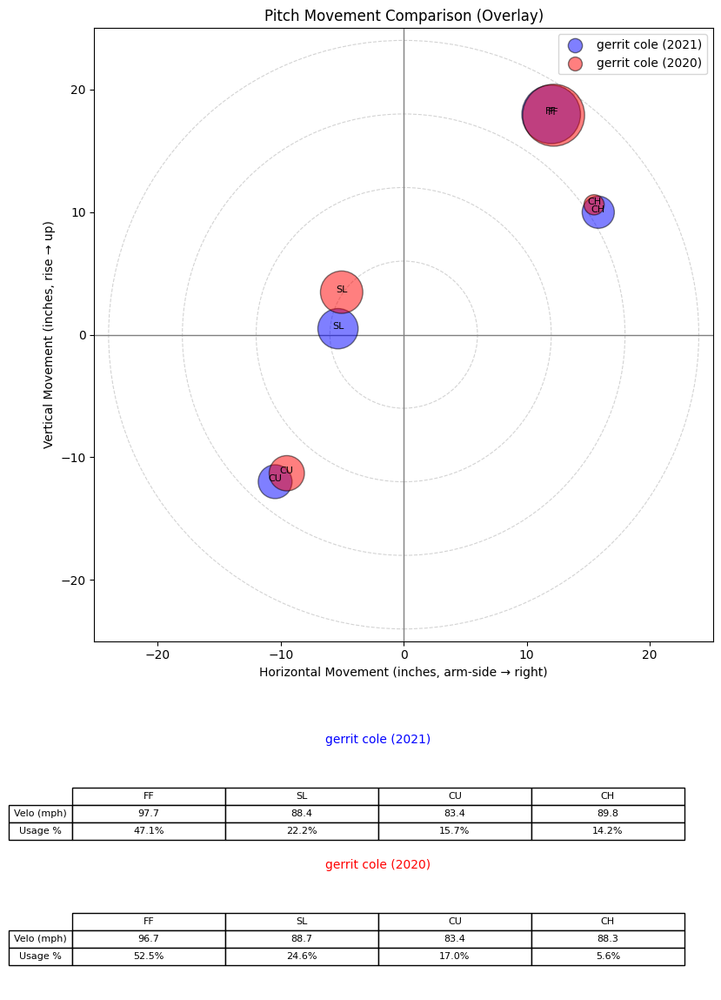

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


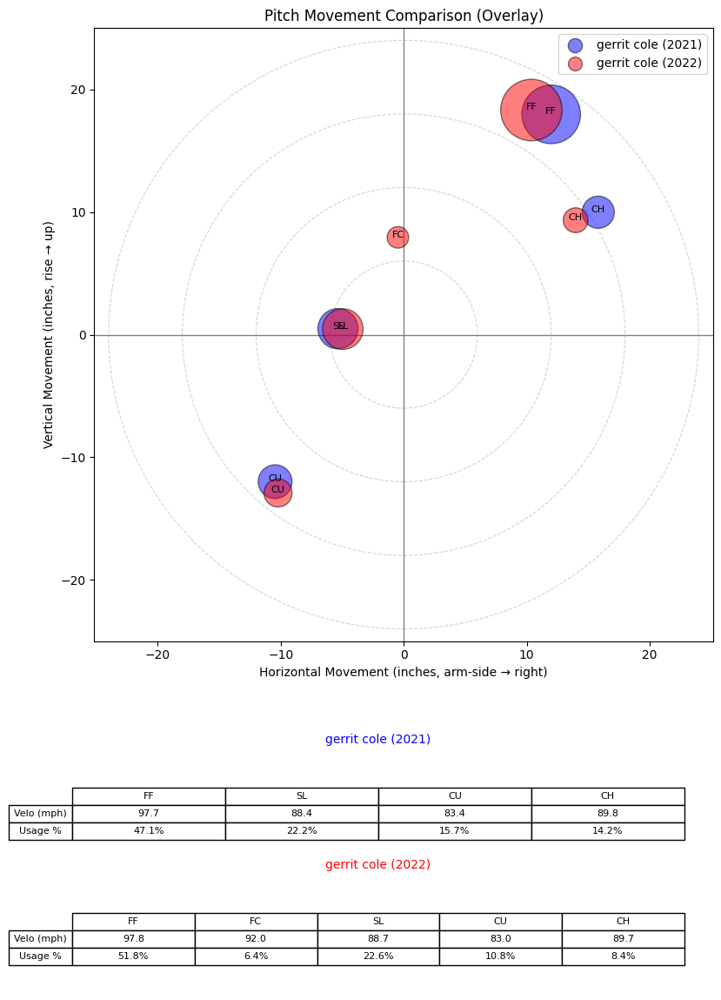

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


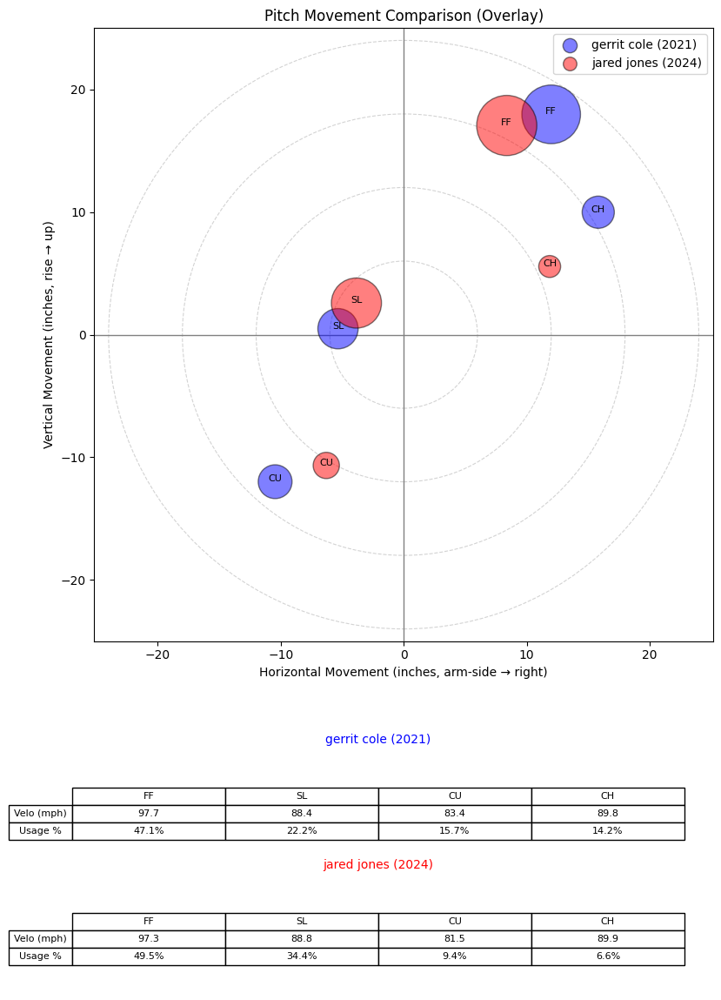

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


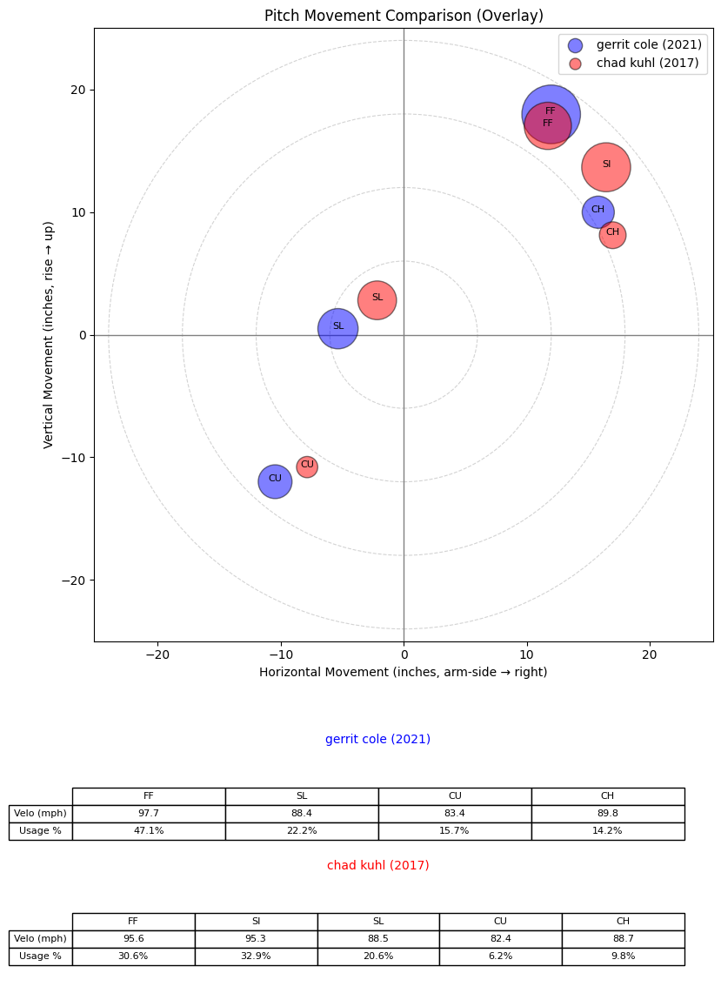

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


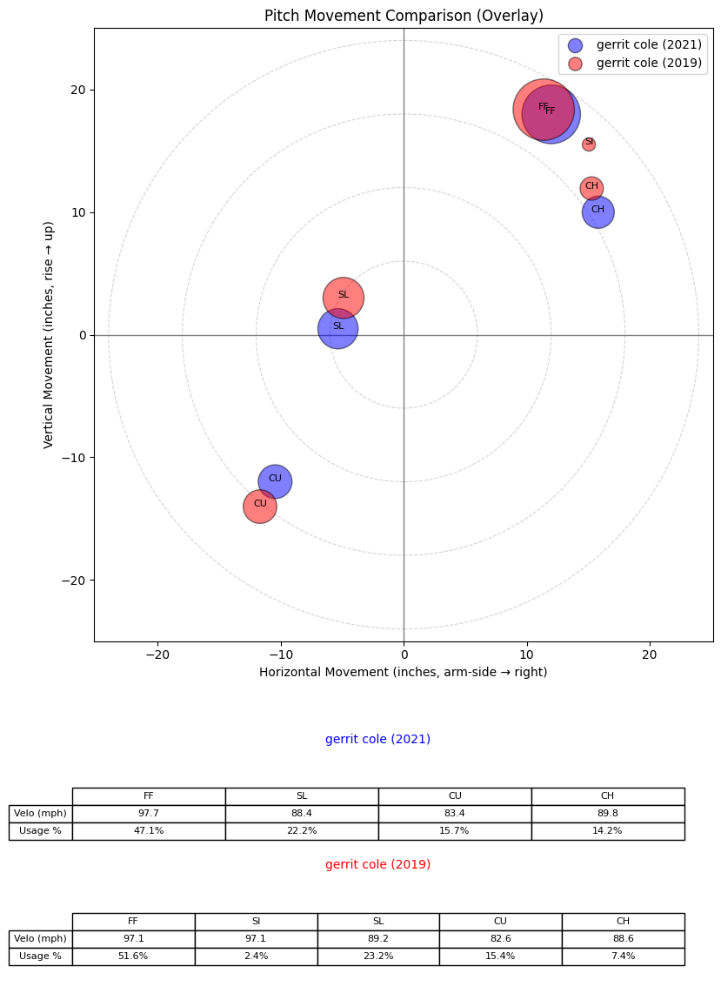

,pitcher,game_year,name,name_first,name_last,p_throws,role,cosine_similarity
535,543037.0,2020,gerrit cole,gerrit,cole,R,starter,0.950228
537,543037.0,2022,gerrit cole,gerrit,cole,R,starter,0.910070
2083,683003.0,2024,jared jones,jared,jones,R,starter,0.858607
1515,641771.0,2017,chad kuhl,chad,kuhl,R,starter,0.811483
534,543037.0,2019,gerrit cole,gerrit,cole,R,starter,0.807543


In [283]:
neighbors_same_ae = find_similar_pitchers_by_name_same_hand_role(
    pitcher_name="gerrit cole",
    year=2021,
    X_df=X_ae_df,               # <- autoencoder space
    meta_df=pitcher_season_df,
    n_neighbors=5,
    overlay_df=movement_long,
    plot_overlays=True,
    overlay_kwargs={"lim_inches": 25, "size_scale": 5000},
)
display(neighbors_same_ae)

In [ ]:
neighbors_same_ae = find_similar_pitchers_by_name_same_hand_role(
    pitcher_name="jacob degrom",
    year=2018,
    X_df=X_ae_df,               # <- autoencoder space
    meta_df=pitcher_season_df,
    n_neighbors=5,
    overlay_df=movement_long,
    plot_overlays=True,
    overlay_kwargs={"lim_inches": 25, "size_scale": 5000},
)
display(neighbors_same_ae)

In [ ]:
neighbors_same_ae = find_similar_pitchers_by_name_same_hand_role(
    pitcher_name="tyler glasnow",
    year=2024,
    X_df=X_ae_df,               # <- autoencoder space
    meta_df=pitcher_season_df,
    n_neighbors=5,
    overlay_df=movement_long,
    plot_overlays=True,
    overlay_kwargs={"lim_inches": 25, "size_scale": 5000},
)
display(neighbors_same_ae)

In [ ]:
neighbors_same_ae = find_similar_pitchers_by_name_same_hand_role(
    pitcher_name="marcus stroman",
    year=2017,
    X_df=X_ae_df,               # <- autoencoder space
    meta_df=pitcher_season_df,
    n_neighbors=5,
    overlay_df=movement_long,
    plot_overlays=True,
    overlay_kwargs={"lim_inches": 25, "size_scale": 5000},
)
display(neighbors_same_ae)

In [ ]:
neighbors_same_ae = find_similar_pitchers_by_name_same_hand_role(
    pitcher_name="luis castillo",
    year=2019,
    X_df=X_ae_df,               # <- autoencoder space
    meta_df=pitcher_season_df,
    n_neighbors=10,
    overlay_df=movement_long,
    plot_overlays=True,
    overlay_kwargs={"lim_inches": 25, "size_scale": 5000},
)
display(neighbors_same_ae)

In [ ]:
neighbors_same_ae = find_similar_pitchers_by_name_same_hand_role(
    pitcher_name="kyle hendricks",
    year=2018,
    X_df=X_ae_df,               # <- autoencoder space
    meta_df=pitcher_season_df,
    n_neighbors=10,
    overlay_df=movement_long,
    plot_overlays=True,
    overlay_kwargs={"lim_inches": 25, "size_scale": 5000},
)
display(neighbors_same_ae)

In [ ]:
neighbors_same_ae = find_similar_pitchers_by_name_same_hand_role(
    pitcher_name="zack greinke",
    year=2017,
    X_df=X_ae_df,               # <- autoencoder space
    meta_df=pitcher_season_df,
    n_neighbors=10,
    overlay_df=movement_long,
    plot_overlays=True,
    overlay_kwargs={"lim_inches": 25, "size_scale": 5000},
)
display(neighbors_same_ae)

In [ ]:
neighbors_same_ae = find_similar_pitchers_by_name_same_hand_role(
    pitcher_name="blake snell",
    year=2018,
    X_df=X_ae_df,               # <- autoencoder space
    meta_df=pitcher_season_df,
    n_neighbors=10,
    overlay_df=movement_long,
    plot_overlays=True,
    overlay_kwargs={"lim_inches": 25, "size_scale": 5000},
)
display(neighbors_same_ae)

In [ ]:
neighbors_same_ae = find_similar_pitchers_by_name_same_hand_role(
    pitcher_name="robbie ray",
    year=2021,
    X_df=X_ae_df,               # <- autoencoder space
    meta_df=pitcher_season_df,
    n_neighbors=10,
    overlay_df=movement_long,
    plot_overlays=True,
    overlay_kwargs={"lim_inches": 25, "size_scale": 5000},
)
display(neighbors_same_ae)

In [ ]:
neighbors_same_ae = find_similar_pitchers_by_name_same_hand_role(
    pitcher_name="carlos rodón",
    year=2021,
    X_df=X_ae_df,               # <- autoencoder space
    meta_df=pitcher_season_df,
    n_neighbors=5,
    overlay_df=movement_long,
    plot_overlays=True,
    overlay_kwargs={"lim_inches": 25, "size_scale": 5000},
)
display(neighbors_same_ae)

In [ ]:
neighbors_same_ae = find_similar_pitchers_by_name_same_hand_role(
    pitcher_name="framber valdez",
    year=2021,
    X_df=X_ae_df,               # <- autoencoder space
    meta_df=pitcher_season_df,
    n_neighbors=5,
    overlay_df=movement_long,
    plot_overlays=True,
    overlay_kwargs={"lim_inches": 25, "size_scale": 5000},
)
display(neighbors_same_ae)

In [ ]:
neighbors_same_ae = find_similar_pitchers_by_name_same_hand_role(
    pitcher_name="dallas keuchel",
    year=2017,
    X_df=X_ae_df,               # <- autoencoder space
    meta_df=pitcher_season_df,
    n_neighbors=10,
    overlay_df=movement_long,
    plot_overlays=True,
    overlay_kwargs={"lim_inches": 25, "size_scale": 5000},
)
display(neighbors_same_ae)

In [ ]:
neighbors_same_ae = find_similar_pitchers_by_name_same_hand_role(
    pitcher_name="hyun jin ryu",
    year=2019,
    X_df=X_ae_df,               # <- autoencoder space
    meta_df=pitcher_season_df,
    n_neighbors=5,
    overlay_df=movement_long,
    plot_overlays=True,
    overlay_kwargs={"lim_inches": 25, "size_scale": 5000},
)
display(neighbors_same_ae)

In [ ]:
neighbors_same_ae = find_similar_pitchers_by_name_same_hand_role(
    pitcher_name="kyle freeland",
    year=2018,
    X_df=X_ae_df,               # <- autoencoder space
    meta_df=pitcher_season_df,
    n_neighbors=10,
    overlay_df=movement_long,
    plot_overlays=True,
    overlay_kwargs={"lim_inches": 25, "size_scale": 5000},
)
display(neighbors_same_ae)

In [ ]:
neighbors_same_ae = find_similar_pitchers_by_name_same_hand_role(
    pitcher_name="edwin díaz",
    year=2018,
    X_df=X_ae_df,               # <- autoencoder space
    meta_df=pitcher_season_df,
    n_neighbors=10,
    overlay_df=movement_long,
    plot_overlays=True,
    overlay_kwargs={"lim_inches": 25, "size_scale": 5000},
)
display(neighbors_same_ae)

In [ ]:
neighbors_same_ae = find_similar_pitchers_by_name_same_hand_role(
    pitcher_name="emmanuel clase",
    year=2022,
    X_df=X_ae_df,               # <- autoencoder space
    meta_df=pitcher_season_df,
    n_neighbors=10,
    overlay_df=movement_long,
    plot_overlays=True,
    overlay_kwargs={"lim_inches": 25, "size_scale": 5000},
)
display(neighbors_same_ae)

In [ ]:
neighbors_same_ae = find_similar_pitchers_by_name_same_hand_role(
    pitcher_name="devin williams",
    year=2020,
    X_df=X_ae_df,               # <- autoencoder space
    meta_df=pitcher_season_df,
    n_neighbors=10,
    overlay_df=movement_long,
    plot_overlays=True,
    overlay_kwargs={"lim_inches": 25, "size_scale": 5000},
)
display(neighbors_same_ae)

In [ ]:
neighbors_same_ae = find_similar_pitchers_by_name_same_hand_role(
    pitcher_name="collin mchugh",
    year=2019,
    X_df=X_ae_df,               # <- autoencoder space
    meta_df=pitcher_season_df,
    n_neighbors=5,
    overlay_df=movement_long,
    plot_overlays=True,
    overlay_kwargs={"lim_inches": 25, "size_scale": 5000},
)
display(neighbors_same_ae)

In [ ]:
neighbors_same_ae = find_similar_pitchers_by_name_same_hand_role(
    pitcher_name="josh hader",
    year=2018,
    X_df=X_ae_df,               # <- autoencoder space
    meta_df=pitcher_season_df,
    n_neighbors=10,
    overlay_df=movement_long,
    plot_overlays=True,
    overlay_kwargs={"lim_inches": 25, "size_scale": 5000},
)
display(neighbors_same_ae)

In [ ]:
neighbors_same_ae = find_similar_pitchers_by_name_same_hand_role(
    pitcher_name="aroldis chapman",
    year=2019,
    X_df=X_ae_df,               # <- autoencoder space
    meta_df=pitcher_season_df,
    n_neighbors=10,
    overlay_df=movement_long,
    plot_overlays=True,
    overlay_kwargs={"lim_inches": 25, "size_scale": 5000},
)
display(neighbors_same_ae)

In [ ]:
neighbors_same_ae = find_similar_pitchers_by_name_same_hand_role(
    pitcher_name="brent suter",
    year=2021,
    X_df=X_ae_df,               # <- autoencoder space
    meta_df=pitcher_season_df,
    n_neighbors=10,
    overlay_df=movement_long,
    plot_overlays=True,
    overlay_kwargs={"lim_inches": 25, "size_scale": 5000},
)
display(neighbors_same_ae)

In [ ]:
neighbors_same_ae = find_similar_pitchers_by_name_same_hand_role(
    pitcher_name="ryan yarbrough",
    year=2018,
    X_df=X_ae_df,               # <- autoencoder space
    meta_df=pitcher_season_df,
    n_neighbors=5,
    overlay_df=movement_long,
    plot_overlays=True,
    overlay_kwargs={"lim_inches": 25, "size_scale": 5000},
)
display(neighbors_same_ae)

In [ ]:
neighbors_same_ae = find_similar_pitchers_by_name_same_hand_role(
    pitcher_name="andrew miller",
    year=2017,
    X_df=X_ae_df,               # <- autoencoder space
    meta_df=pitcher_season_df,
    n_neighbors=5,
    overlay_df=movement_long,
    plot_overlays=True,
    overlay_kwargs={"lim_inches": 25, "size_scale": 5000},
)
display(neighbors_same_ae)

In [ ]:
neighbors_same_ae = find_similar_pitchers_by_name_same_hand_role(
    pitcher_name="will smith",
    year=2019,
    X_df=X_ae_df,               # <- autoencoder space
    meta_df=pitcher_season_df,
    n_neighbors=5,
    overlay_df=movement_long,
    plot_overlays=True,
    overlay_kwargs={"lim_inches": 25, "size_scale": 5000},
)
display(neighbors_same_ae)

In [284]:
torch.save(model.state_dict(), "autoencoder_pitchers_2017_2024.pt")

Evaluating all comparison methods using 2025 season below. Start by processing 2025 season

In [58]:
from datetime import datetime
import pandas as pd
from pybaseball import statcast, cache
from pandas.errors import ParserError
import pickle
import warnings

# Optional: silence that FutureWarning spam from pybaseball postprocessing
warnings.filterwarnings(
    "ignore",
    category=FutureWarning,
    module="pybaseball.datahelpers.postprocessing",
)

cache.enable()

year = 2025
start_date = "2025-03-18"
end_date   = "2025-09-28"

dates = pd.date_range(start_date, end_date, freq="D")

all_frames = []
bad_days = []

for d in dates:
    ds = d.strftime("%Y-%m-%d")
    try:
        print(f"Fetching {ds}...")
        df = statcast(start_dt=ds, end_dt=ds)

        # pybaseball usually returns an empty DataFrame when no games are played
        if df is not None and len(df) > 0:
            all_frames.append(df)
            print(f"  -> {len(df)} rows")
        else:
            print("  -> no rows (no games / no data)")

    except ParserError as e:
        print(f"  !! ParserError on {ds}: {e}")
        bad_days.append((ds, str(e)))
    except Exception as e:
        print(f"  !! Other error on {ds}: {e}")
        bad_days.append((ds, str(e)))

# Combine all successful days
if all_frames:
    data_2025 = pd.concat(all_frames, ignore_index=True)
else:
    data_2025 = pd.DataFrame()

filename = f"statcast_{year}.pkl"
with open(filename, "wb") as f:
    pickle.dump(data_2025, f)

print(f"\nSaved {year} to {filename} with {len(data_2025)} rows.")
print(f"Number of bad days: {len(bad_days)}")
if bad_days:
    print("Bad days:")
    for ds, msg in bad_days:
        print(f"  {ds}: {msg}")

Fetching 2025-03-18...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00,  6.71it/s]
0.00s - Debugger warning: It seems that frozen modules are being used, which may
0.00s - make the debugger miss breakpoints. Please pass -Xfrozen_modules=off
0.00s - to python to disable frozen modules.
0.00s - Note: Debugging will proceed. Set PYDEVD_DISABLE_FILE_VALIDATION=1 to disable this validation.


  -> 3496 rows
Fetching 2025-03-19...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 49.46it/s]

  -> 3738 rows
Fetching 2025-03-20...
This is a large query, it may take a moment to complete



100%|██████████| 1/1 [00:00<00:00, 47.08it/s]

  -> 3336 rows
Fetching 2025-03-21...
This is a large query, it may take a moment to complete



100%|██████████| 1/1 [00:00<00:00, 46.69it/s]

  -> 5289 rows
Fetching 2025-03-22...
This is a large query, it may take a moment to complete



100%|██████████| 1/1 [00:00<00:00, 46.37it/s]


  -> 4722 rows
Fetching 2025-03-23...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 43.43it/s]


  -> 4535 rows
Fetching 2025-03-24...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 51.38it/s]


  -> 3245 rows
Fetching 2025-03-25...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 54.42it/s]


  -> 1822 rows
Fetching 2025-03-26...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00,  7.06it/s]

  -> no rows (no games / no data)
Fetching 2025-03-27...
This is a large query, it may take a moment to complete



100%|██████████| 1/1 [00:00<00:00, 45.27it/s]


  -> 4343 rows
Fetching 2025-03-28...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 54.98it/s]

  -> 2514 rows
Fetching 2025-03-29...
This is a large query, it may take a moment to complete



100%|██████████| 1/1 [00:00<00:00, 51.14it/s]

  -> 4402 rows
Fetching 2025-03-30...
This is a large query, it may take a moment to complete



100%|██████████| 1/1 [00:00<00:00, 52.26it/s]


  -> 3597 rows
Fetching 2025-03-31...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 50.58it/s]


  -> 4299 rows
Fetching 2025-04-01...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 45.44it/s]


  -> 3704 rows
Fetching 2025-04-02...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 48.91it/s]


  -> 4295 rows
Fetching 2025-04-03...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 57.51it/s]


  -> 1451 rows
Fetching 2025-04-04...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 50.23it/s]


  -> 4385 rows
Fetching 2025-04-05...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 52.22it/s]


  -> 4012 rows
Fetching 2025-04-06...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 48.86it/s]


  -> 4667 rows
Fetching 2025-04-07...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 45.10it/s]


  -> 2963 rows
Fetching 2025-04-08...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 52.43it/s]


  -> 4354 rows
Fetching 2025-04-09...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 50.47it/s]


  -> 4553 rows
Fetching 2025-04-10...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 56.50it/s]


  -> 1759 rows
Fetching 2025-04-11...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 52.18it/s]


  -> 4059 rows
Fetching 2025-04-12...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 51.06it/s]


  -> 4317 rows
Fetching 2025-04-13...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 52.57it/s]


  -> 4208 rows
Fetching 2025-04-14...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 52.61it/s]


  -> 2994 rows
Fetching 2025-04-15...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 50.75it/s]


  -> 4440 rows
Fetching 2025-04-16...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 49.69it/s]


  -> 4284 rows
Fetching 2025-04-17...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 50.81it/s]


  -> 2922 rows
Fetching 2025-04-18...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 50.51it/s]


  -> 4090 rows
Fetching 2025-04-19...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 37.22it/s]


  -> 4544 rows
Fetching 2025-04-20...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 50.10it/s]


  -> 4857 rows
Fetching 2025-04-21...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 50.54it/s]


  -> 2211 rows
Fetching 2025-04-22...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 48.75it/s]


  -> 4464 rows
Fetching 2025-04-23...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 51.95it/s]


  -> 4196 rows
Fetching 2025-04-24...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 53.44it/s]


  -> 2620 rows
Fetching 2025-04-25...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 51.13it/s]


  -> 3787 rows
Fetching 2025-04-26...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 46.92it/s]


  -> 4822 rows
Fetching 2025-04-27...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 45.12it/s]


  -> 4690 rows
Fetching 2025-04-28...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 50.84it/s]


  -> 2411 rows
Fetching 2025-04-29...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 43.77it/s]


  -> 4127 rows
Fetching 2025-04-30...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 47.20it/s]


  -> 4581 rows
Fetching 2025-05-01...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 52.31it/s]


  -> 3094 rows
Fetching 2025-05-02...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 46.45it/s]


  -> 4182 rows
Fetching 2025-05-03...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 50.93it/s]


  -> 4055 rows
Fetching 2025-05-04...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 51.26it/s]


  -> 4796 rows
Fetching 2025-05-05...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 52.29it/s]


  -> 2703 rows
Fetching 2025-05-06...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 49.17it/s]


  -> 4528 rows
Fetching 2025-05-07...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 51.40it/s]


  -> 4348 rows
Fetching 2025-05-08...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 54.04it/s]


  -> 2669 rows
Fetching 2025-05-09...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 53.01it/s]


  -> 4415 rows
Fetching 2025-05-10...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 18.41it/s]


  -> 4443 rows
Fetching 2025-05-11...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 46.83it/s]


  -> 4231 rows
Fetching 2025-05-12...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 51.37it/s]


  -> 3116 rows
Fetching 2025-05-13...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 49.36it/s]


  -> 3864 rows
Fetching 2025-05-14...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 46.91it/s]


  -> 5066 rows
Fetching 2025-05-15...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 47.28it/s]

  -> 1590 rows
Fetching 2025-05-16...
This is a large query, it may take a moment to complete



100%|██████████| 1/1 [00:00<00:00, 48.53it/s]


  -> 4522 rows
Fetching 2025-05-17...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 49.89it/s]


  -> 4476 rows
Fetching 2025-05-18...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 43.75it/s]


  -> 4229 rows
Fetching 2025-05-19...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 49.96it/s]


  -> 3469 rows
Fetching 2025-05-20...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 51.59it/s]


  -> 3947 rows
Fetching 2025-05-21...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 49.76it/s]


  -> 4181 rows
Fetching 2025-05-22...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 54.76it/s]


  -> 2507 rows
Fetching 2025-05-23...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 48.79it/s]


  -> 4599 rows
Fetching 2025-05-24...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 50.84it/s]


  -> 4671 rows
Fetching 2025-05-25...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 46.95it/s]


  -> 4277 rows
Fetching 2025-05-26...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 50.65it/s]


  -> 3335 rows
Fetching 2025-05-27...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 49.07it/s]


  -> 4400 rows
Fetching 2025-05-28...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 51.55it/s]


  -> 4117 rows
Fetching 2025-05-29...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 54.89it/s]


  -> 1601 rows
Fetching 2025-05-30...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 50.60it/s]


  -> 4376 rows
Fetching 2025-05-31...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 49.86it/s]


  -> 4411 rows
Fetching 2025-06-01...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 49.07it/s]


  -> 4215 rows
Fetching 2025-06-02...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 52.96it/s]


  -> 2158 rows
Fetching 2025-06-03...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 47.97it/s]

  -> 4358 rows
Fetching 2025-06-04...
This is a large query, it may take a moment to complete



100%|██████████| 1/1 [00:00<00:00, 50.42it/s]

  -> 3986 rows
Fetching 2025-06-05...
This is a large query, it may take a moment to complete



100%|██████████| 1/1 [00:00<00:00, 52.35it/s]

  -> 3825 rows
Fetching 2025-06-06...
This is a large query, it may take a moment to complete



100%|██████████| 1/1 [00:00<00:00, 52.13it/s]


  -> 4225 rows
Fetching 2025-06-07...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 50.51it/s]


  -> 4354 rows
Fetching 2025-06-08...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 51.77it/s]


  -> 4322 rows
Fetching 2025-06-09...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 52.52it/s]


  -> 2847 rows
Fetching 2025-06-10...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 49.07it/s]


  -> 4473 rows
Fetching 2025-06-11...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 44.02it/s]


  -> 4178 rows
Fetching 2025-06-12...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 54.57it/s]


  -> 2300 rows
Fetching 2025-06-13...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 51.01it/s]


  -> 4461 rows
Fetching 2025-06-14...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 48.33it/s]


  -> 4435 rows
Fetching 2025-06-15...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 46.54it/s]


  -> 4294 rows
Fetching 2025-06-16...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 55.60it/s]


  -> 1960 rows
Fetching 2025-06-17...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 52.56it/s]


  -> 4375 rows
Fetching 2025-06-18...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 49.80it/s]


  -> 3341 rows
Fetching 2025-06-19...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 47.61it/s]


  -> 4809 rows
Fetching 2025-06-20...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 43.00it/s]


  -> 4658 rows
Fetching 2025-06-21...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 48.55it/s]


  -> 4346 rows
Fetching 2025-06-22...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 50.93it/s]


  -> 4296 rows
Fetching 2025-06-23...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 47.39it/s]


  -> 2619 rows
Fetching 2025-06-24...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 34.42it/s]


  -> 4468 rows
Fetching 2025-06-25...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 45.45it/s]


  -> 4142 rows
Fetching 2025-06-26...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 51.95it/s]


  -> 2512 rows
Fetching 2025-06-27...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 50.44it/s]


  -> 4614 rows
Fetching 2025-06-28...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 48.49it/s]


  -> 4427 rows
Fetching 2025-06-29...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 47.43it/s]


  -> 4558 rows
Fetching 2025-06-30...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 47.65it/s]

  -> 2260 rows
Fetching 2025-07-01...
This is a large query, it may take a moment to complete



100%|██████████| 1/1 [00:00<00:00, 51.41it/s]


  -> 3434 rows
Fetching 2025-07-02...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 48.78it/s]


  -> 5384 rows
Fetching 2025-07-03...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 49.85it/s]


  -> 2884 rows
Fetching 2025-07-04...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 48.88it/s]


  -> 4424 rows
Fetching 2025-07-05...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 47.21it/s]


  -> 4471 rows
Fetching 2025-07-06...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 45.63it/s]


  -> 4376 rows
Fetching 2025-07-07...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 51.18it/s]


  -> 2903 rows
Fetching 2025-07-08...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 50.82it/s]


  -> 4186 rows
Fetching 2025-07-09...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 47.38it/s]


  -> 3906 rows
Fetching 2025-07-10...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 45.59it/s]


  -> 2960 rows
Fetching 2025-07-11...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 50.07it/s]


  -> 4828 rows
Fetching 2025-07-12...
This is a large query, it may take a moment to complete


100%|██████████| 1/1 [00:00<00:00, 45.54it/s]


KeyboardInterrupt: 

In [39]:
with open(f"datasets/statcast_2025.pkl", "rb") as f:
        data_2025 = pickle.load(f)
#data_2025 = df.drop(['vx0', 'vy0', 'vz0', 'ax', 'ay', 'az', 'pitcher_days_since_prev_game', 'arm_angle', 'game_pk', 'game_type', 'effective_speed', 'api_break_z_with_gravity', 'api_break_x_arm', 'api_break_x_batter_in'], axis=1)
print(data_2025.columns)

Index(['pitch_type', 'game_date', 'release_speed', 'release_pos_x',
       'release_pos_z', 'player_name', 'batter', 'pitcher', 'events',
       'description',
       ...
       'batter_days_until_next_game', 'api_break_z_with_gravity',
       'api_break_x_arm', 'api_break_x_batter_in', 'arm_angle', 'attack_angle',
       'attack_direction', 'swing_path_tilt',
       'intercept_ball_minus_batter_pos_x_inches',
       'intercept_ball_minus_batter_pos_y_inches'],
      dtype='object', length=118)


In [40]:
print(list(data_2025.columns))
df_2025 = data_2025[['pitch_type', 'release_speed', 'release_pos_x', 'release_pos_z', 'pitcher', 'p_throws', 'game_year', 'game_type', 'pfx_x', 'pfx_z', 'vx0', 'vy0', 'vz0', 'ax', 'ay', 'az', 'effective_speed', 'release_spin_rate', 'release_extension', 'release_pos_y', 'game_pk', 'spin_axis', 'pitcher_days_since_prev_game', 'arm_angle']]

# only regular season
df_2025 = df_2025[df_2025['game_type']=='R']

def fetch_position(id):
    """Fetch primary positions for a list of MLBAM IDs in batches."""
    player_data = statsapi.get("person", {"personId": id})
    player_info = player_data["people"][0]
    pos = player_info["primaryPosition"]["abbreviation"]
    return pos

# Example: get all unique pitcher IDs from dataset
unique_pitchers = df_2025["pitcher"].unique().tolist()

# Fetch positions in bulk
positions = {}
for id in unique_pitchers:
    pos = fetch_position(int(id))
    positions[id] = pos
# Filter only pitchers
pitcher_ids = [pid for pid, pos in positions.items() if pos == "P" or pos == "TWP"]

df_2025 = df_2025[df_2025["pitcher"].isin(pitcher_ids)]


num_pitcher_seasons = df_2025.groupby(["pitcher", "game_year"]).ngroups
print("Number of pitcher-seasons:", num_pitcher_seasons)
print(list(df_2025.columns))
pitcher_seasons_2025 = df_2025.groupby(["pitcher", "game_year"])
pitcher_seasons_pitches_2025 = df_2025.groupby(["pitcher", "game_year", "pitch_type"])
print(pitcher_seasons_pitches_2025.head())

['pitch_type', 'game_date', 'release_speed', 'release_pos_x', 'release_pos_z', 'player_name', 'batter', 'pitcher', 'events', 'description', 'spin_dir', 'spin_rate_deprecated', 'break_angle_deprecated', 'break_length_deprecated', 'zone', 'des', 'game_type', 'stand', 'p_throws', 'home_team', 'away_team', 'type', 'hit_location', 'bb_type', 'balls', 'strikes', 'game_year', 'pfx_x', 'pfx_z', 'plate_x', 'plate_z', 'on_3b', 'on_2b', 'on_1b', 'outs_when_up', 'inning', 'inning_topbot', 'hc_x', 'hc_y', 'tfs_deprecated', 'tfs_zulu_deprecated', 'umpire', 'sv_id', 'vx0', 'vy0', 'vz0', 'ax', 'ay', 'az', 'sz_top', 'sz_bot', 'hit_distance_sc', 'launch_speed', 'launch_angle', 'effective_speed', 'release_spin_rate', 'release_extension', 'game_pk', 'fielder_2', 'fielder_3', 'fielder_4', 'fielder_5', 'fielder_6', 'fielder_7', 'fielder_8', 'fielder_9', 'release_pos_y', 'estimated_ba_using_speedangle', 'estimated_woba_using_speedangle', 'woba_value', 'woba_denom', 'babip_value', 'iso_value', 'launch_speed_a

In [41]:
df_2025 = df_2025.drop(['release_spin_rate', 'spin_axis', 'vx0', 'vy0', 'vz0', 'ax', 'ay', 'az', 'pitcher_days_since_prev_game', 'arm_angle', 'game_pk', 'game_type', 'effective_speed'], axis=1)
print(df_2025.columns)

Index(['pitch_type', 'release_speed', 'release_pos_x', 'release_pos_z',
       'pitcher', 'p_throws', 'game_year', 'pfx_x', 'pfx_z',
       'release_extension', 'release_pos_y'],
      dtype='object')


In [42]:
# Loop over seasons
qualified_all = get_qualified_pitchers(2025)

# Get unique FanGraphs IDs
fg_ids = qualified_all['IDfg'].unique().tolist()

# Map to MLBAM IDs
id_map = playerid_reverse_lookup(fg_ids, key_type='fangraphs')

# Merge the IDs onto your qualified pitcher list
qualified_all = qualified_all.merge(id_map[['key_fangraphs', 'key_mlbam']], 
                                    left_on='IDfg', right_on='key_fangraphs', 
                                    how='left')

# Clean up
qualified_all.rename(columns={'key_mlbam': 'mlbam_id'}, inplace=True)
qualified_all.drop(columns=['key_fangraphs'], inplace=True)

# Merge season by season
statcast_qualified_2025 = df_2025.merge(
    qualified_all[['mlbam_id', 'year', 'role']],   # <- keep role
    left_on=['pitcher', 'game_year'], 
    right_on=['mlbam_id', 'year'], 
    how='inner'
)

In [43]:
num_pitcher_seasons = statcast_qualified_2025.groupby(["pitcher", "game_year"]).ngroups
print("Number of pitcher-seasons:", num_pitcher_seasons)
# Total number of rows with at least one NaN in any column
num_rows_with_nans = statcast_qualified_2025.isna().any(axis=1).sum()
print(f"Number of pitch rows with at least one NaN: {num_rows_with_nans}")

# Percentage of rows
total_rows = len(statcast_qualified_2025)
print(f"Percentage: {num_rows_with_nans / total_rows * 100:.2f}%")

# Optional: see how many NaNs per column
print(statcast_qualified_2025.isna().sum())

# Drop all pitch rows with any NaN
statcast_clean_2025 = statcast_qualified_2025.dropna(axis=0, how='any').copy()

print(f"Rows after dropping NaNs: {len(statcast_clean_2025)}")


Number of pitcher-seasons: 227
Number of pitch rows with at least one NaN: 1558
Percentage: 0.39%
pitch_type           1391
release_speed        1359
release_pos_x        1360
release_pos_z        1360
pitcher                 0
p_throws                0
game_year               0
pfx_x                1493
pfx_z                1360
release_extension    1396
release_pos_y        1360
mlbam_id                0
year                    0
role                    0
dtype: int64
Rows after dropping NaNs: 396136


In [44]:
statcast_clean_norm = add_normalized_features(statcast_clean_2025)

# Step 2. Build list of numerical columns for outlier detection
numerical_cols = statcast_clean_norm.select_dtypes(include='number').columns.tolist()

# Replace raw x-direction features with normalized versions
cols_for_outlier_check = [
    c if c not in ['release_pos_x', 'pfx_x']
    else c + '_norm'
    for c in numerical_cols
]

# Step 3. Compute z-scores per pitch type
def zscore_per_group(group):
    return group[cols_for_outlier_check].apply(zscore)

z_scores_by_pitch = statcast_clean_norm.groupby('pitch_type', group_keys=False).apply(zscore_per_group)

# Step 4. Identify outliers (abs z-score > 4)
outliers_bool = z_scores_by_pitch.abs() > 4

# Step 5. Create long-form table of outliers
outlier_long = outliers_bool.stack()
outlier_long = outlier_long[outlier_long]  # keep only True
outlier_long = outlier_long.reset_index()
outlier_long.columns = ['row_index', 'feature', 'is_outlier']

# Step 6. Merge with pitcher info and get actual values
cols_to_use = ['pitcher', 'pitch_type'] + cols_for_outlier_check
statcast_subset = statcast_clean_norm[cols_to_use].reset_index()

outlier_details = outlier_long.merge(
    statcast_subset,
    left_on='row_index',
    right_on='index'
)

outlier_details['value'] = outlier_details.apply(
    lambda x: statcast_clean_norm.loc[x['row_index'], x['feature']],
    axis=1
)

# Final table of outliers
print(outlier_details.head(20))

/opt/miniconda3/envs/iw/lib/python3.13/site-packages/pandas/core/apply.py:1081: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  results[i] = self.func(v, *self.args, **self.kwargs)
/opt/miniconda3/envs/iw/lib/python3.13/site-packages/pandas/core/apply.py:1081: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  results[i] = self.func(v, *self.args, **self.kwargs)
/opt/miniconda3/envs/iw/lib/python3.13/site-packages/pandas/core/apply.py:1081: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  results[i] = self.func(v, *self.args, **self.kwargs)
/opt/miniconda3/envs/iw/lib/python3.13/site-packages/pandas/core/apply.py:1081: Ru

    row_index        feature  is_outlier  index  pitcher pitch_type  \
0         376  release_speed        True    376   643511         SL   
1         376  release_pos_z        True    376   643511         SL   
2         377  release_speed        True    377   643511         SI   
3         377  release_pos_z        True    377   643511         SI   
4         378  release_speed        True    378   643511         SI   
5         378  release_pos_z        True    378   643511         SI   
6         379  release_pos_z        True    379   643511         SI   
7         380  release_speed        True    380   643511         SI   
8         380  release_pos_z        True    380   643511         SI   
9         381  release_pos_z        True    381   643511         SI   
10        382  release_speed        True    382   643511         SI   
11        382  release_pos_z        True    382   643511         SI   
12        383  release_speed        True    383   643511         SL   
13    

In [45]:
# Step 1: Count original pitch types
pitch_counts = statcast_clean_2025['pitch_type'].value_counts()
print(pitch_counts)

# Step 2: Define a mapping
pitch_map = {
    # Fastballs
    'FF': 'FF',   # Four-seam
    'FA': 'FF',   # Map FA to FF
    'FC': 'FC',   # Cutter
    'SI': 'SI',   # Sinker
    'FS': 'FS',   # Splitter
    'FO': 'FS',   # Occasionally FO is logged, treat as Splitter
    'SV': 'SL',   # Slurve -> Sliders
    'ST': 'SL',   # Sweeper -> Sliders

    # Offspeed / Breaking
    'SL': 'SL',   # Slider
    'CU': 'CU',   # Curveball
    'KC': 'CU',   # Knuckle curve -> Curveball
    'CS': 'CU',   # Slow curve
    'CH': 'CH',   # Changeup
    'SC': 'CH',   # Screwball -> Changeup
    'KN': 'KN',   # Knuckleball
    'EP': 'DROP',   # Eephus, dropping

    # Rare / to drop
    'PO': 'DROP',   # Pitch out, dropping
    'UN': 'DROP', # unknown, dropping
}

# Step 3: Apply mapping
statcast_clean_2025['pitch_grouped'] = statcast_clean_2025['pitch_type'].map(pitch_map)

# Step 4: Drop unwanted pitches
statcast_clean_2025 = statcast_clean_2025[statcast_clean_2025['pitch_grouped'] != 'DROP']

# Step 5: See new grouped counts
grouped_counts_2025 = statcast_clean_2025['pitch_grouped'].value_counts()
print(grouped_counts_2025)

pitch_type
FF    122887
SI     65270
SL     58227
CH     43550
FC     28982
CU     28264
ST     25329
FS     12923
KC      7579
SV      2273
FO       542
CS       268
PO        30
KN         5
FA         3
UN         2
EP         2
Name: count, dtype: int64
pitch_grouped
FF    122890
SL     85829
SI     65270
CH     43550
CU     36111
FC     28982
FS     13465
KN         5
Name: count, dtype: int64


In [46]:
statcast_clean_2025 = flag_release_outliers(statcast_clean_2025)

# Filter out extreme outliers (e.g. |z| > 4)
statcast_clean_2025 = statcast_clean_2025[statcast_clean_2025['release_pos_x_z'].abs() <= 4]

In [47]:
fastball_types = ['FF', 'SI', 'FC']  # adjust to your dataset if needed

# Filter out any fastball slower than 70 mph
statcast_clean_2025 = statcast_clean_2025[~((statcast_clean_2025['pitch_type'].isin(fastball_types)) &
                                  (statcast_clean_2025['release_speed'] < 70))]
print(list(statcast_clean_2025.columns))
print(statcast_clean_2025['pitch_type'].unique())
print(statcast_clean_2025['pitch_grouped'].unique())

['pitch_type', 'release_speed', 'release_pos_x', 'release_pos_z', 'pitcher', 'p_throws', 'game_year', 'pfx_x', 'pfx_z', 'release_extension', 'release_pos_y', 'mlbam_id', 'year', 'role', 'pitch_grouped', 'release_pos_x_z']
['FF' 'SL' 'CU' 'FS' 'FC' 'SI' 'ST' 'SV' 'CH' 'KC' 'CS' 'KN' 'FO' 'FA']
['FF' 'SL' 'CU' 'FS' 'FC' 'SI' 'CH' 'KN']


In [48]:
pitcher_season_df_2025 = create_pitcher_season_df(statcast_clean_2025)

# Define cutoff (<2%)
cutoff = 0.02

# Find all pitch fraction columns
frac_cols = [col for col in pitcher_season_df_2025.columns if col.endswith('_frac')]

# Apply threshold: set any pitch fraction < 2% to 0
for col in frac_cols:
    pitcher_season_df_2025.loc[pitcher_season_df_2025[col] < cutoff, col] = 0

for pitch in ['FF', 'SL', 'CH', 'CU', 'SI', 'FC', 'FS', 'KN']:
    frac_col = f'{pitch}_frac'
    bin_col = f'throws_{pitch}'
    pitcher_season_df_2025[bin_col] = (pitcher_season_df_2025[frac_col] > 0).astype(int)

In [49]:
# Get unique MLBAM IDs
mlbam_ids = pitcher_season_df_2025["pitcher"].unique()

# Look up player info
id_lookup = playerid_reverse_lookup(mlbam_ids)

# Merge with your pitcher-season DataFrame
pitcher_season_df_2025 = pitcher_season_df_2025.merge(
    id_lookup[['key_mlbam', 'name_first', 'name_last']],
    how='left',
    left_on='pitcher',
    right_on='key_mlbam'
)

# Optional: create a full name column
pitcher_season_df_2025['name'] = pitcher_season_df_2025['name_first'] + ' ' + pitcher_season_df_2025['name_last']
pitcher_season_df_2025 = pitcher_season_df_2025.drop('key_mlbam', axis=1)

In [50]:
league_avg = {}

for pitch in pitch_types:
    # columns for this pitch's metrics
    metric_cols = [
        col for col in pitcher_season_df.columns
        if col.endswith(f'_{pitch}')
        and not col.endswith('_frac')
        and not col.startswith('throws_')
    ]
    throws_col = f'throws_{pitch}'

    if not metric_cols or throws_col not in pitcher_season_df.columns:
        continue

    mask_has_pitch = pitcher_season_df[throws_col] == 1

    # League avg only among pitchers who actually throw this pitch (after your 2% cutoff)
    league_avg[pitch] = pitcher_season_df.loc[mask_has_pitch, metric_cols].mean()


In [51]:
for pitch in pitch_types:
    metric_cols = [
        col for col in pitcher_season_df_2025.columns
        if col.endswith(f'_{pitch}')
        and not col.endswith('_frac')
        and not col.startswith('throws_')
    ]
    throws_col = f'throws_{pitch}'

    # Skip if we don't have this pitch, or no league average
    if pitch not in league_avg or not metric_cols or throws_col not in pitcher_season_df_2025.columns:
        continue

    mask_no_pitch = pitcher_season_df_2025[throws_col] == 0

    # For each metric column, fill non-throwers with the league-average value
    for col in metric_cols:
        fill_value = league_avg[pitch][col]  # scalar
        pitcher_season_df_2025.loc[mask_no_pitch, col] = fill_value


Done processing/cleaning 2025 data. Below is code to evaluate.

In [52]:
def cross_year_self_season_score(
    Z_query_df,        # e.g. 2025 embeddings
    Z_gallery_df,      # e.g. 2017-2024 embeddings
    meta_query_df,
    meta_gallery_df,
    k=5,
    max_year_diff=3,
    name_col="name",
    year_col="game_year",
    hand_col="p_throws",   # adjust if your col name is different
    role_col="role",       # adjust if needed
):
    """
    Evaluate how often a 2025 pitcher-season retrieves one of its own
    past seasons (2017-24) among its neighbors, *restricted* to
    same-handedness + same-role neighbors.

    - hit@k: fraction of eligible queries where the first matching past season
             is within the top-k allowed neighbors.
    - mrr_full: mean reciprocal rank of the first matching past season over
                ALL allowed neighbors (not truncated by k).

    Eligibility: a 2025 row is eligible if it has at least one matching
    past season (same name, same hand, same role, year <= query_year, and
    within max_year_diff if provided).

    Returns:
        hit_rate (float): hit@k over eligible queries
        mrr_full (float): full MRR over eligible queries
        num_eligible (int): number of 2025 pitcher-seasons that could possibly have a hit
    """
    Zq = Z_query_df.values
    Zg = Z_gallery_df.values

    # Cosine similarity between queries (2025) and gallery (2017-24)
    sims = cosine_similarity(Zq, Zg)  # shape: (n_query, n_gallery)

    q_names = meta_query_df[name_col].values
    q_years = meta_query_df[year_col].values
    g_names = meta_gallery_df[name_col].values
    g_years = meta_gallery_df[year_col].values

    q_hand = meta_query_df[hand_col].values if hand_col is not None else None
    g_hand = meta_gallery_df[hand_col].values if hand_col is not None else None

    q_role = meta_query_df[role_col].values if role_col is not None else None
    g_role = meta_gallery_df[role_col].values if role_col is not None else None

    n_q = Zq.shape[0]

    # ---- 1. Decide which 2025 rows are *eligible* ----
    eligible = []
    for i in range(n_q):
        # candidate past seasons for same pitcher
        mask = (g_names == q_names[i]) & (g_years <= q_years[i])

        # year window
        if max_year_diff is not None:
            mask &= (np.abs(g_years - q_years[i]) <= max_year_diff)

        # same hand + same role
        if hand_col is not None:
            mask &= (g_hand == q_hand[i])
        if role_col is not None:
            mask &= (g_role == q_role[i])

        if mask.any():
            eligible.append(i)

    if not eligible:
        return float("nan"), float("nan"), 0

    # ---- 2. Compute hit@k and full MRR over eligible queries ----
    hits = 0
    rr_sum_full = 0.0

    for i in eligible:
        sim_row = sims[i].copy()

        # Allowed neighbors: same hand + same role as query
        allowed_mask = np.ones_like(g_names, dtype=bool)
        if hand_col is not None:
            allowed_mask &= (g_hand == q_hand[i])
        if role_col is not None:
            allowed_mask &= (g_role == q_role[i])

        allowed_idx = np.where(allowed_mask)[0]
        sims_allowed = sim_row[allowed_idx]

        # Sort *all* allowed neighbors (full ranking, not truncated)
        order = np.argsort(-sims_allowed)  # indices into allowed_idx

        full_rank = None
        for pos, idx_pos in enumerate(order, start=1):
            j = allowed_idx[idx_pos]

            # must be same pitcher
            if g_names[j] != q_names[i]:
                continue
            # must be past (or same) year
            if g_years[j] > q_years[i]:
                continue
            # must satisfy year window if given
            if max_year_diff is not None:
                if abs(g_years[j] - q_years[i]) > max_year_diff:
                    continue

            full_rank = pos
            break

        # By construction (eligibility), we expect to find at least one
        if full_rank is None:
            # safety fallback: treat as no hit
            continue

        # full MRR: use full rank, even if > k
        rr_sum_full += 1.0 / full_rank

        # hit@k: only count as hit if within top-k
        if full_rank <= k:
            hits += 1

    num_elig = len(eligible)
    hit_rate = hits / num_elig
    mrr_full = rr_sum_full / num_elig

    return hit_rate, mrr_full, num_elig


In [53]:
def show_2025_neighbors_in_gallery_ae(
    name,
    year,
    Z_query_df,
    Z_gallery_df,
    meta_query_df,
    meta_gallery_df,
    k=10,
    name_col="name",
    year_col="game_year",
    hand_col="p_throws",
    role_col="role",
):
    # 1) locate the query row (2025 pitcher-season)
    q_mask = (meta_query_df[name_col] == name) & (meta_query_df[year_col] == year)
    if q_mask.sum() == 0:
        raise ValueError(f"No 2025 row found for {name=} and {year=}")
    if q_mask.sum() > 1:
        # If this happens, you can refine by team, etc.
        print(f"Warning: multiple rows found for {name=} {year=}, using first.")
    q_idx = meta_query_df.index[q_mask][0]

    # query embedding and metadata
    z_q = Z_query_df.loc[q_idx].values.reshape(1, -1)
    q_hand = meta_query_df.loc[q_idx, hand_col]
    q_role = meta_query_df.loc[q_idx, role_col]
    q_year = meta_query_df.loc[q_idx, year_col]

    # 2) filter gallery to same hand + same role
    g_mask = np.ones(len(meta_gallery_df), dtype=bool)
    g_mask &= (meta_gallery_df[hand_col].values == q_hand)
    g_mask &= (meta_gallery_df[role_col].values == q_role)

    meta_allowed = meta_gallery_df[g_mask]
    Z_allowed    = Z_gallery_df.loc[meta_allowed.index]

    if len(meta_allowed) == 0:
        raise ValueError(f"No gallery rows with same hand/role as {name=} {year=}")

    # 3) compute cosine similarity to all allowed gallery rows
    sims = cosine_similarity(z_q, Z_allowed.values).ravel()
    order = np.argsort(-sims)[:k]

    neighbors = meta_allowed.iloc[order].copy()
    neighbors["cosine_sim"] = sims[order]
    neighbors["same_pitcher"] = (neighbors[name_col].values == name)
    neighbors["query_year"] = q_year  # just for context

    return meta_query_df.loc[[q_idx]], neighbors


Now fitting 2025 data with PCA

In [54]:
# 1. Build 2025 feature matrix with the *same* columns, in the *same order*
X_2025 = pitcher_season_df_2025[feature_cols].values  # same feature_cols as above

# 2. Standardize using the *existing* scaler (do NOT fit again)
X_2025_scaled = scaler.transform(X_2025)

X_2025_scaled_df = pd.DataFrame(X_2025_scaled, columns=feature_cols, index=pitcher_season_df_2025.index)

ep_cols = [c for c in X_scaled_df.columns if "_EP" in c]

print("Dropping EP columns:", ep_cols)

X_scaled_df= X_scaled_df.drop(columns=ep_cols)
X_2025_scaled_df = X_2025_scaled_df.drop(columns=ep_cols)

# 3. Project into the *existing* PCA
X_2025_pca = pca.transform(X_2025_scaled)

X_2025_pca_df = pd.DataFrame(
    X_2025_pca,
    index=pitcher_season_df_2025.index,
    columns=[f"PC{i+1}" for i in range(X_pca_df.shape[1])]
)

Dropping EP columns: []


/opt/miniconda3/envs/iw/lib/python3.13/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/opt/miniconda3/envs/iw/lib/python3.13/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(


In [55]:
hit_10, mrr, n_eval = cross_year_self_season_score(
    Z_query_df=X_2025_pca_df,
    Z_gallery_df=X_pca_df,
    meta_query_df=pitcher_season_df_2025,
    meta_gallery_df=pitcher_season_df,
    k=10,
    max_year_diff=None,      # all past years allowed
    name_col="name",
    year_col="game_year",
)

print("hit@10:", hit_10, "MRR:", mrr, "num eval:", n_eval)


hit@10: 0.8756756756756757 MRR: 0.7782169589650755 num eval: 185


In [56]:
model.eval()
with torch.no_grad():
    X_all_t_2025 = torch.tensor(
        X_2025_scaled_df.values.astype("float32"),
        device=device
    )
    _, Z = model(X_all_t_2025)
    Z_np = Z.cpu().numpy()

latent_dim = Z_np.shape[1]
X_ae_df_2025 = pd.DataFrame(
    Z_np,
    index=X_2025_scaled_df.index,
    columns=[f"AE{i+1}" for i in range(latent_dim)],
)

In [57]:
hit_10, mrr, n_eval = cross_year_self_season_score(
    Z_query_df=X_ae_df_2025,
    Z_gallery_df=X_ae_df,
    meta_query_df=pitcher_season_df_2025,
    meta_gallery_df=pitcher_season_df,
    k=10,
    max_year_diff=None,      # all past years allowed
    name_col="name",
    year_col="game_year",
)

print("hit@10:", hit_10, "MRR:", mrr, "num eval:", n_eval)


hit@10: 0.8918918918918919 MRR: 0.7786448015185247 num eval: 185


In [58]:
hit_10, mrr, n_eval = cross_year_self_season_score(
    Z_query_df=X_2025_scaled_df,
    Z_gallery_df=X_scaled_df,
    meta_query_df=pitcher_season_df_2025,
    meta_gallery_df=pitcher_season_df,
    k=5,
    max_year_diff=None,      # all past years allowed
    name_col="name",
    year_col="game_year",
)

print("hit@10:", hit_10, "MRR:", mrr, "num eval:", n_eval)


hit@10: 0.8864864864864865 MRR: 0.8301513194017417 num eval: 185


In [59]:
def evaluate_with_finder(
    X_df: pd.DataFrame,
    meta_df: pd.DataFrame,
    n_neighbors: int = 10,
) -> tuple[float, float, int]:
    """
    Use find_similar_pitchers_by_name_same_hand_role for every pitcher-season
    where that pitcher has >1 season with the same hand+role.

    Returns (hit@k, MRR, num_evaluated).
    """

    hits = []
    recip_ranks = []
    n_eval = 0

    # group by pitcher + hand + role to ensure multiple seasons in that "bucket"
    grouped = meta_df.groupby(["name", "p_throws", "role"])

    for (name, hand, role), df_group in grouped:
        if len(df_group) < 2:
            continue  # only one season in this hand/role, skip

        for _, row in df_group.iterrows():
            year = int(row["game_year"])

            try:
                neighbors = find_similar_pitchers_by_name_same_hand_role(
                    pitcher_name=name,
                    year=year,
                    X_df=X_df,
                    meta_df=meta_df,
                    n_neighbors=n_neighbors,
                    overlay_df=None,
                    plot_overlays=False,
                )
            except ValueError:
                # in case something weird happens (missing row etc.)
                continue

            # neighbors are already same-hand + same-role, sorted by cosine_similarity
            # We want other seasons of the *same pitcher* (different year) within top-k
            same_pitcher_other_year = (
                (neighbors["name"] == name) &
                (neighbors["game_year"] != year)
            )

            n_eval += 1

            if same_pitcher_other_year.any():
                hits.append(1.0)
                # rank = first time we see a same-pitcher-different-year neighbor
                first_idx = np.where(same_pitcher_other_year.values)[0][0]
                rank = first_idx + 1  # 1-based
                recip_ranks.append(1.0 / rank)
            else:
                hits.append(0.0)
                recip_ranks.append(0.0)

    hit_at_k = float(np.mean(hits)) if hits else float("nan")
    mrr = float(np.mean(recip_ranks)) if recip_ranks else float("nan")

    return hit_at_k, mrr, n_eval


In [60]:
meta_17_24 = pitcher_season_df  # 2017–2024
X_std_17_24 = X_scaled_df
X_pca_17_24 = X_pca_df
X_ae_17_24  = X_ae_df

for name, X in [
    ("standardized", X_std_17_24),
    ("pca",          X_pca_17_24),
    ("ae",           X_ae_17_24),
]:
    hit_10, mrr, n_eval = evaluate_with_finder(X, meta_17_24, n_neighbors=10)
    print(f"{name}: hit@10={hit_10:.3f}, MRR={mrr:.3f}, n_eval={n_eval}")


/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_22911/3756990344.py:18: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = meta_df.groupby(["name", "p_throws", "role"])


standardized: hit@10=0.918, MRR=0.818, n_eval=1654


/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_22911/3756990344.py:18: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = meta_df.groupby(["name", "p_throws", "role"])


pca: hit@10=0.889, MRR=0.766, n_eval=1654


/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_22911/3756990344.py:18: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = meta_df.groupby(["name", "p_throws", "role"])


ae: hit@10=0.889, MRR=0.779, n_eval=1654


In [61]:
query_row, neighbors = show_2025_neighbors_in_gallery_ae(
    name="paul skenes",
    year=2025,
    Z_query_df=X_ae_df_2025,
    Z_gallery_df=X_ae_df,
    meta_query_df=pitcher_season_df_2025,
    meta_gallery_df=pitcher_season_df,
    k=10,
)

print("Query pitcher-season:")
display(query_row)

print("Top-10 neighbors (2017–24, same hand+role):")
display(neighbors[[
    "name", "game_year", "p_throws", "role", "cosine_sim", "same_pitcher"
]])


ValueError: No 2025 row found for name='paul skenes' and year=2025

In [129]:
pitcher_season_all = pd.concat(
    [pitcher_season_df, pitcher_season_df_2025],
    axis=0,
    ignore_index=False  # or True if you don't care about keeping original indices
)

In [130]:
movement_long_all = reshape_pitcher_season_df(pitcher_season_all)

Going to try to make adjustments to AE for better results

In [62]:
# ---- 1A. Align meta + features and keep original index ----
meta_train = pitcher_season_df.copy()

# keep original index so we can map back later if needed
meta_train = meta_train.reset_index().rename(columns={"index": "orig_idx"})

# reorder X_scaled_df to match meta_train's orig_idx (in your case it's already aligned,
# but this is safe even if you later filter/reorder)
X_scaled_train = X_scaled_df.loc[meta_train["orig_idx"]].reset_index(drop=True)

# give meta_train a clean 0..N-1 index
meta_train = meta_train.reset_index(drop=True)

# simple sanity check: same number of rows
assert len(meta_train) == len(X_scaled_train)

X_train_np = X_scaled_train.values.astype("float32")


# ---- 1B. Build positive pairs based on standardized cosine ----
def build_positive_pairs(meta_df, X_np, pos_cos_thresh=0.9):
    """
    Return list of (i, j) integer positions (0..N-1) where:
      - same pitcher name
      - cosine similarity in standardized space >= pos_cos_thresh
    """
    positive_pairs = []
    grouped = meta_df.groupby("name")
    
    for name, df_p in grouped:
        if len(df_p) < 2:
            continue
        
        # positions of this pitcher's seasons
        idx_positions = df_p.index.to_list()  # these are already 0..N-1 positions
        X_g = X_np[idx_positions, :]          # [n_seasons, dim]
        
        cos_mat = cosine_similarity(X_g)      # [n_seasons, n_seasons]
        
        n = len(idx_positions)
        for a in range(n):
            for b in range(a + 1, n):
                if cos_mat[a, b] >= pos_cos_thresh:
                    i = idx_positions[a]
                    j = idx_positions[b]
                    positive_pairs.append((i, j))
    
    return positive_pairs

pos_cos_thresh = 0.0  # you can tweak later
positive_pairs = build_positive_pairs(meta_train, X_train_np, pos_cos_thresh=pos_cos_thresh)
print(f"Total positive pairs: {len(positive_pairs)}")
# number of seasons per pitcher
season_counts = meta_train.groupby("name").size()   # Series: index=name, value=count

# total number of same-pitcher season pairs (unordered)
total_same_pitcher_pairs = ((season_counts * (season_counts - 1)) // 2).sum()

print("Total same-pitcher season pairs (all years):", total_same_pitcher_pairs)
pos_indices = set([i for pair in positive_pairs for i in pair])
print("Unique seasons in positives:", len(pos_indices))
print("Total seasons:", len(meta_train))
print("Coverage:", len(pos_indices) / len(meta_train))

# Map each index to its pitcher name
idx_to_name = meta_train["name"].to_dict()

names_with_pos = set()
for i, j in positive_pairs:
    names_with_pos.add(idx_to_name[i])
    names_with_pos.add(idx_to_name[j])

print("Pitchers with ≥1 positive pair:", len(names_with_pos))

season_counts = meta_train.groupby("name").size()
n_multi_season_pitchers = (season_counts >= 2).sum()
print("Pitchers with ≥2 seasons total:", n_multi_season_pitchers)

print("Fraction of multi-season pitchers with at least one positive pair:",
      len(names_with_pos) / n_multi_season_pitchers)




Total positive pairs: 2794
Total same-pitcher season pairs (all years): 2804
Unique seasons in positives: 1768
Total seasons: 2111
Coverage: 0.837517764092847
Pitchers with ≥1 positive pair: 506
Pitchers with ≥2 seasons total: 506
Fraction of multi-season pitchers with at least one positive pair: 1.0


In [63]:
from collections import defaultdict
def build_buckets(meta_df):
    """
    Map (p_throws, role) -> list of integer positions.
    """
    buckets = defaultdict(list)
    for i, row in meta_df.iterrows():
        buckets[(row["p_throws"], row["role"])].append(i)
    return buckets

buckets = build_buckets(meta_train)


In [64]:
import torch
from torch.utils.data import Dataset, DataLoader
import random

class TripletDataset(Dataset):
    def __init__(self, X_np, meta_df, positive_pairs, buckets):
        """
        X_np:        numpy array [N, D] of standardized features
        meta_df:     meta dataframe with RangeIndex 0..N-1
        positive_pairs: list of (i, j) ints in [0, N)
        buckets:     dict[(hand, role)] -> list[int] positions
        """
        self.X = torch.from_numpy(X_np.astype("float32"))
        self.meta_df = meta_df.reset_index(drop=True)
        self.positive_pairs = positive_pairs
        self.buckets = buckets

    def __len__(self):
        return len(self.positive_pairs)

    def __getitem__(self, idx):
        i, j = self.positive_pairs[idx]
        
        # anchor & positive
        anchor_idx = i
        pos_idx = j
        
        anchor_row = self.meta_df.iloc[anchor_idx]
        hand = anchor_row["p_throws"]
        role = anchor_row["role"]
        name = anchor_row["name"]
        
        # sample negative from same (hand, role), different name
        candidates = self.buckets[(hand, role)]
        neg_idx = anchor_idx
        tries = 0
        while neg_idx == anchor_idx or self.meta_df.iloc[neg_idx]["name"] == name:
            neg_idx = random.choice(candidates)
            tries += 1
            if tries > 20:
                # fallback: choose any other index
                neg_idx = random.randrange(len(self.meta_df))
                if self.meta_df.iloc[neg_idx]["name"] != name:
                    break
        
        x_anchor = self.X[anchor_idx]
        x_pos    = self.X[pos_idx]
        x_neg    = self.X[neg_idx]
        
        return x_anchor, x_pos, x_neg

triplet_ds = TripletDataset(X_train_np, meta_train, positive_pairs, buckets)
len(triplet_ds)


2794

In [65]:
batch_size = 64
triplet_loader = DataLoader(triplet_ds, batch_size=batch_size, shuffle=True, drop_last=True)

In [66]:
import torch.nn as nn
import torch.nn.functional as F
from torch.optim import AdamW

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

input_dim = X_train_np.shape[1]
latent_dim = 15  # or whatever you liked before
hidden_dims = (256, 128)
dropout = 0.1

model = Autoencoder(input_dim, latent_dim=latent_dim, hidden_dims=hidden_dims, dropout=dropout).to(device)

recon_criterion = nn.MSELoss()

# Triplet loss with cosine distance: d(a,b) = 1 - cos(a, b)
def cosine_distance(a, b):
    return 1.0 - F.cosine_similarity(a, b)

margin = 0.2
def triplet_loss_fn(z_anchor, z_pos, z_neg, margin=margin):
    d_ap = cosine_distance(z_anchor, z_pos)
    d_an = cosine_distance(z_anchor, z_neg)
    # max(0, margin + d_ap - d_an)
    loss = F.relu(margin + d_ap - d_an)
    return loss.mean()

optimizer = AdamW(model.parameters(), lr=1e-3, weight_decay=1e-5)

lambda_triplet = 1.0   # weight for triplet loss (tuneable)
n_epochs = 40          # you can adjust


In [67]:
for epoch in range(1, n_epochs + 1):
    model.train()
    running_recon = 0.0
    running_triplet = 0.0
    n_samples = 0
    
    for x_anchor, x_pos, x_neg in triplet_loader:
        x_anchor = x_anchor.to(device)
        x_pos    = x_pos.to(device)
        x_neg    = x_neg.to(device)
        
        # concatenate to pass once through the AE
        x_all = torch.cat([x_anchor, x_pos, x_neg], dim=0)  # [3B, D]
        
        optimizer.zero_grad()
        x_hat_all, z_all = model(x_all)  # z_all is already L2-normalized
        
        B = x_anchor.size(0)
        x_hat_anchor, x_hat_pos, x_hat_neg = torch.split(x_hat_all, B, dim=0)
        z_anchor, z_pos, z_neg             = torch.split(z_all,       B, dim=0)
        
        # reconstruction on all three parts
        recon_loss = recon_criterion(x_hat_all, x_all)
        # or if you prefer only anchor+pos:
        # recon_loss = (recon_criterion(x_hat_anchor, x_anchor) +
        #               recon_criterion(x_hat_pos,    x_pos)) / 2.0
        
        triplet_loss = triplet_loss_fn(z_anchor, z_pos, z_neg, margin=margin)
        
        loss = recon_loss + lambda_triplet * triplet_loss
        loss.backward()
        optimizer.step()
        
        n_batch = x_all.size(0)
        running_recon   += recon_loss.item()   * n_batch
        running_triplet += triplet_loss.item() * B  # triplet defined per (anchor,pos,neg)
        n_samples       += n_batch
    
    avg_recon   = running_recon / n_samples
    avg_triplet = running_triplet / (n_samples / 3)  # per triplet
    
    print(f"Epoch {epoch:02d} | recon={avg_recon:.6f} | triplet={avg_triplet:.6f}")


Epoch 01 | recon=0.523721 | triplet=0.046334
Epoch 02 | recon=0.327632 | triplet=0.025369
Epoch 03 | recon=0.275706 | triplet=0.018410
Epoch 04 | recon=0.237694 | triplet=0.016881
Epoch 05 | recon=0.222309 | triplet=0.014244
Epoch 06 | recon=0.193623 | triplet=0.012491
Epoch 07 | recon=0.200692 | triplet=0.011810
Epoch 08 | recon=0.199490 | triplet=0.012318
Epoch 09 | recon=0.172966 | triplet=0.010747
Epoch 10 | recon=0.177614 | triplet=0.010746
Epoch 11 | recon=0.152598 | triplet=0.010847
Epoch 12 | recon=0.152157 | triplet=0.010453
Epoch 13 | recon=0.141108 | triplet=0.009452
Epoch 14 | recon=0.143896 | triplet=0.007206
Epoch 15 | recon=0.185409 | triplet=0.009458
Epoch 16 | recon=0.166179 | triplet=0.007791
Epoch 17 | recon=0.139715 | triplet=0.007458
Epoch 18 | recon=0.145668 | triplet=0.008964
Epoch 19 | recon=0.140785 | triplet=0.007449
Epoch 20 | recon=0.156962 | triplet=0.008301
Epoch 21 | recon=0.138042 | triplet=0.007498
Epoch 22 | recon=0.135335 | triplet=0.006362
Epoch 23 |

In [68]:
model.eval()
with torch.no_grad():
    X_train_t = torch.tensor(X_train_np, dtype=torch.float32, device=device)
    _, Z_train = model(X_train_t)      # Z_train is [N, latent_dim], already normalized

Z_train_np = Z_train.cpu().numpy()

# map back to original pitcher_season_df index
X_ae_metric_df = pd.DataFrame(
    Z_train_np,
    index=meta_train["orig_idx"].values,  # original indices
    columns=[f"AE_METRIC{i+1}" for i in range(Z_train_np.shape[1])]
)


In [69]:
X_2025_np = X_2025_scaled_df.values.astype("float32")

model.eval()
with torch.no_grad():
    X_2025_t = torch.tensor(X_2025_np, dtype=torch.float32, device=device)
    _, Z_2025 = model(X_2025_t)

Z_2025_np = Z_2025.cpu().numpy()

X_ae_metric_2025_df = pd.DataFrame(
    Z_2025_np,
    index=X_2025_scaled_df.index,
    columns=[f"AE_METRIC{i+1}" for i in range(Z_2025_np.shape[1])]
)

In [70]:
hit_10, mrr, n_eval = evaluate_with_finder(
    X_df=X_ae_metric_df.loc[pitcher_season_df.index],  # align just in case
    meta_df=pitcher_season_df,
    n_neighbors=10,
)
print("Metric-AE 2017–24 | hit@10:", hit_10, "MRR:", mrr, "n_eval:", n_eval)


/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_22911/3756990344.py:18: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = meta_df.groupby(["name", "p_throws", "role"])


Metric-AE 2017–24 | hit@10: 0.9534461910519951 MRR: 0.8572484213354828 n_eval: 1654


In [71]:
hit_10, mrr, n_eval = cross_year_self_season_score(
    Z_query_df=X_ae_metric_2025_df,
    Z_gallery_df=X_ae_metric_df,
    meta_query_df=pitcher_season_df_2025,
    meta_gallery_df=pitcher_season_df,
    k=10,
    max_year_diff=None,
    name_col="name",
    year_col="game_year",
)
print("Metric-AE 2025→17–24 | hit@10:", hit_10, "MRR:", mrr, "n_eval:", n_eval)

Metric-AE 2025→17–24 | hit@10: 0.9027027027027027 MRR: 0.7933906324291777 n_eval: 185


/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


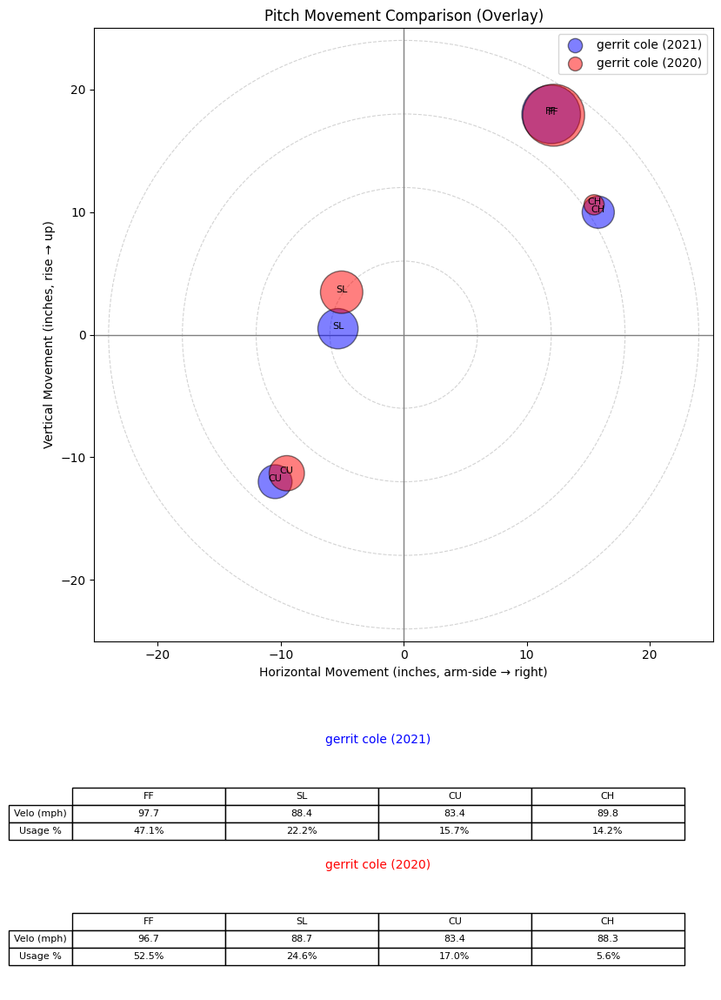

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


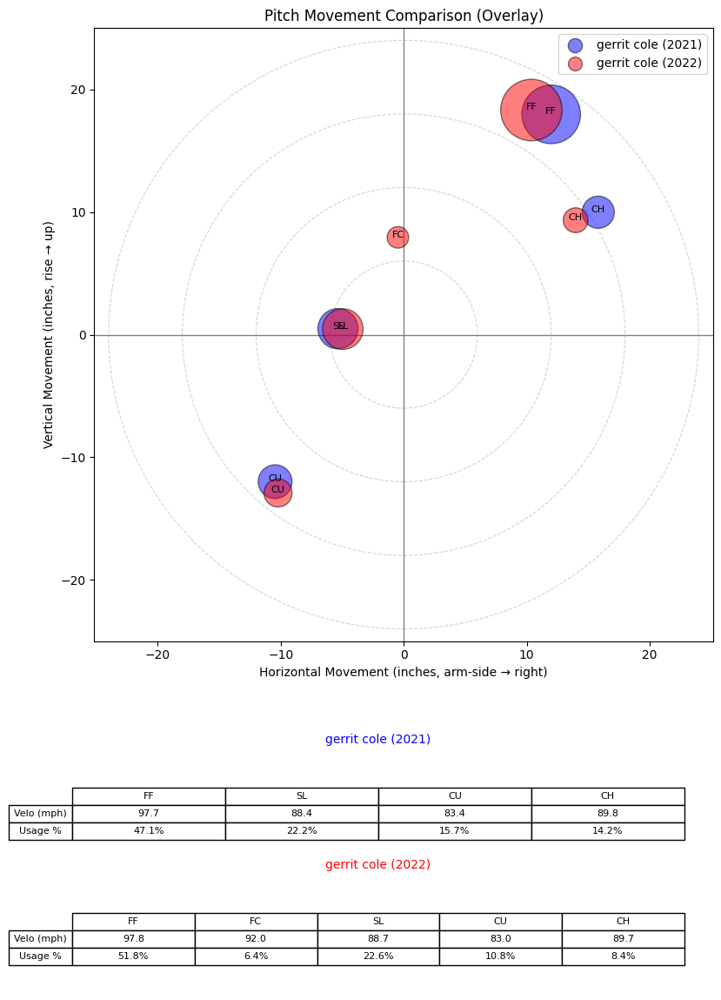

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


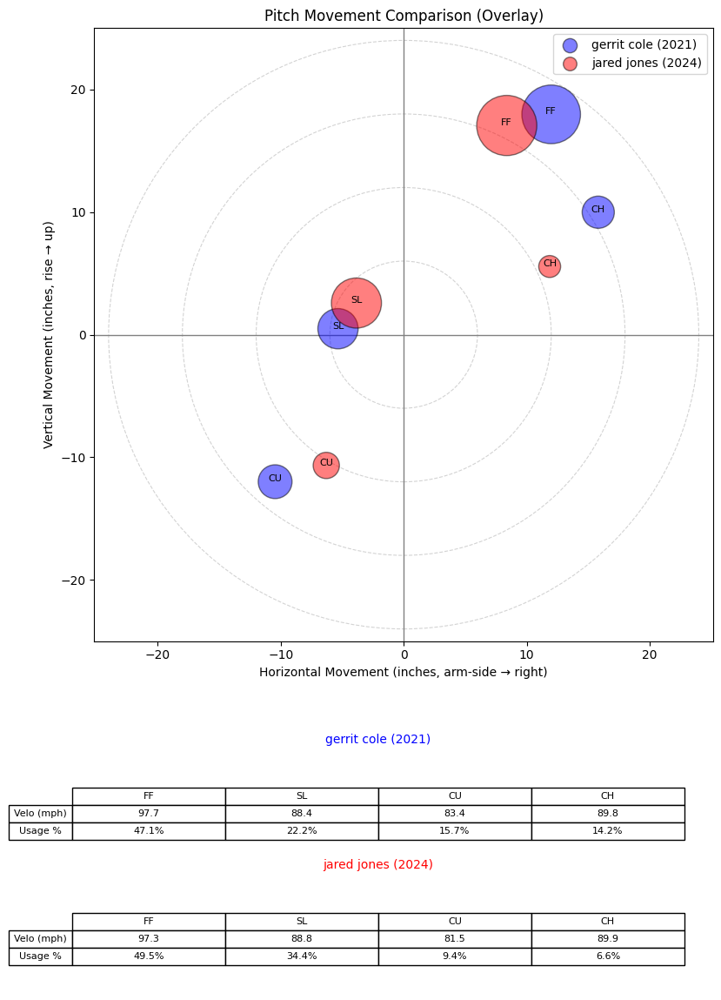

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


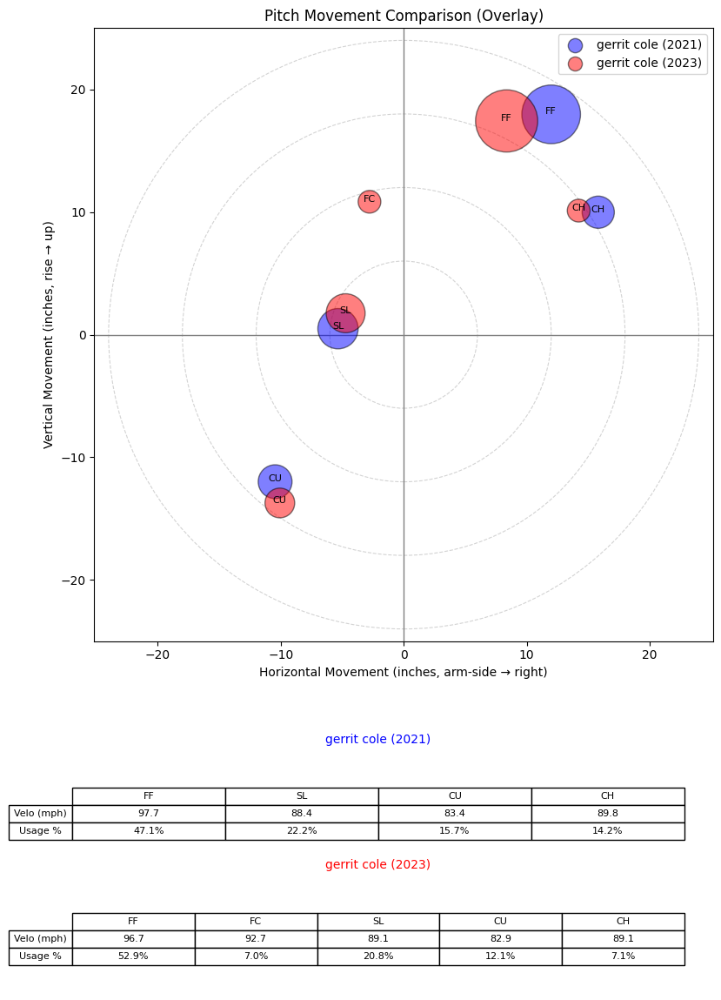

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


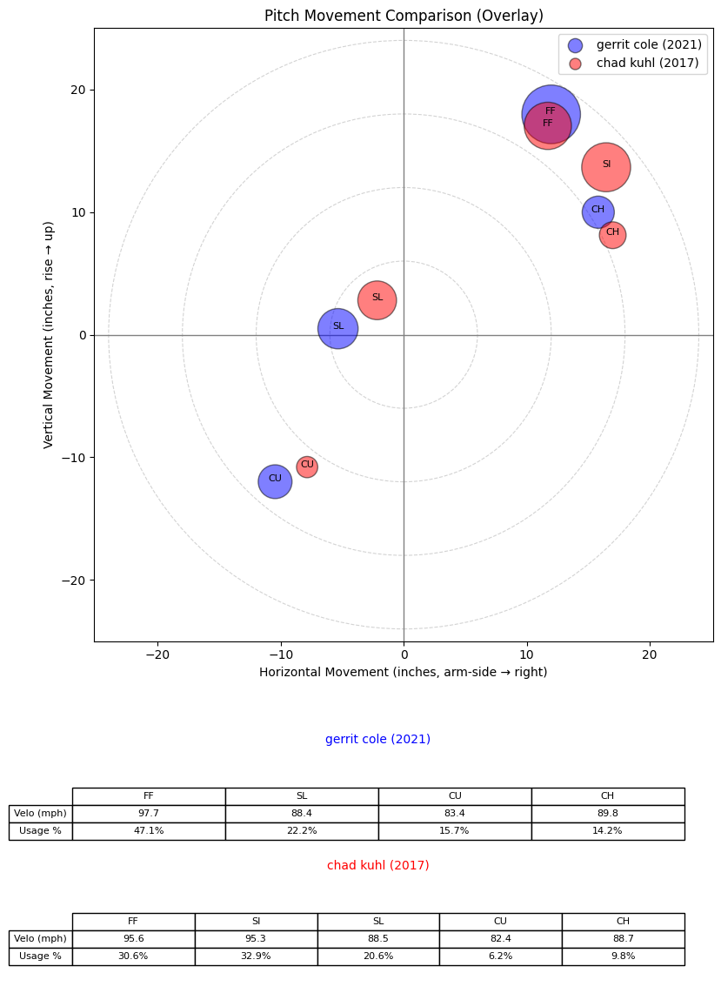

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


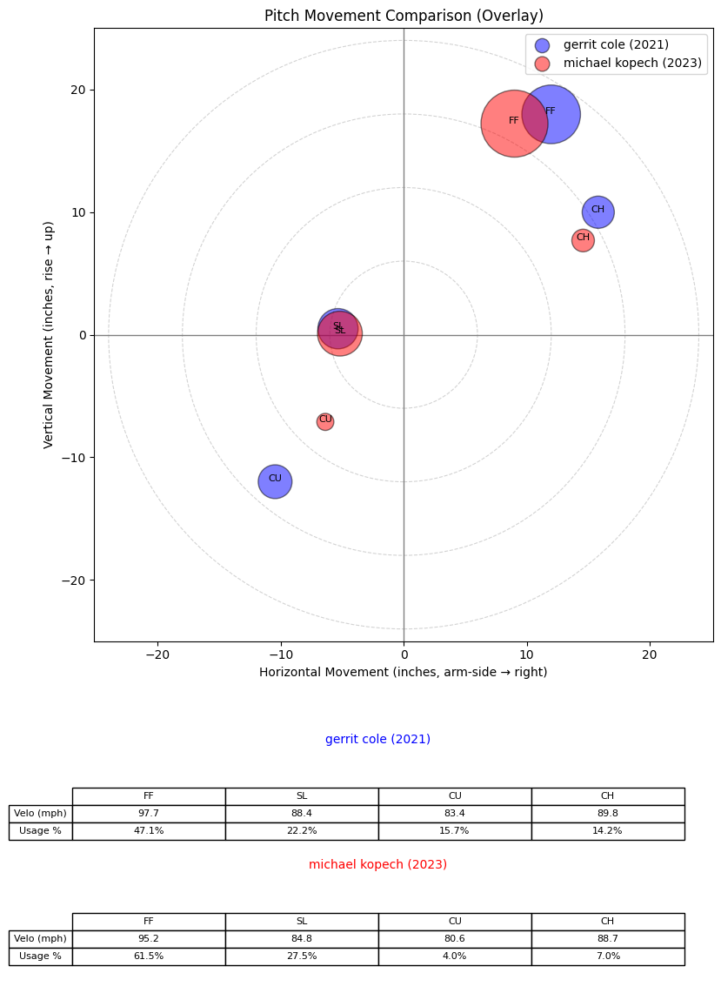

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


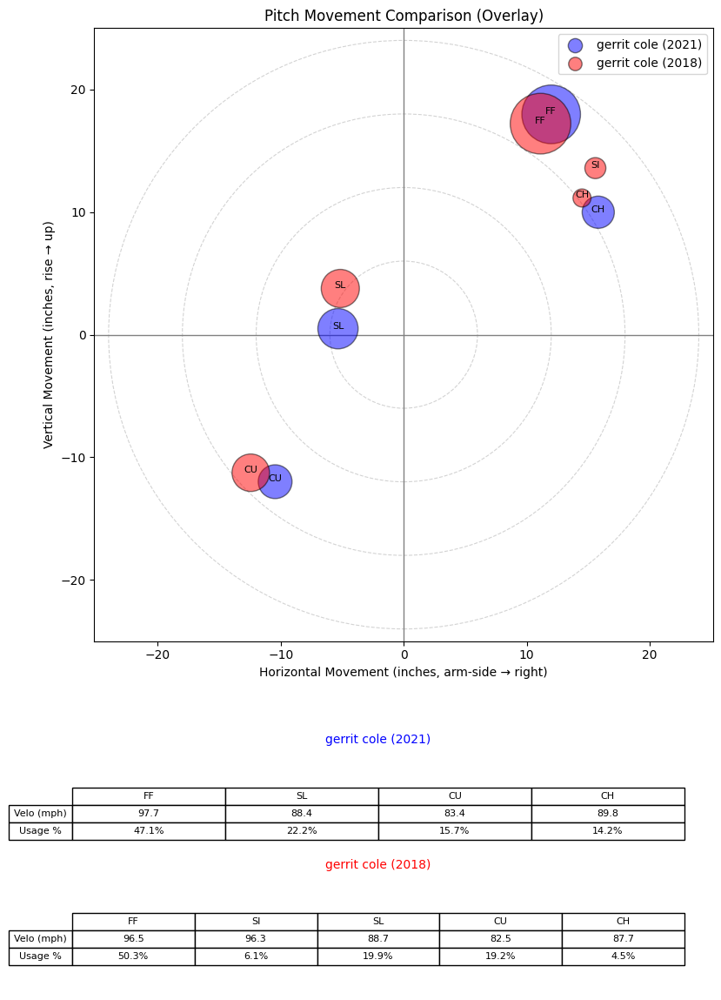

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


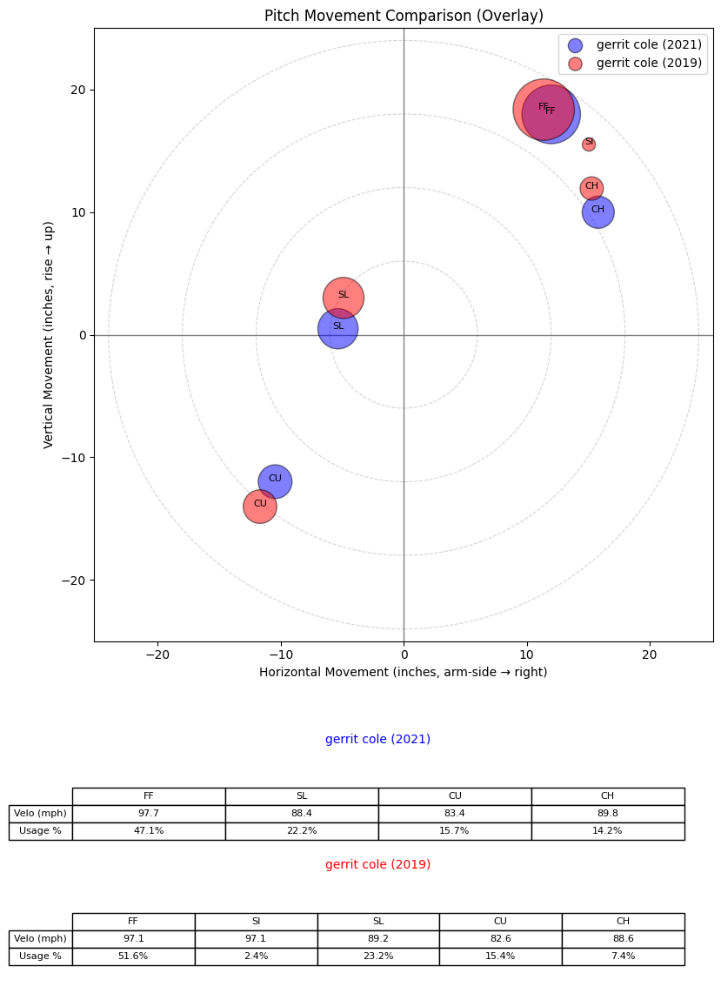

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


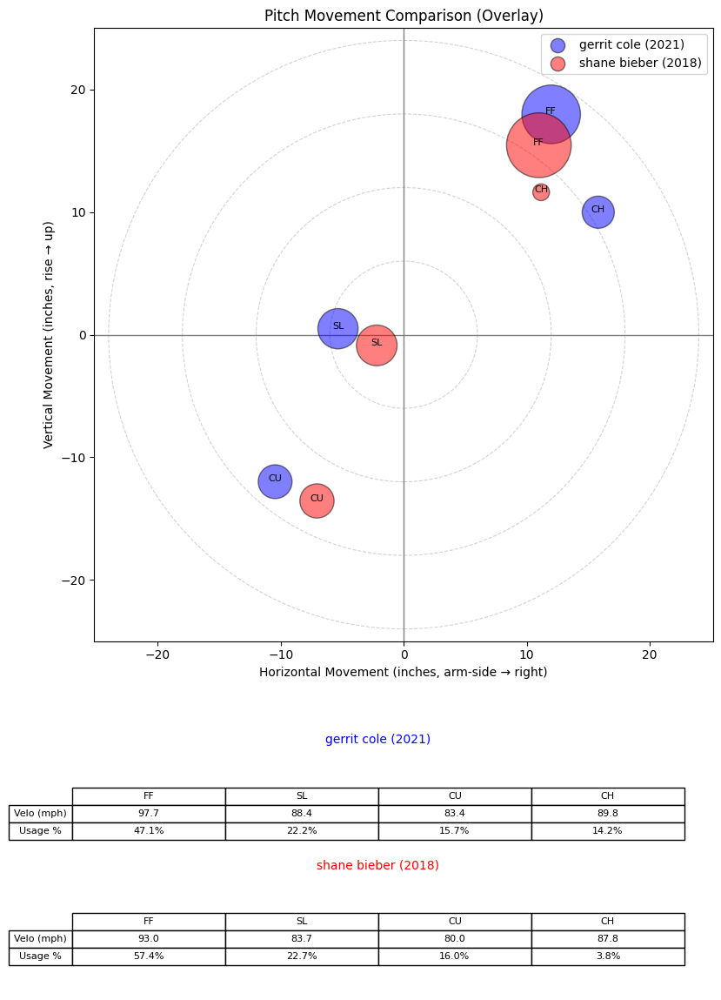

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


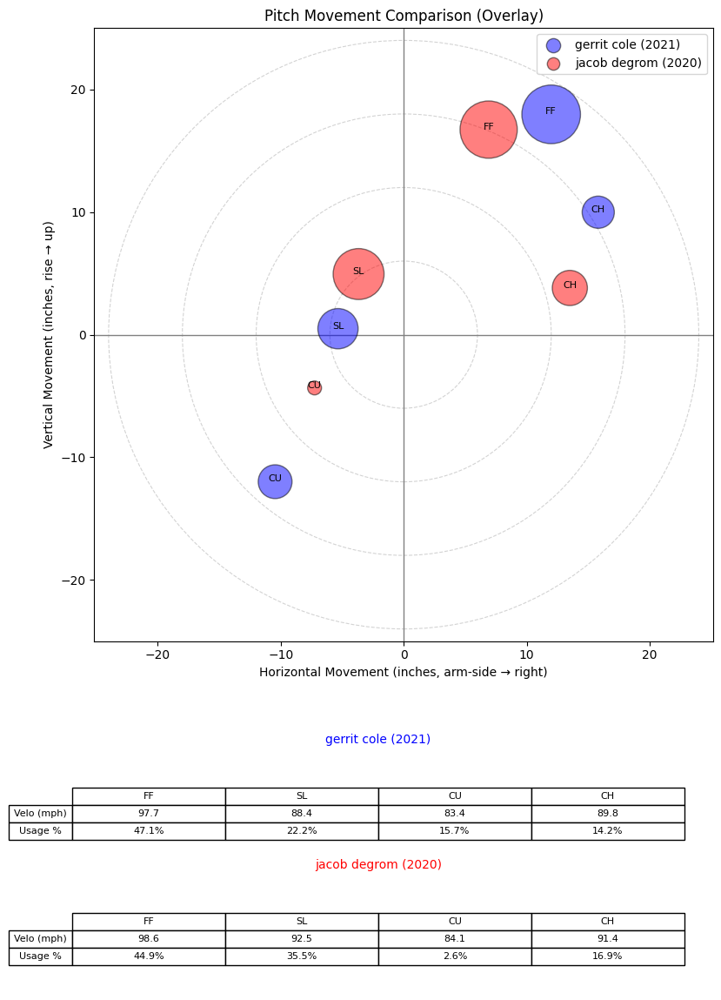

,pitcher,game_year,name,name_first,name_last,p_throws,role,cosine_similarity
535,543037.0,2020,gerrit cole,gerrit,cole,R,starter,0.967796
537,543037.0,2022,gerrit cole,gerrit,cole,R,starter,0.934367
2083,683003.0,2024,jared jones,jared,jones,R,starter,0.853116
538,543037.0,2023,gerrit cole,gerrit,cole,R,starter,0.790004
1515,641771.0,2017,chad kuhl,chad,kuhl,R,starter,0.768976
1696,656629.0,2023,michael kopech,michael,kopech,R,starter,0.762458
533,543037.0,2018,gerrit cole,gerrit,cole,R,starter,0.751932
534,543037.0,2019,gerrit cole,gerrit,cole,R,starter,0.751758
1964,669456.0,2018,shane bieber,shane,bieber,R,starter,0.746077
957,594798.0,2020,jacob degrom,jacob,degrom,R,starter,0.731272


In [199]:
neighbors_same = find_similar_pitchers_by_name_same_hand_role(
    pitcher_name="gerrit cole",
    year=2021,
    X_df=X_ae_metric_df,
    meta_df=pitcher_season_df,
    n_neighbors=10,
    overlay_df=movement_long,  # or whatever df your compare_pitchers_overlay expects
    plot_overlays=True,
    overlay_kwargs={"lim_inches": 25, "size_scale": 5000},
)
display(neighbors_same)

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


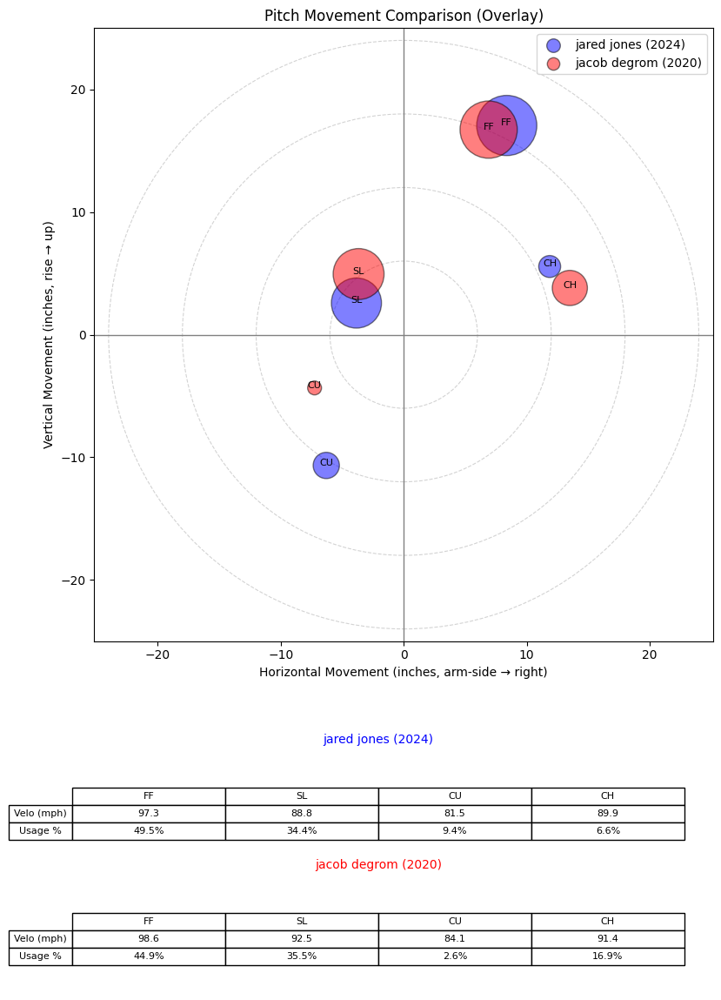

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


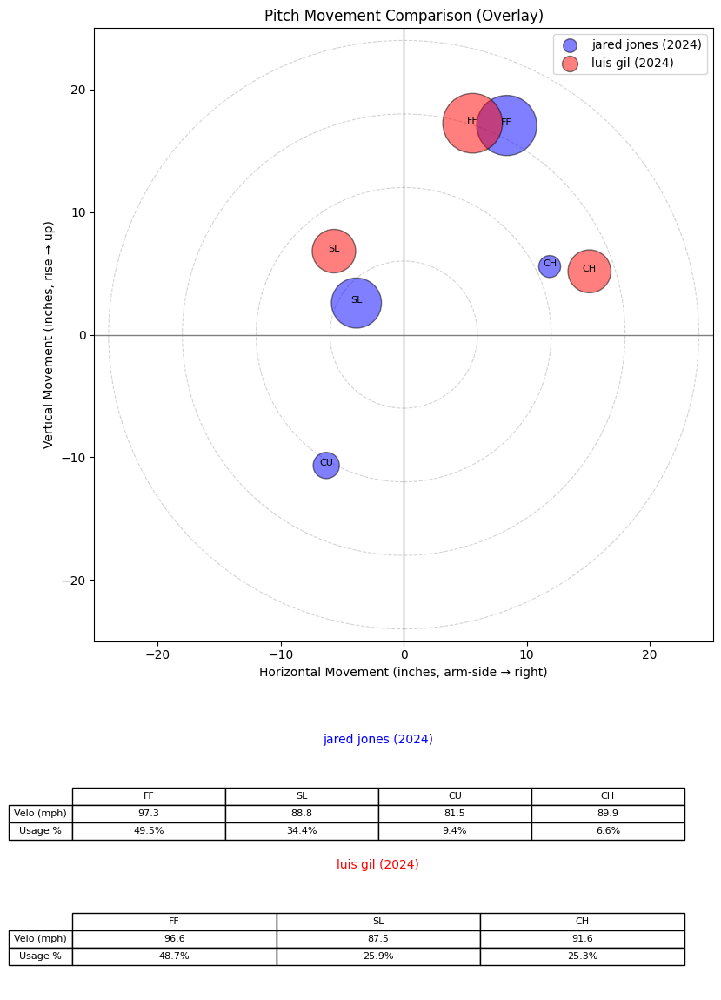

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


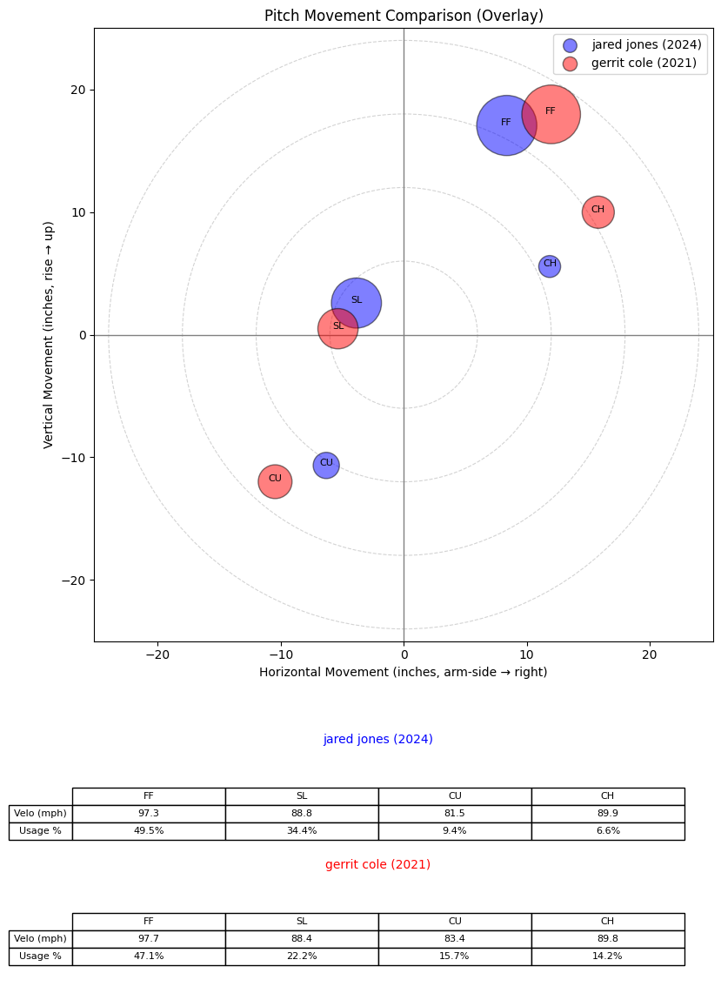

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


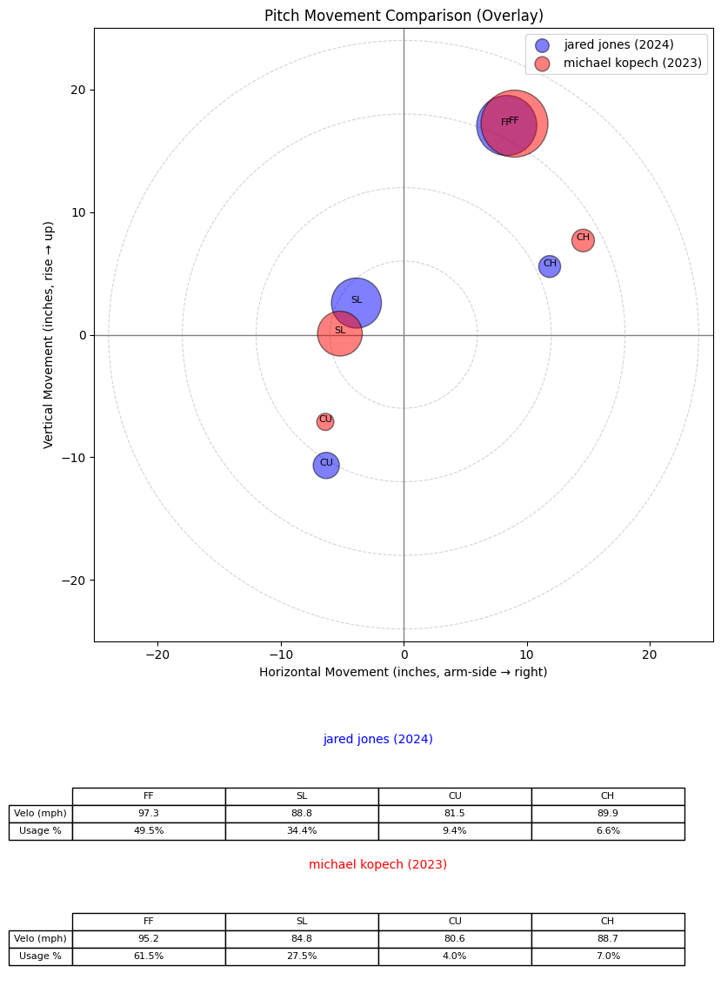

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


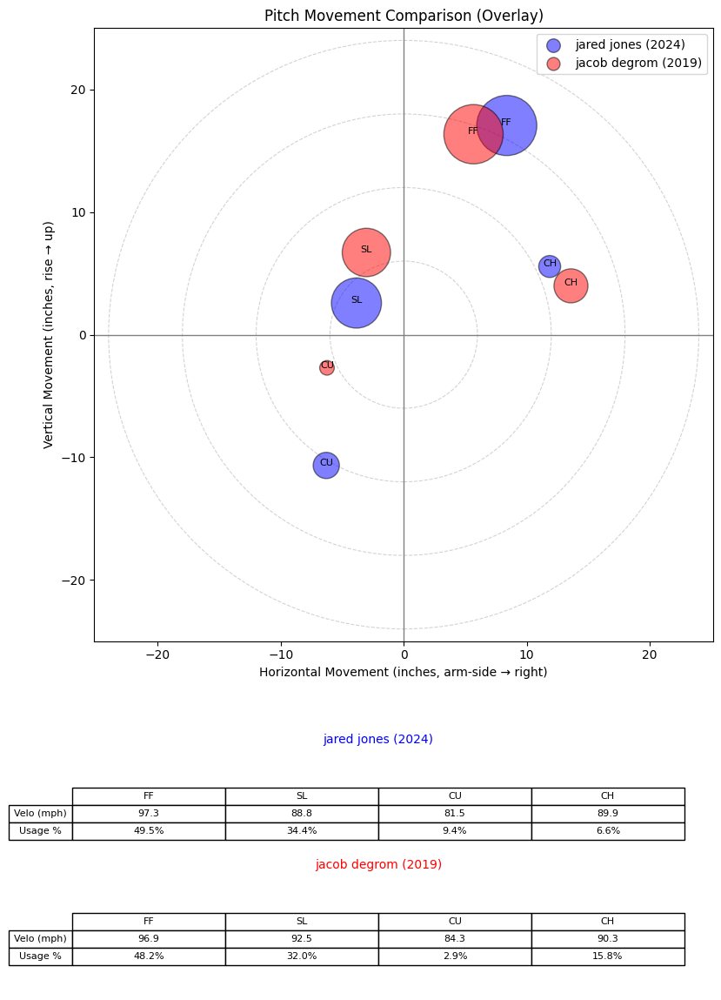

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


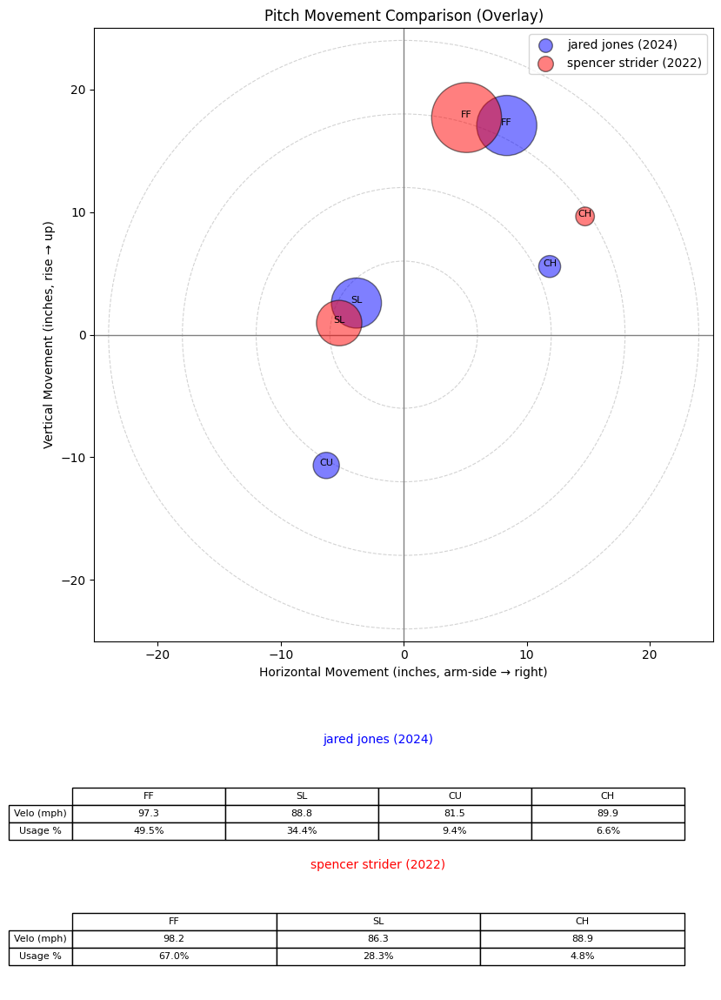

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


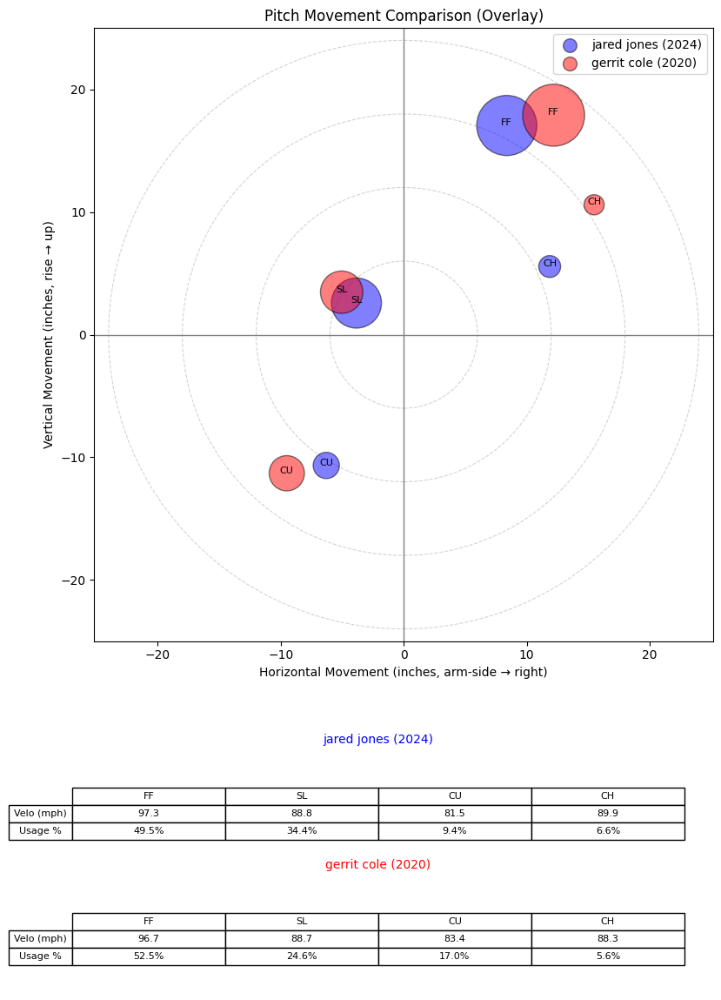

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


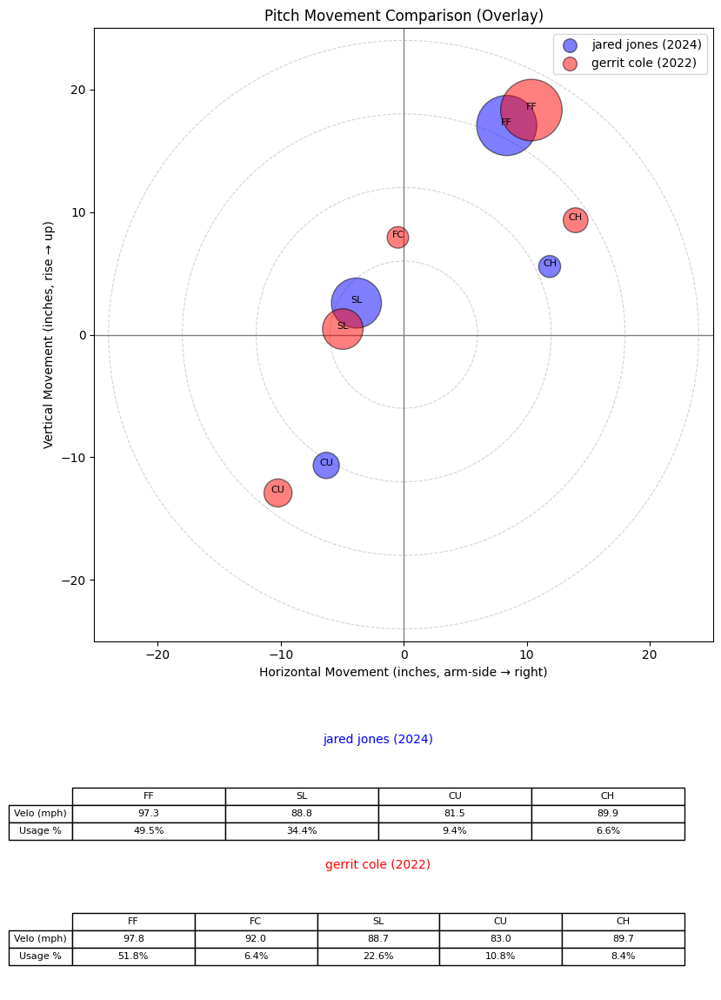

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


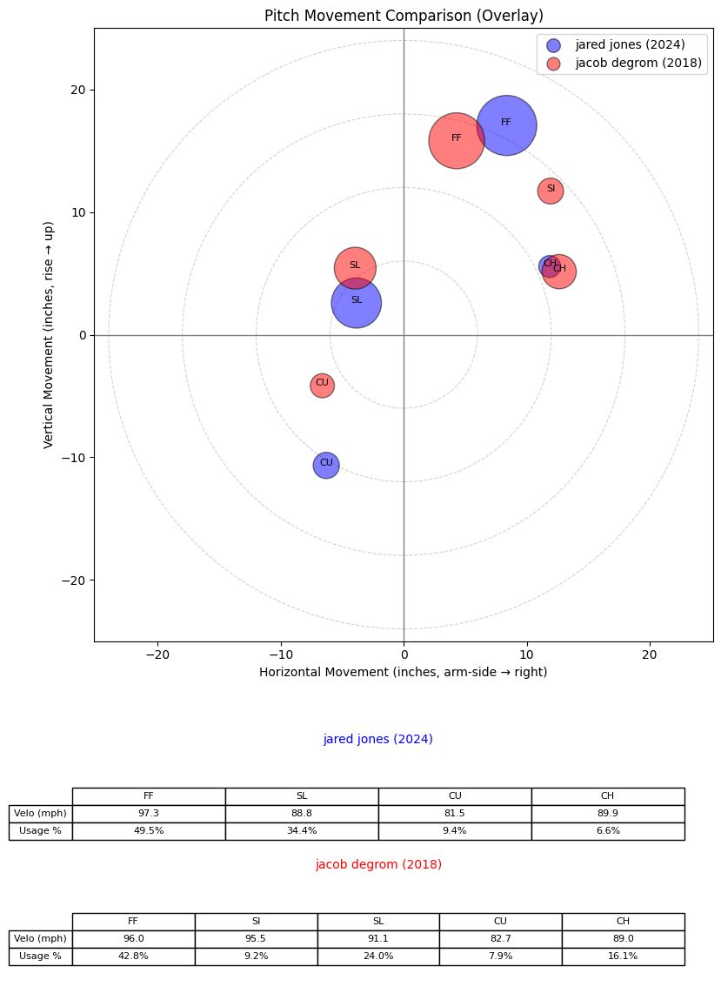

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


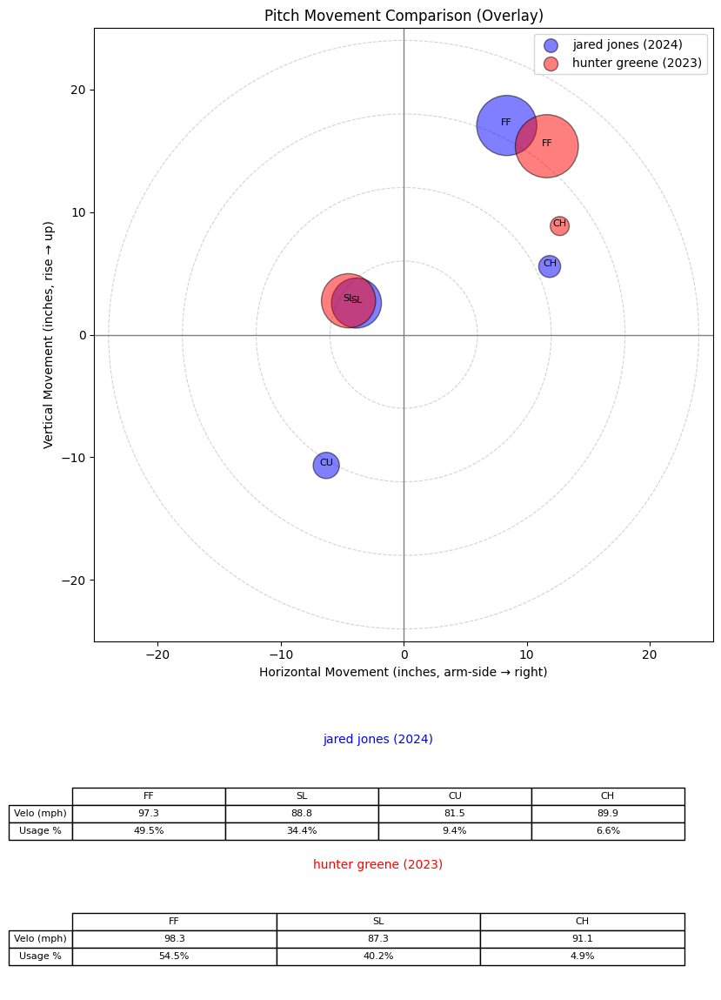

,pitcher,game_year,name,name_first,name_last,p_throws,role,cosine_similarity
957,594798.0,2020,jacob degrom,jacob,degrom,R,starter,0.925429
1783,661563.0,2024,luis gil,luis,gil,R,starter,0.879189
536,543037.0,2021,gerrit cole,gerrit,cole,R,starter,0.853116
1696,656629.0,2023,michael kopech,michael,kopech,R,starter,0.831272
956,594798.0,2019,jacob degrom,jacob,degrom,R,starter,0.817267
2024,675911.0,2022,spencer strider,spencer,strider,R,starter,0.799915
535,543037.0,2020,gerrit cole,gerrit,cole,R,starter,0.778434
537,543037.0,2022,gerrit cole,gerrit,cole,R,starter,0.759084
955,594798.0,2018,jacob degrom,jacob,degrom,R,starter,0.756008
1926,668881.0,2023,hunter greene,hunter,greene,R,starter,0.734988


In [203]:
neighbors_same = find_similar_pitchers_by_name_same_hand_role(
    pitcher_name="jared jones",
    year=2024,
    X_df=X_ae_metric_df,
    meta_df=pitcher_season_df,
    n_neighbors=10,
    overlay_df=movement_long,  # or whatever df your compare_pitchers_overlay expects
    plot_overlays=True,
    overlay_kwargs={"lim_inches": 25, "size_scale": 5000},
)
display(neighbors_same)

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


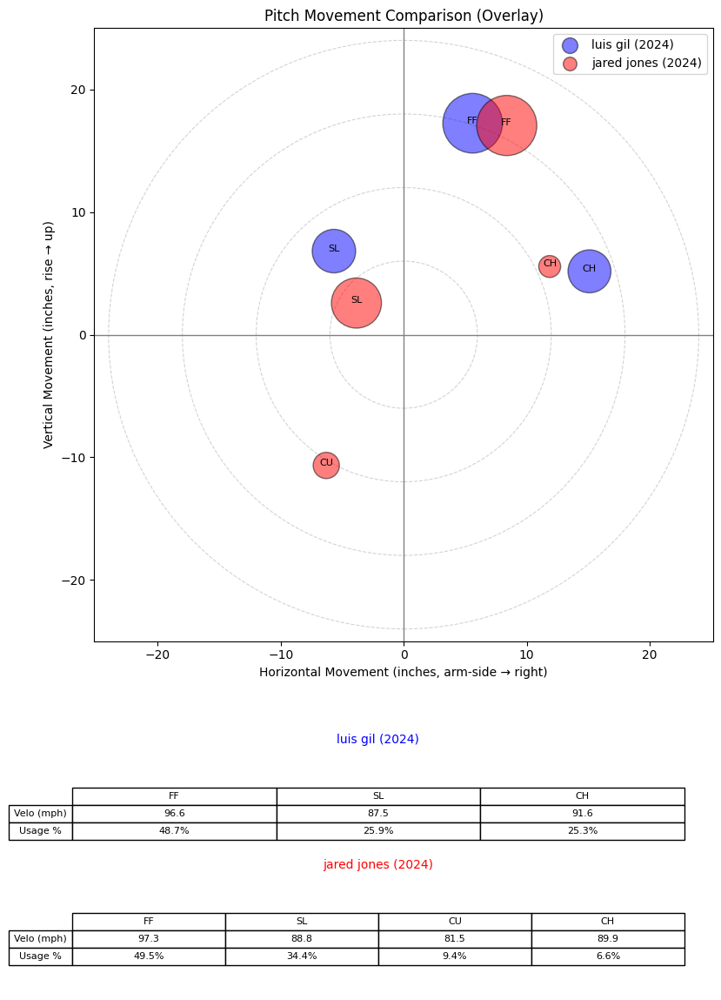

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


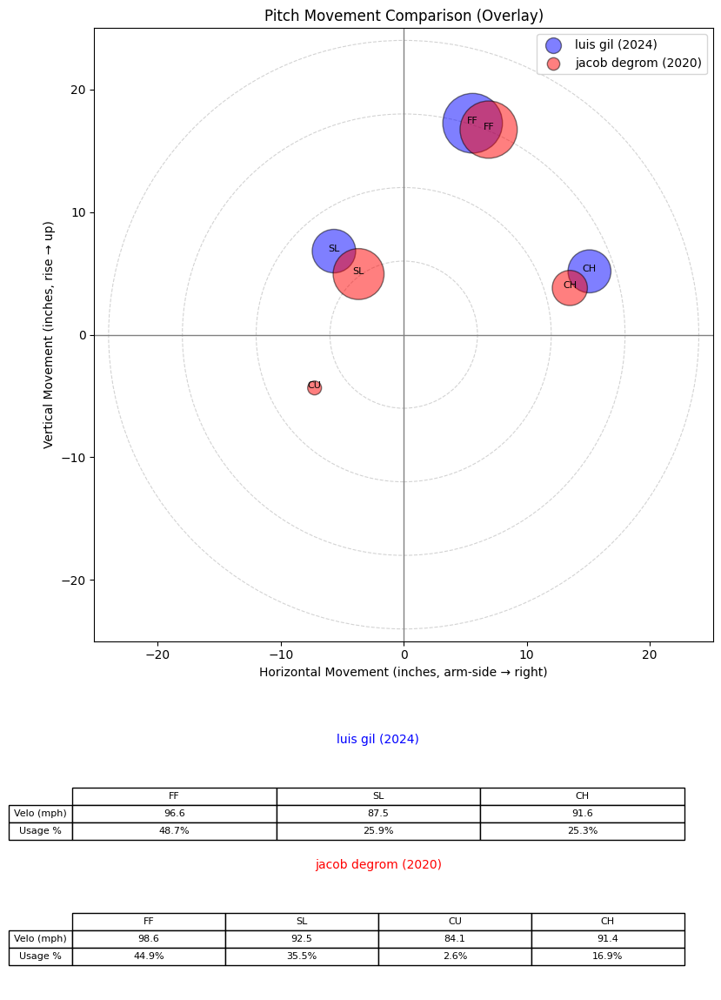

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


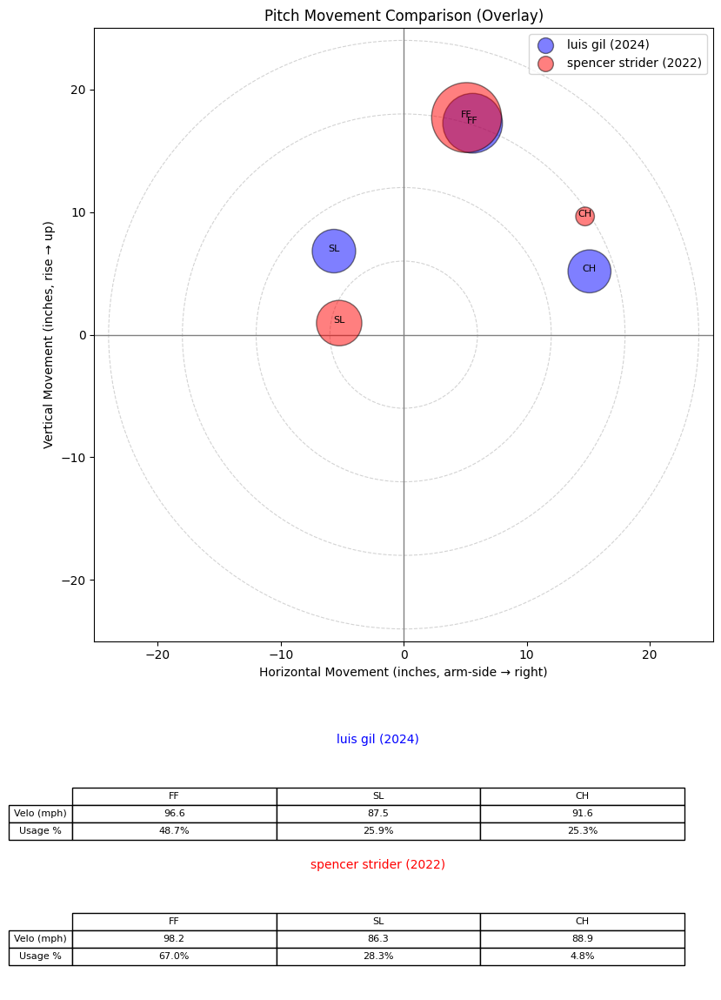

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


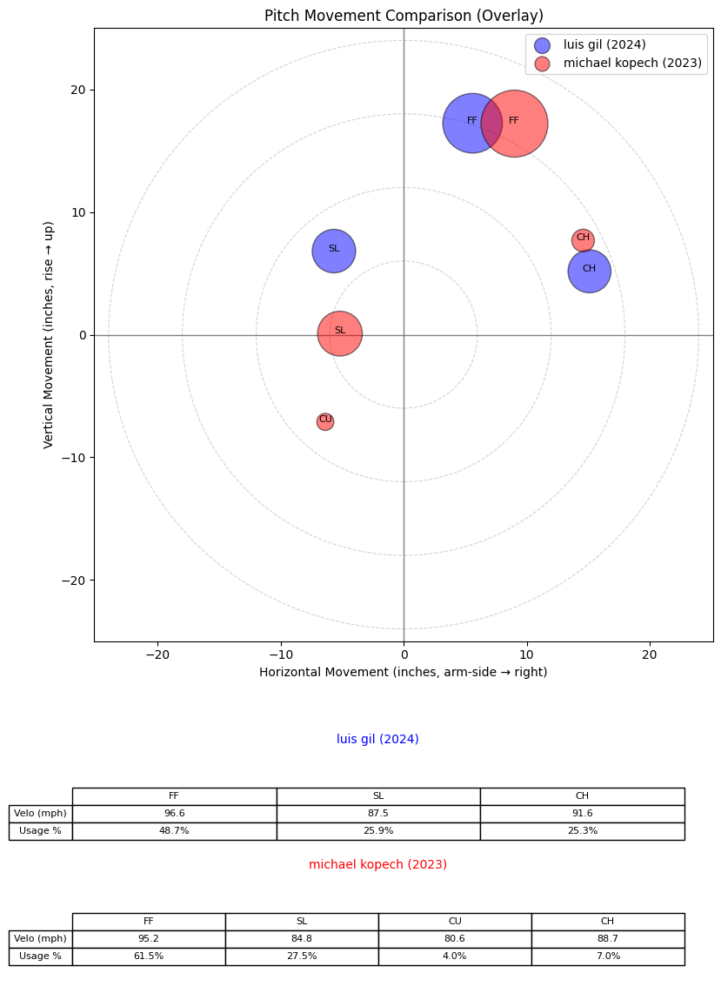

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


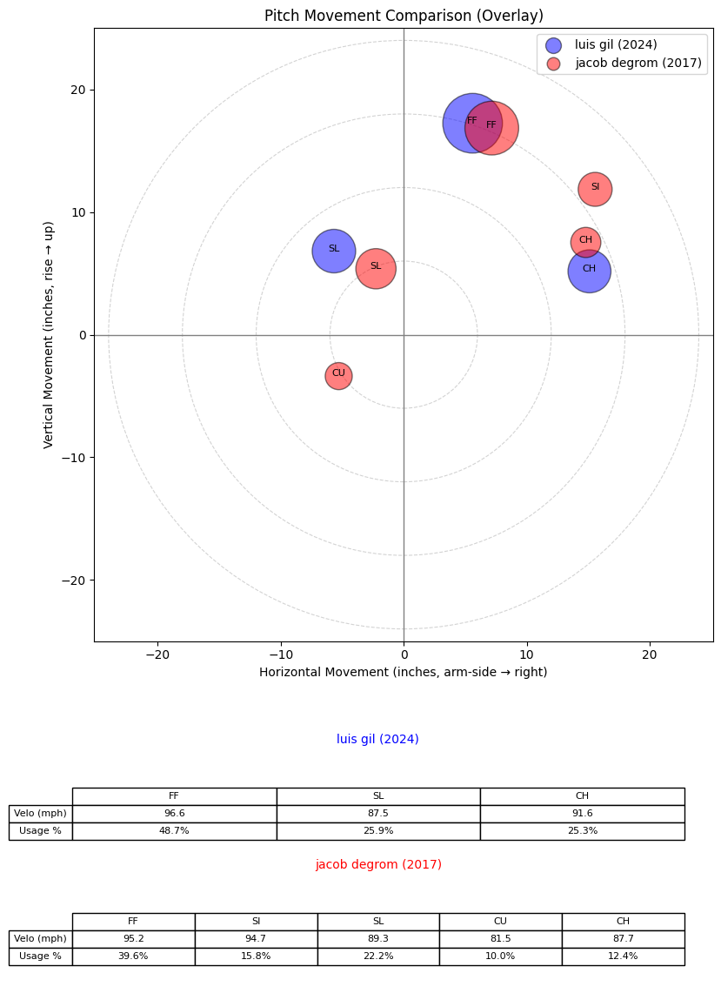

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


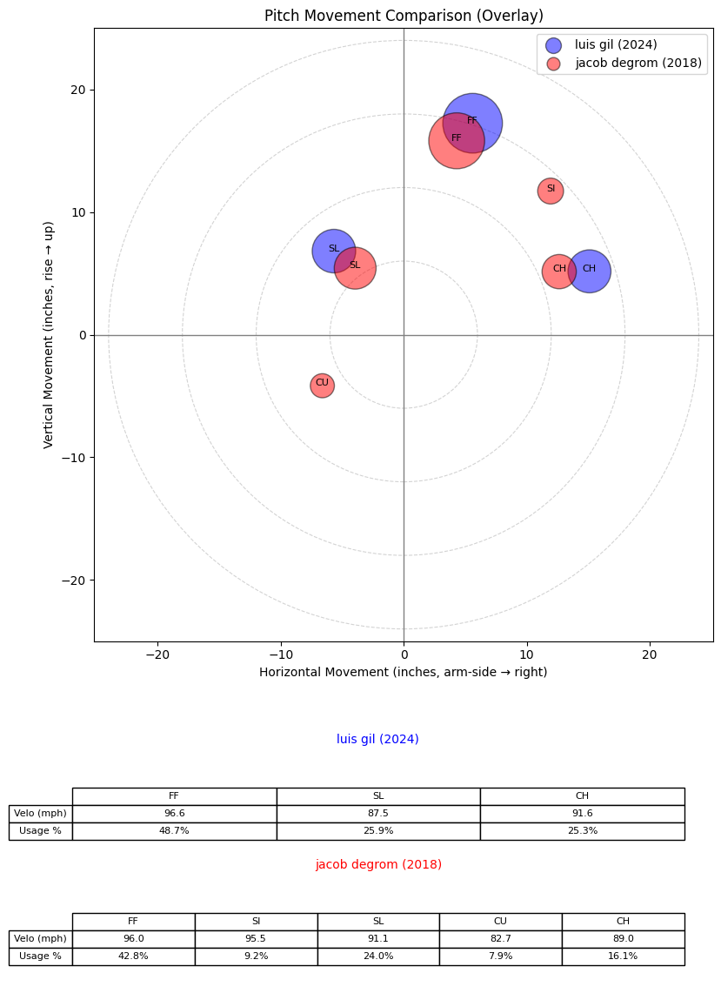

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


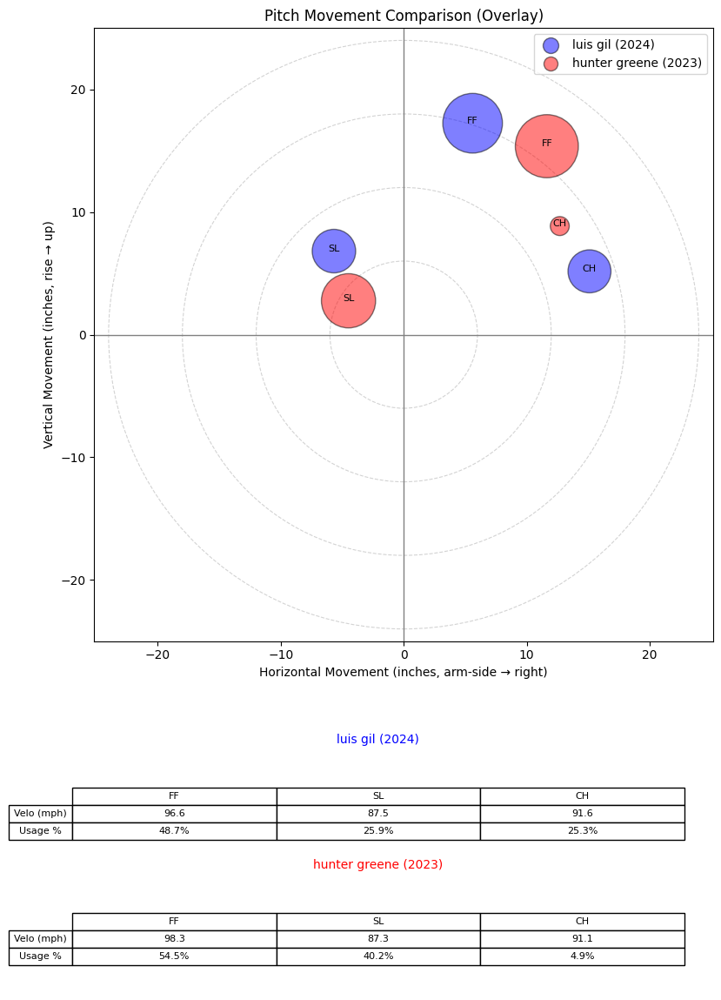

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


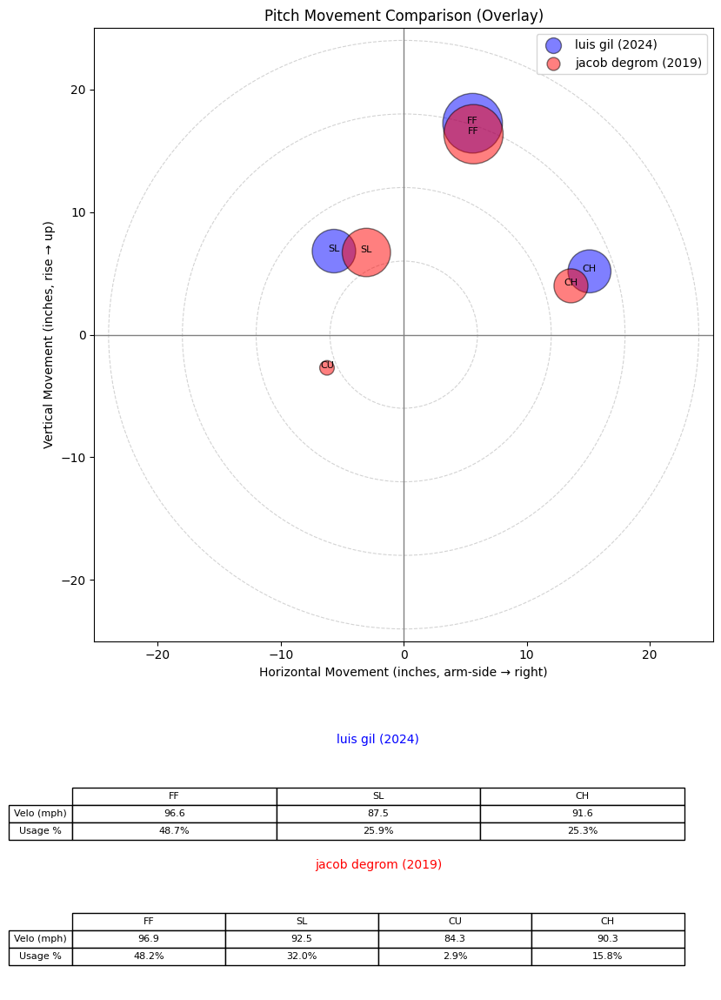

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


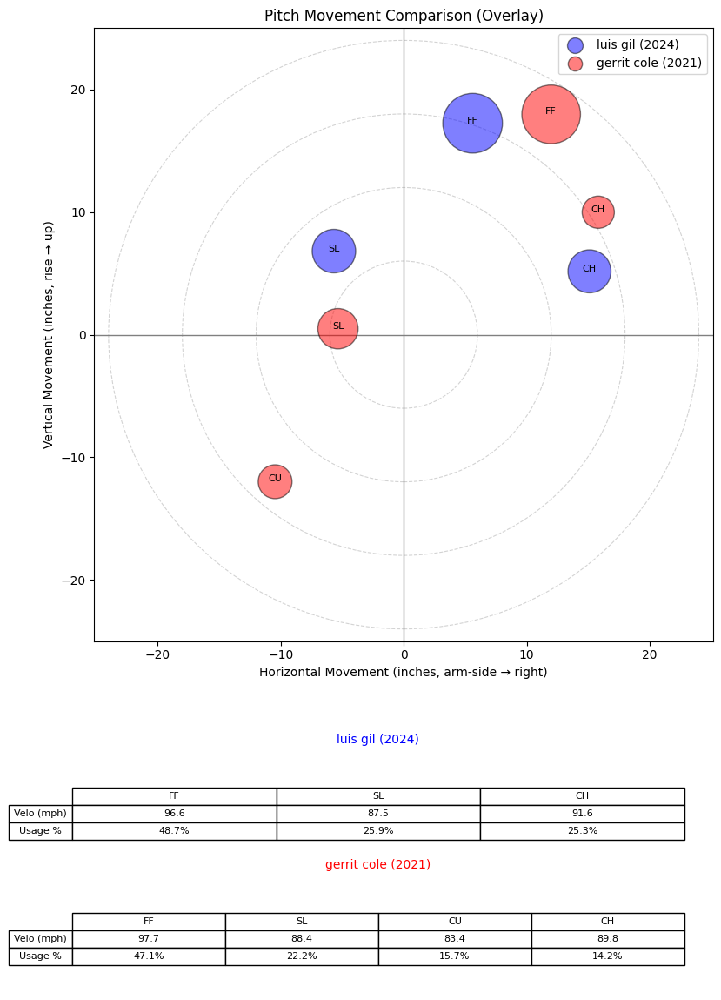

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


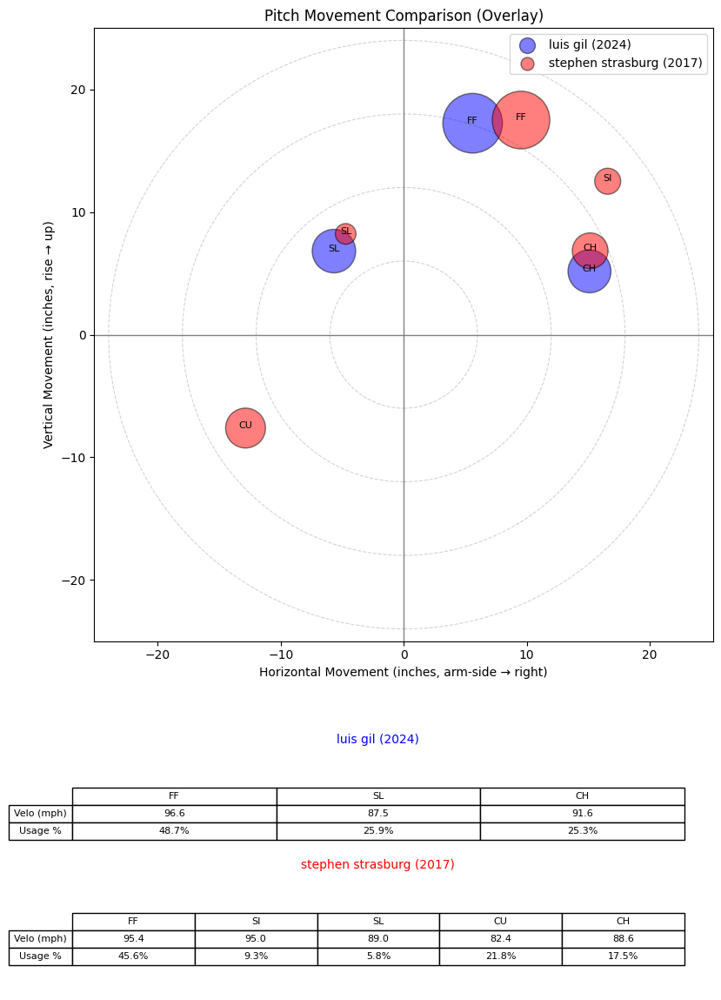

,pitcher,game_year,name,name_first,name_last,p_throws,role,cosine_similarity
2083,683003.0,2024,jared jones,jared,jones,R,starter,0.879189
957,594798.0,2020,jacob degrom,jacob,degrom,R,starter,0.821318
2024,675911.0,2022,spencer strider,spencer,strider,R,starter,0.789591
1696,656629.0,2023,michael kopech,michael,kopech,R,starter,0.760719
954,594798.0,2017,jacob degrom,jacob,degrom,R,starter,0.760291
955,594798.0,2018,jacob degrom,jacob,degrom,R,starter,0.733376
1926,668881.0,2023,hunter greene,hunter,greene,R,starter,0.733339
956,594798.0,2019,jacob degrom,jacob,degrom,R,starter,0.728814
536,543037.0,2021,gerrit cole,gerrit,cole,R,starter,0.670523
634,544931.0,2017,stephen strasburg,stephen,strasburg,R,starter,0.667549


In [204]:
neighbors_same = find_similar_pitchers_by_name_same_hand_role(
    pitcher_name="luis gil",
    year=2024,
    X_df=X_ae_metric_df,
    meta_df=pitcher_season_df,
    n_neighbors=10,
    overlay_df=movement_long,  # or whatever df your compare_pitchers_overlay expects
    plot_overlays=True,
    overlay_kwargs={"lim_inches": 25, "size_scale": 5000},
)
display(neighbors_same)

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


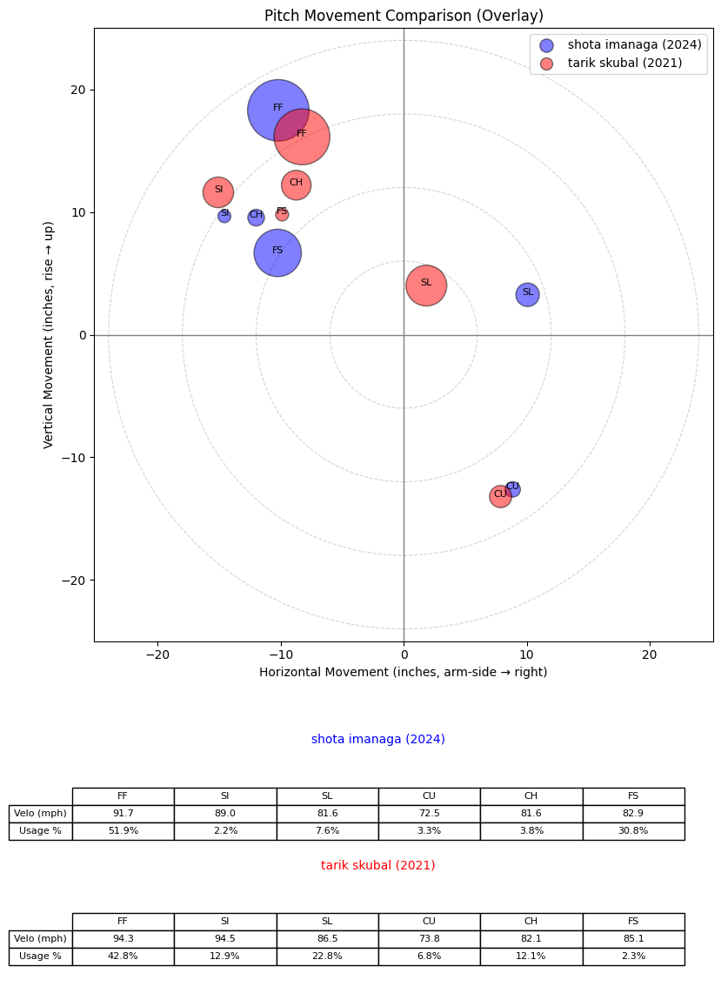

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


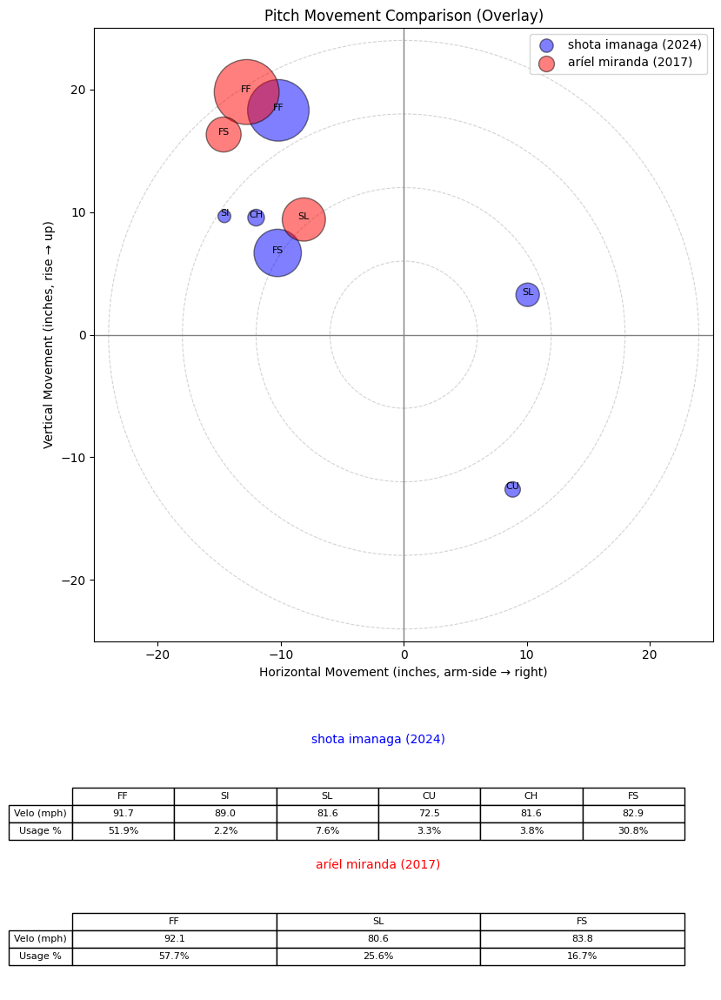

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


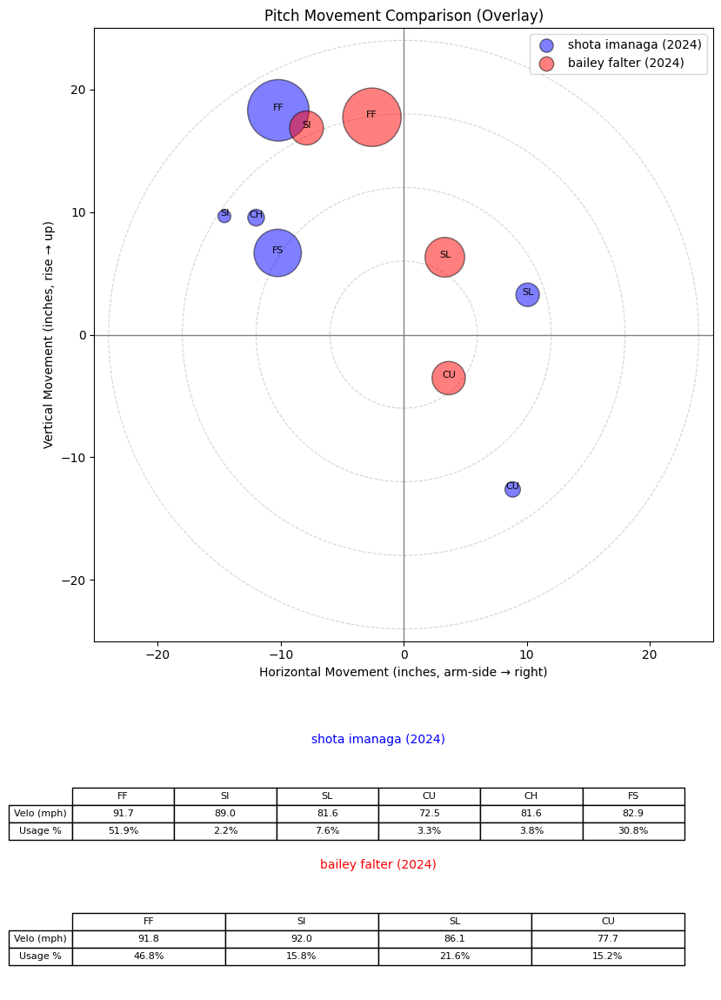

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


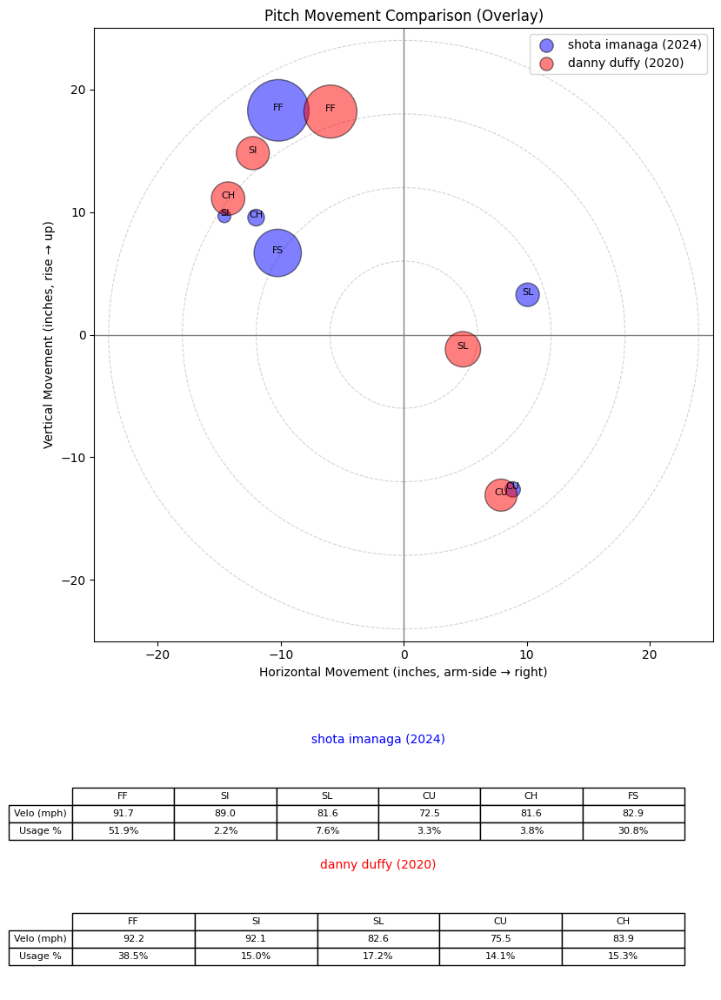

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


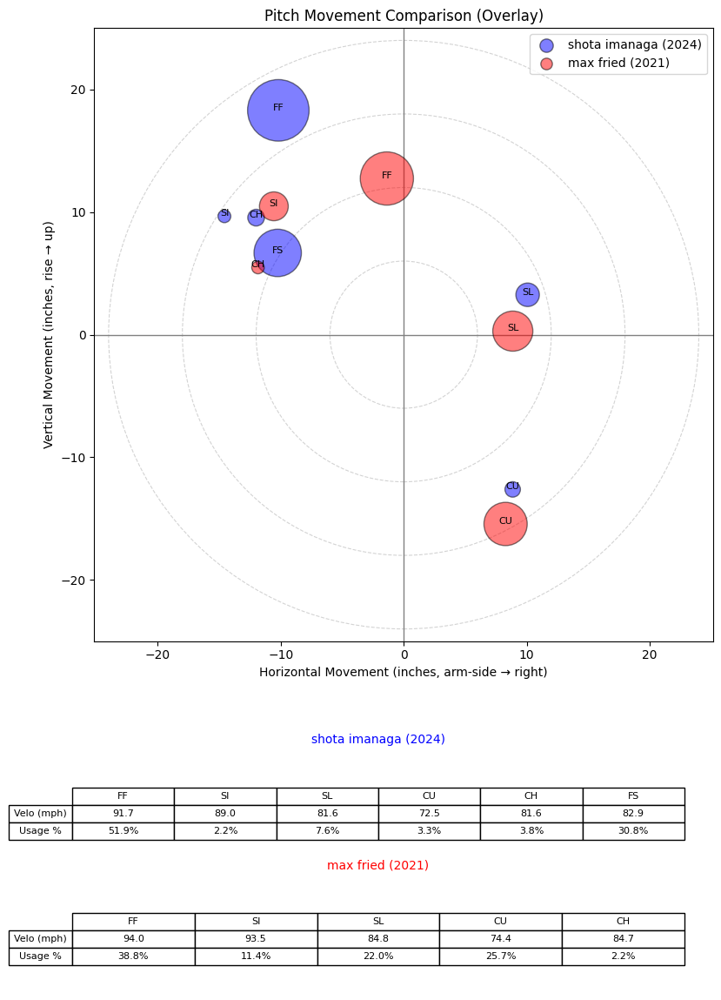

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


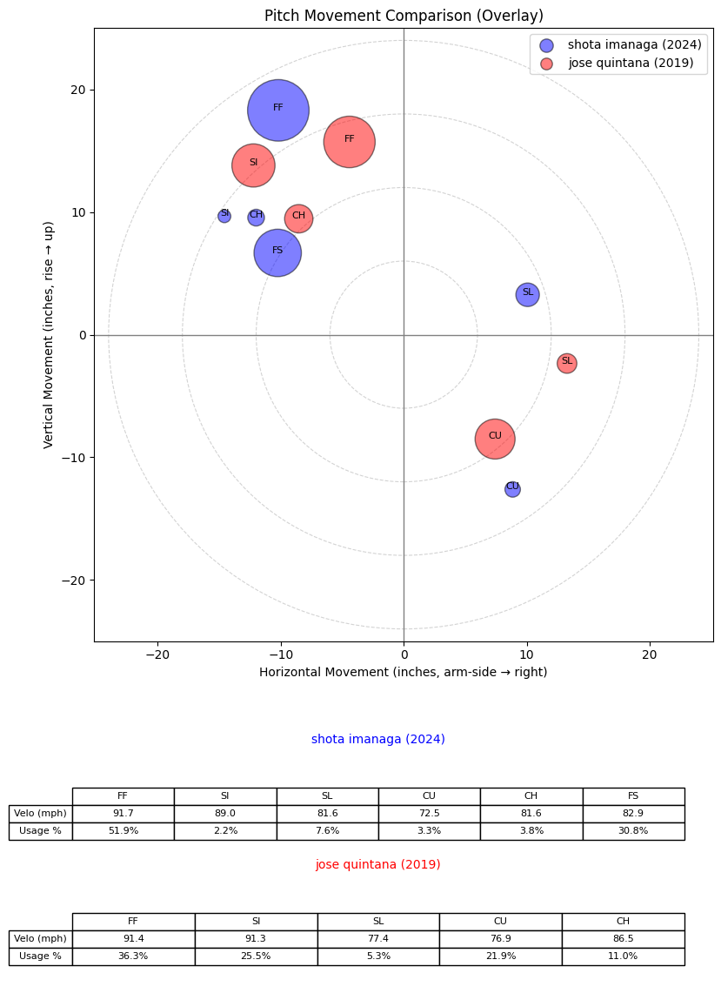

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


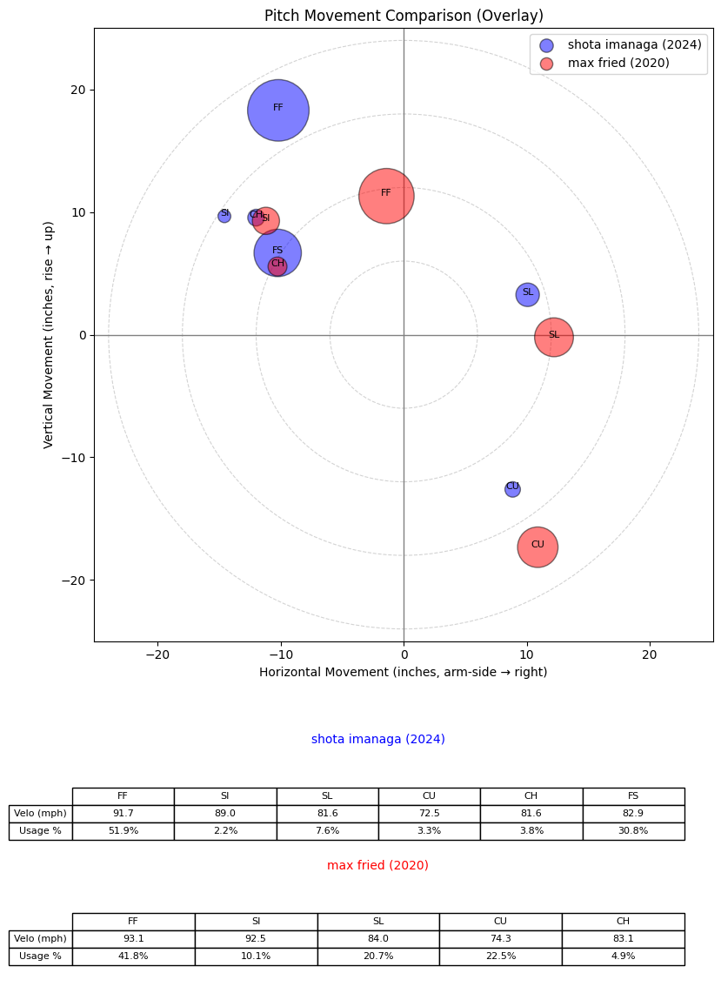

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


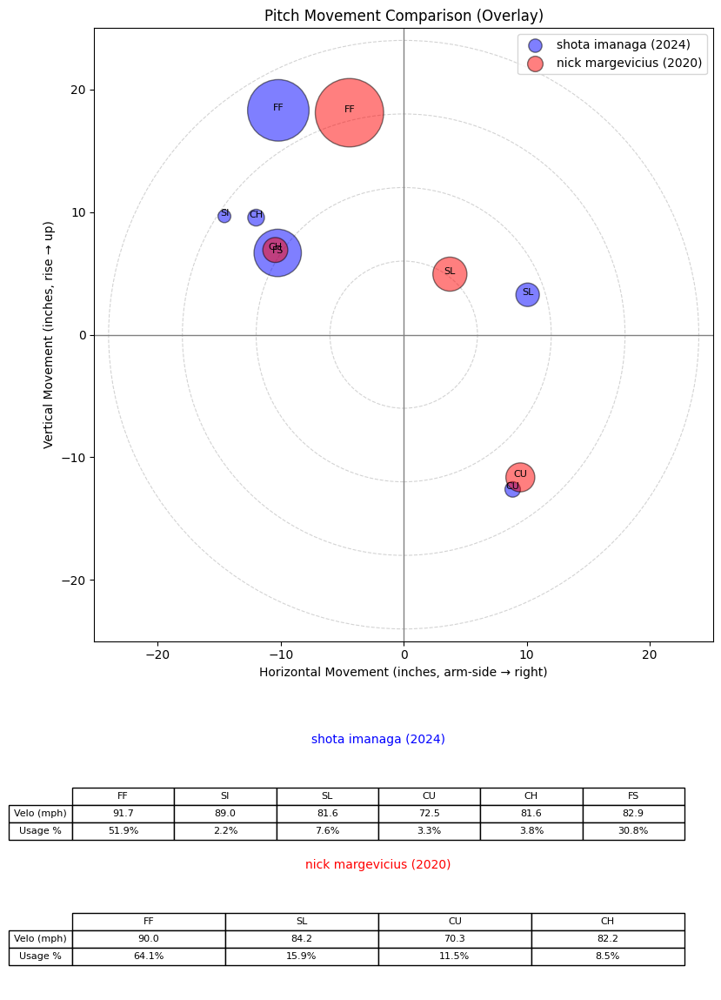

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


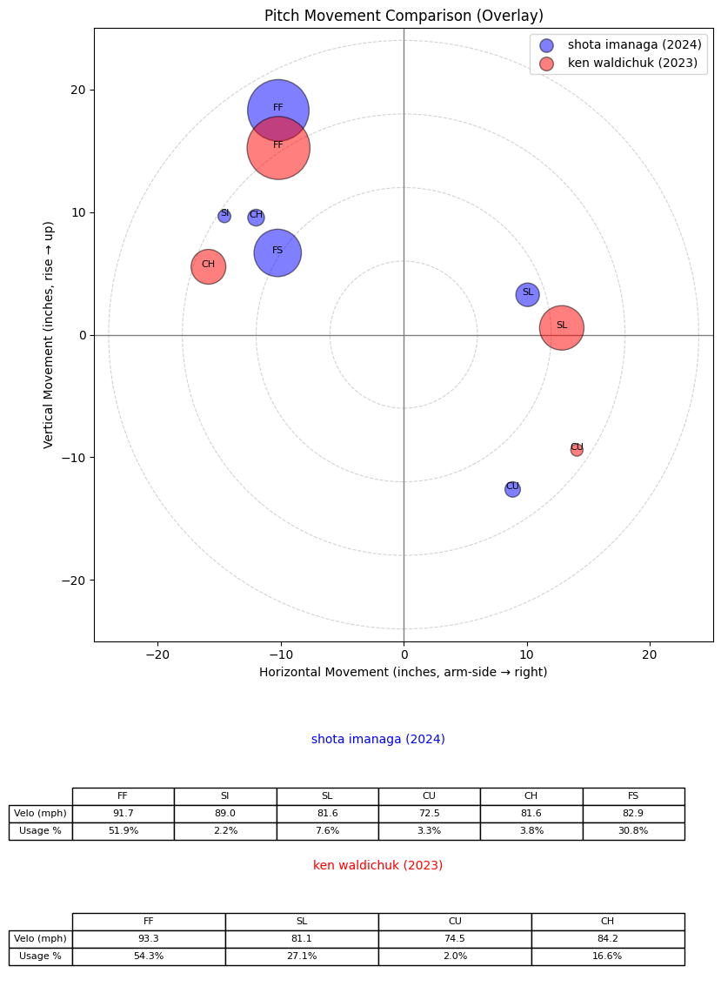

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


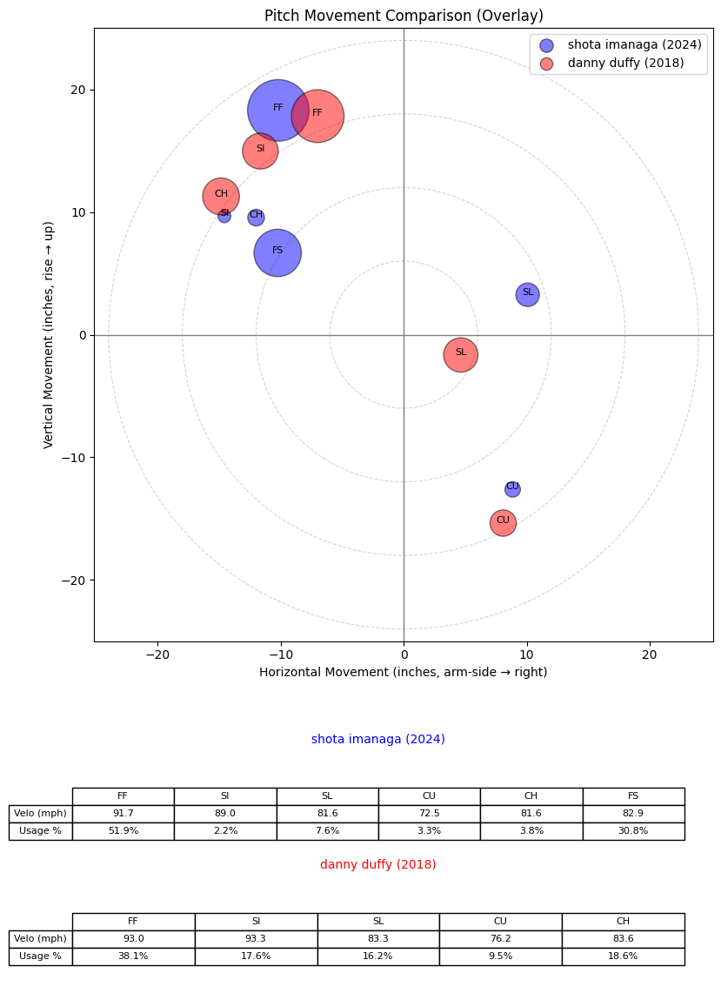

,pitcher,game_year,name,name_first,name_last,p_throws,role,cosine_similarity
1957,669373.0,2021,tarik skubal,tarik,skubal,L,starter,0.873834
1871,664641.0,2017,aríel miranda,aríel,miranda,L,starter,0.740985
1805,663559.0,2024,bailey falter,bailey,falter,L,starter,0.550084
413,518633.0,2020,danny duffy,danny,duffy,L,starter,0.475217
1223,608331.0,2021,max fried,max,fried,L,starter,0.475150
291,500779.0,2019,jose quintana,jose,quintana,L,starter,0.454996
1222,608331.0,2020,max fried,max,fried,L,starter,0.452892
2042,676606.0,2020,nick margevicius,nick,margevicius,L,starter,0.451100
2092,686610.0,2023,ken waldichuk,ken,waldichuk,L,starter,0.442694
411,518633.0,2018,danny duffy,danny,duffy,L,starter,0.432703


In [205]:
neighbors_same = find_similar_pitchers_by_name_same_hand_role(
    pitcher_name="shota imanaga",
    year=2024,
    X_df=X_ae_metric_df,
    meta_df=pitcher_season_df,
    n_neighbors=10,
    overlay_df=movement_long,  # or whatever df your compare_pitchers_overlay expects
    plot_overlays=True,
    overlay_kwargs={"lim_inches": 25, "size_scale": 5000},
)
display(neighbors_same)

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


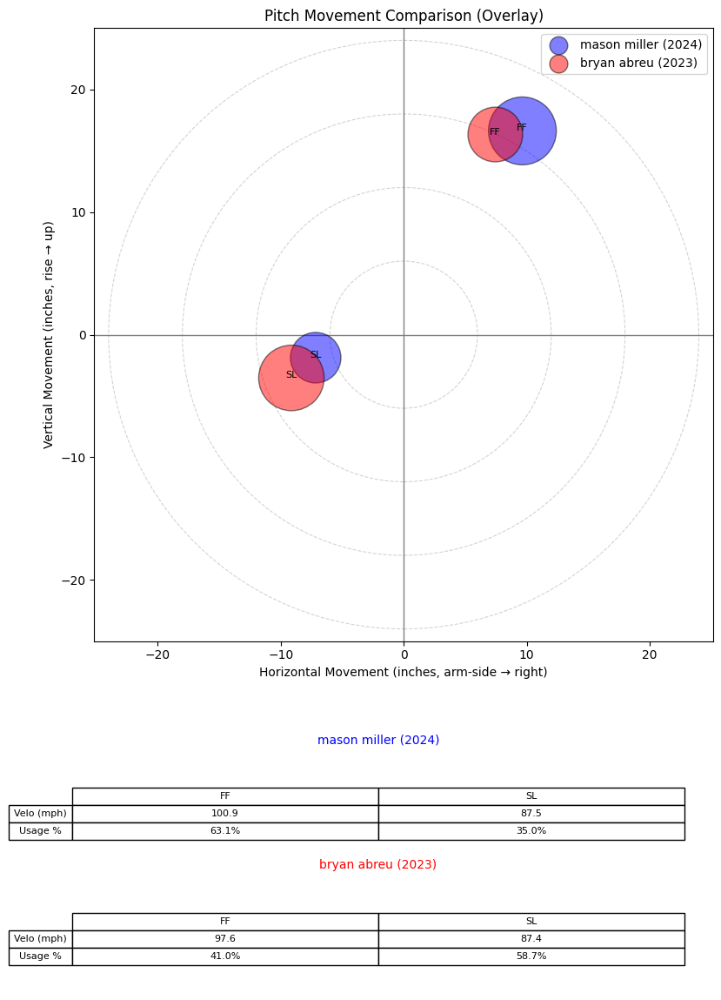

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


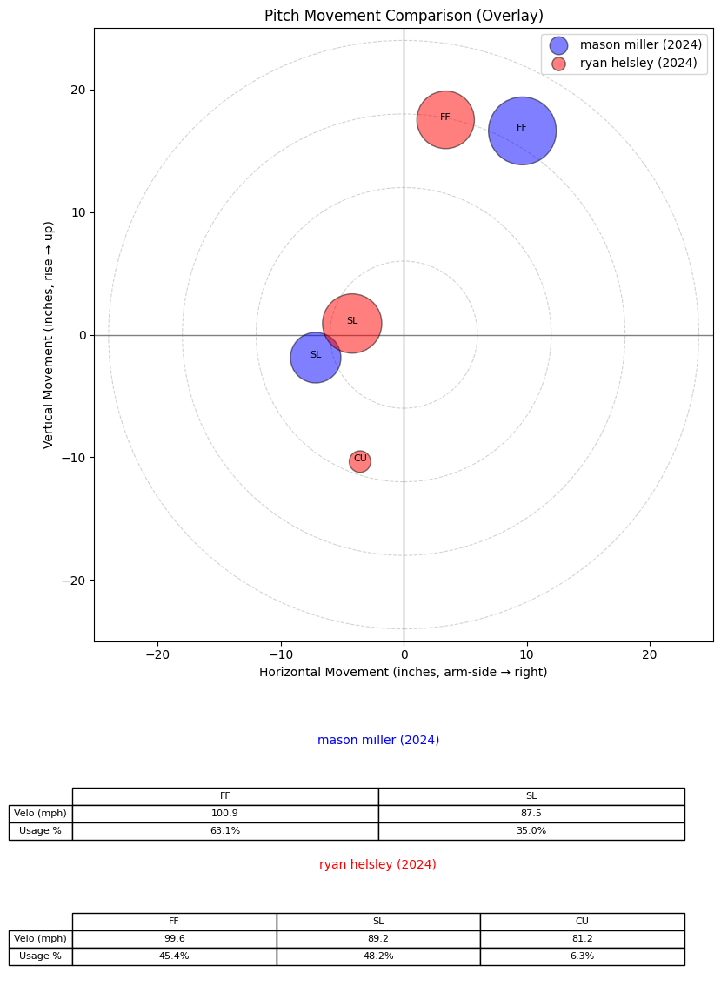

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


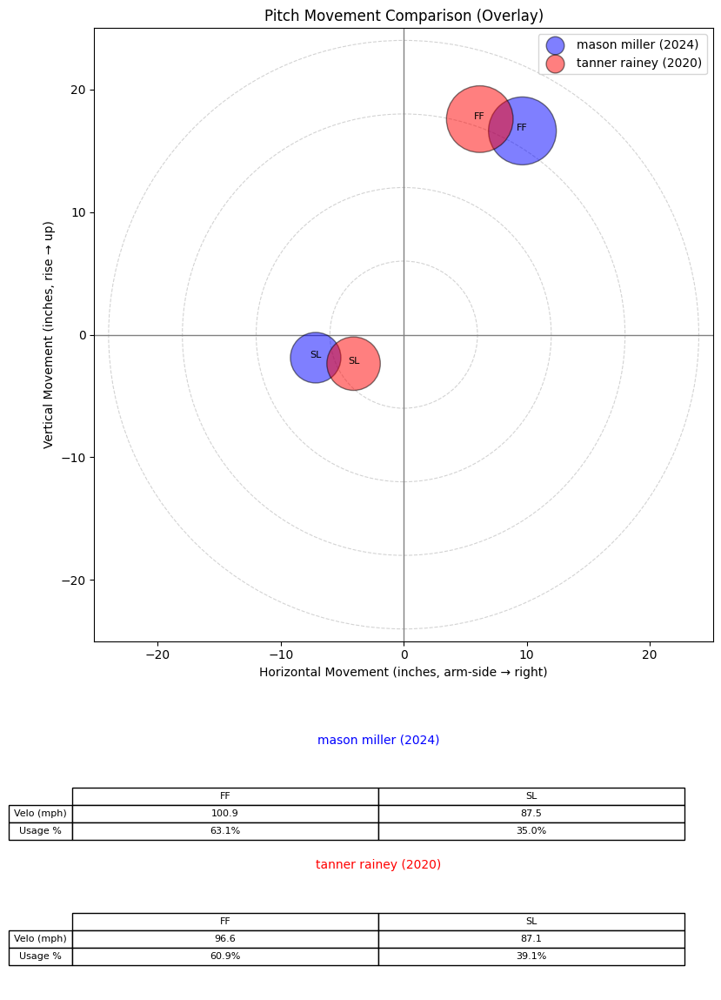

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


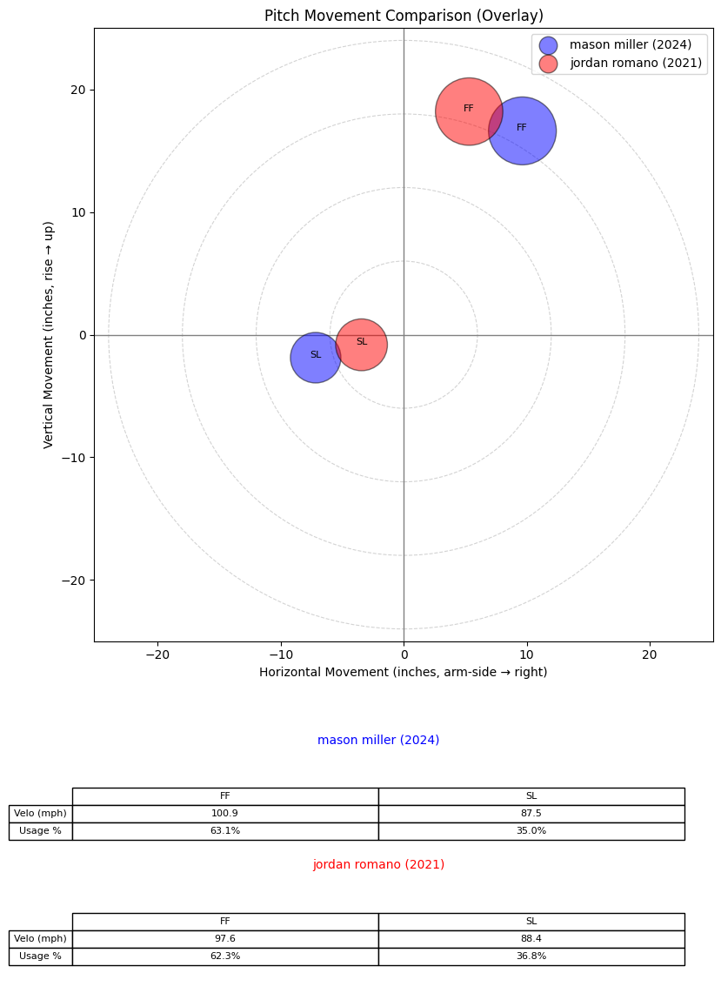

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


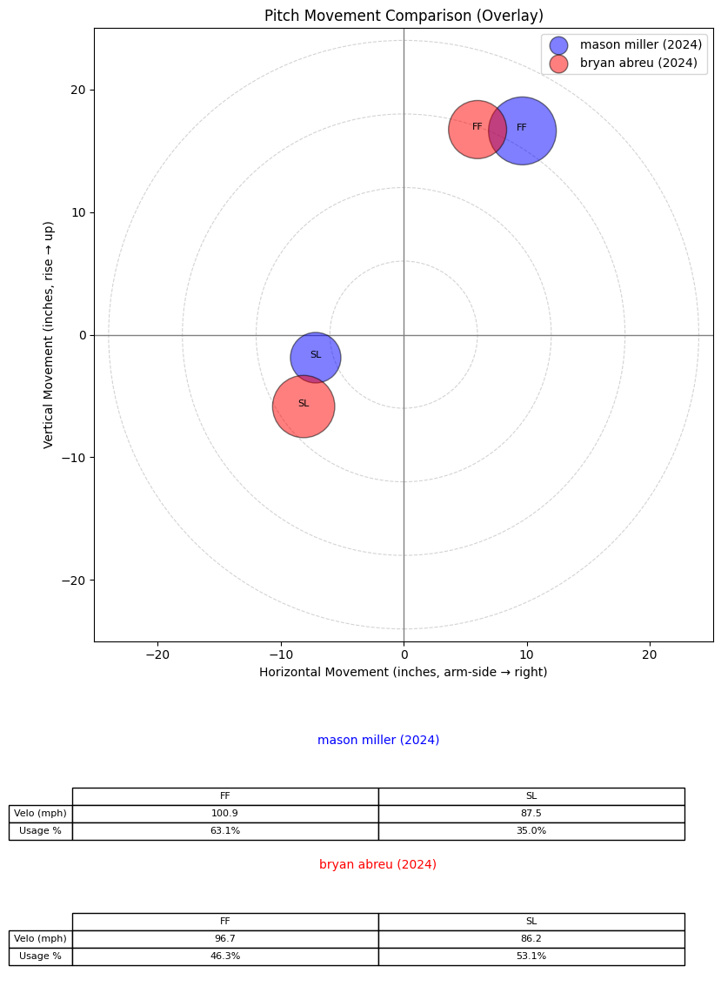

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


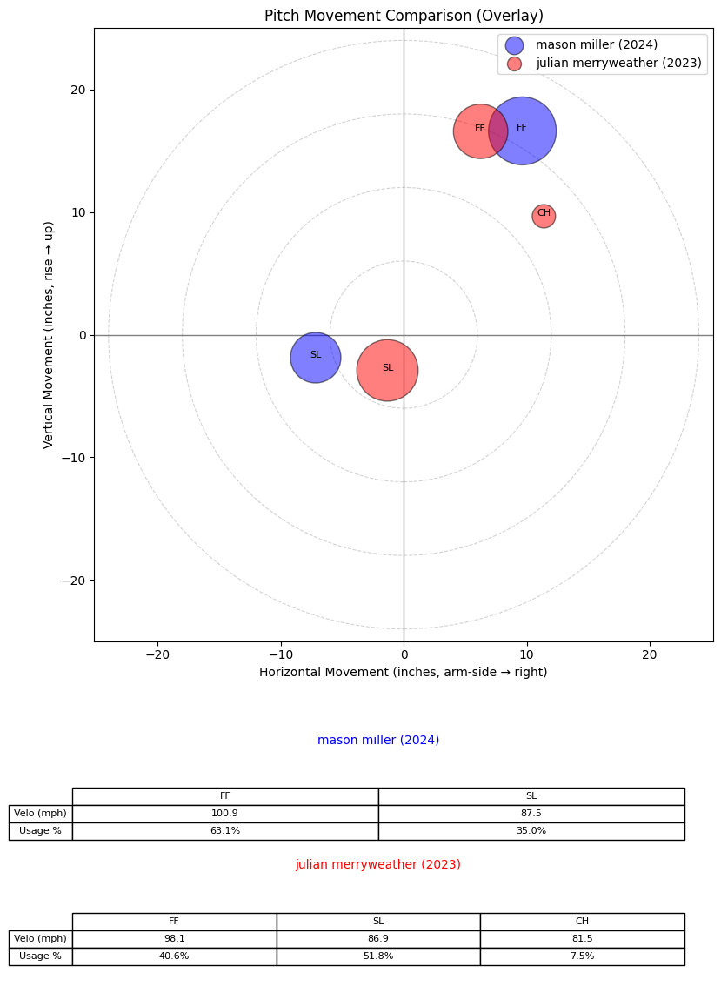

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


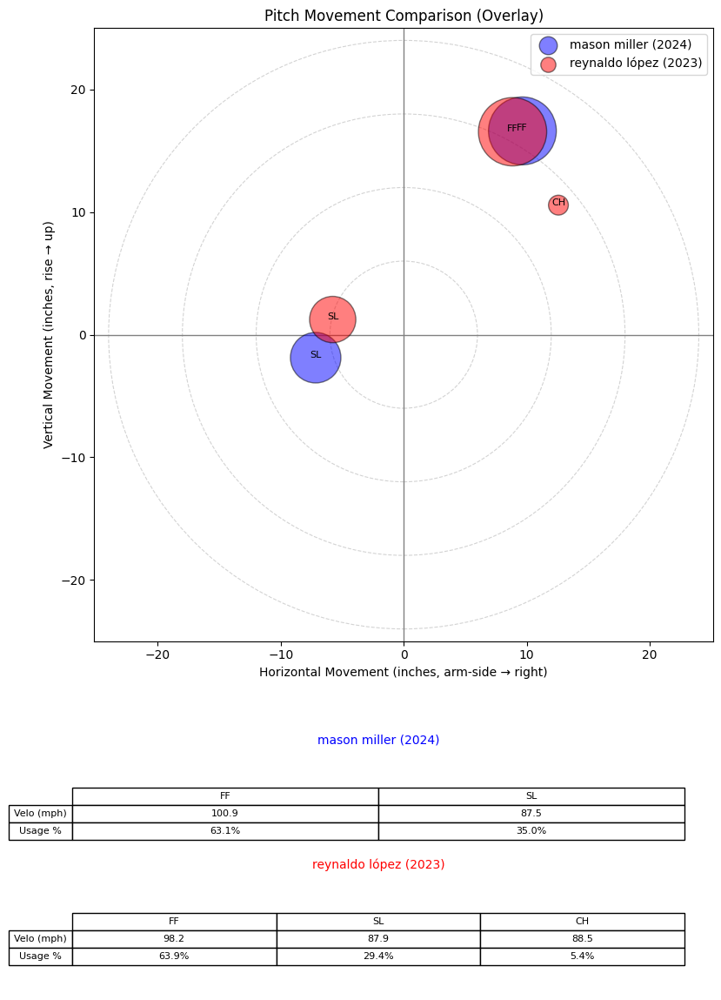

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


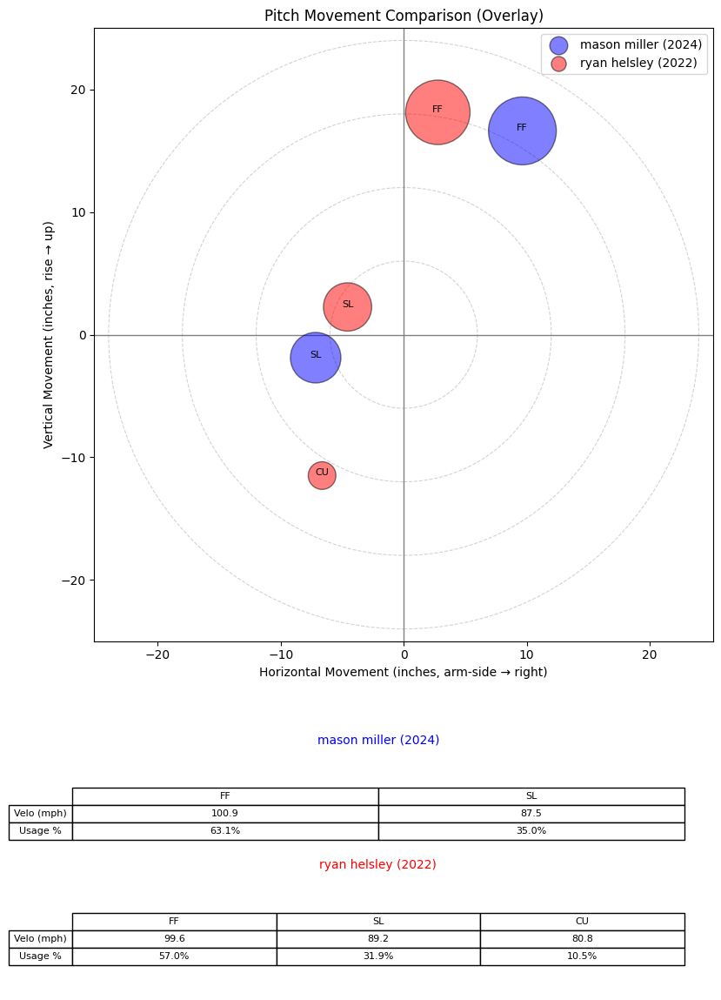

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


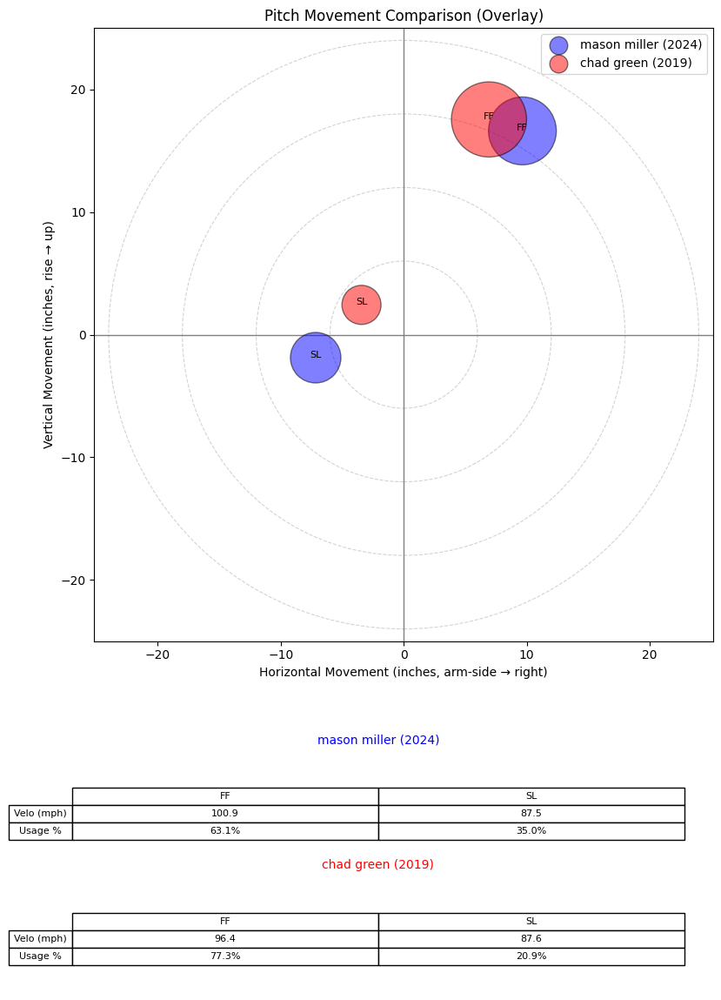

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_19204/3616525825.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


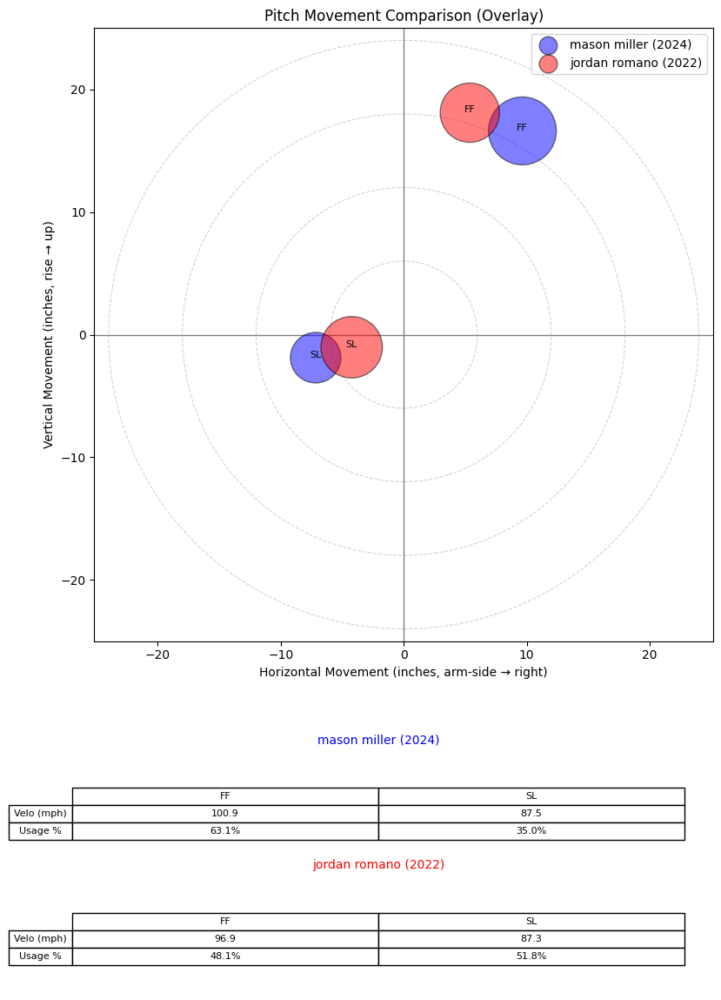

,pitcher,game_year,name,name_first,name_last,p_throws,role,cosine_similarity
1634,650556.0,2023,bryan abreu,bryan,abreu,R,reliever,0.956696
1876,664854.0,2024,ryan helsley,ryan,helsley,R,reliever,0.921488
1791,663432.0,2020,tanner rainey,tanner,rainey,R,reliever,0.917224
1109,605447.0,2021,jordan romano,jordan,romano,R,reliever,0.913390
1635,650556.0,2024,bryan abreu,bryan,abreu,R,reliever,0.887517
1734,657240.0,2023,julian merryweather,julian,merryweather,R,reliever,0.872814
1429,625643.0,2023,reynaldo lópez,reynaldo,lópez,R,reliever,0.871198
1875,664854.0,2022,ryan helsley,ryan,helsley,R,reliever,0.867093
1603,643338.0,2019,chad green,chad,green,R,reliever,0.858749
1110,605447.0,2022,jordan romano,jordan,romano,R,reliever,0.856146


In [208]:
neighbors_same = find_similar_pitchers_by_name_same_hand_role(
    pitcher_name="mason miller",
    year=2024,
    X_df=X_ae_metric_df,
    meta_df=pitcher_season_df,
    n_neighbors=10,
    overlay_df=movement_long,  # or whatever df your compare_pitchers_overlay expects
    plot_overlays=True,
    overlay_kwargs={"lim_inches": 25, "size_scale": 5000},
)
display(neighbors_same)

Building a supervised model to compare pitchers

In [72]:
# ---- Year splits ----
train_years = [2017, 2018, 2019, 2020, 2021]
val_years   = [2022, 2023]
test_years  = [2024]        # in-distribution test

meta_all = pitcher_season_df      # 2017–24
X_all    = X_scaled_df            # standardized features (same index as meta_all)

meta_train = meta_all[meta_all["game_year"].isin(train_years)].copy()
meta_val   = meta_all[meta_all["game_year"].isin(val_years)].copy()
meta_test  = meta_all[meta_all["game_year"].isin(test_years)].copy()

# make sure X subsets use the same indices
X_train_df = X_all.loc[meta_train.index].copy()
X_val_df   = X_all.loc[meta_val.index].copy()
X_test_df  = X_all.loc[meta_test.index].copy()


In [73]:
from torch.utils.data import Dataset, DataLoader
import random

def make_pair_indices(meta_df, X_df, neg_per_pos=3):
    idx = meta_df.index.to_list()
    name_by_idx = meta_df["name"].to_dict()
    hand_by_idx = meta_df["p_throws"].to_dict()
    role_by_idx = meta_df["role"].to_dict()
    
    # Positives: same pitcher, different year
    pos_pairs = []
    grouped = meta_df.groupby("name")
    for name, df_p in grouped:
        if len(df_p) < 2:
            continue
        idxs = df_p.index.to_list()
        n = len(idxs)
        for a in range(n):
            for b in range(a+1, n):
                pos_pairs.append((idxs[a], idxs[b]))
    
    # Bucket indices by (hand, role) for negative sampling
    buckets = {}
    for i in idx:
        key = (hand_by_idx[i], role_by_idx[i])
        buckets.setdefault(key, []).append(i)
    
    pair_indices = []
    labels = []
    
    for i, j in pos_pairs:
        # positive
        pair_indices.append((i, j))
        labels.append(1)
        
        # negatives for i
        key = (hand_by_idx[i], role_by_idx[i])
        candidates = buckets[key]
        for _ in range(neg_per_pos):
            k = i
            while k == i or name_by_idx[k] == name_by_idx[i]:
                k = random.choice(candidates)
            pair_indices.append((i, k))
            labels.append(0)
    
    return pair_indices, np.array(labels, dtype=np.float32)


In [74]:
class PairDataset(Dataset):
    def __init__(self, pair_indices, labels, X_df):
        self.pair_indices = pair_indices
        self.labels = labels
        self.X = X_df.values.astype("float32")
        self.idx_to_row = {i: pos for pos, i in enumerate(X_df.index)}
    
    def __len__(self):
        return len(self.pair_indices)
    
    def __getitem__(self, idx):
        i_global, j_global = self.pair_indices[idx]
        i = self.idx_to_row[i_global]
        j = self.idx_to_row[j_global]
        xi = self.X[i]
        xj = self.X[j]
        # pair features
        diff = np.abs(xi - xj)
        prod = xi * xj
        pair_feat = np.concatenate([diff, prod], axis=0)
        y = self.labels[idx]
        return pair_feat, y


In [75]:
class PairwiseMLP(nn.Module):
    def __init__(self, input_dim, hidden_dims=(256, 128), dropout=0.1):
        super().__init__()
        layers = []
        prev = input_dim
        for h in hidden_dims:
            layers.append(nn.Linear(prev, h))
            layers.append(nn.ReLU())
            layers.append(nn.Dropout(dropout))
            prev = h
        layers.append(nn.Linear(prev, 1))  # logit
        self.net = nn.Sequential(*layers)
    
    def forward(self, x_pair):
        logit = self.net(x_pair)
        return logit.squeeze(-1)  # [B]


In [76]:
# Build train pairs
train_pairs, train_labels = make_pair_indices(meta_train, X_train_df, neg_per_pos=3)
train_ds = PairDataset(train_pairs, train_labels, X_train_df)

# Optional: build val pairs to monitor classification performance
val_pairs, val_labels = make_pair_indices(meta_val, X_val_df, neg_per_pos=3)
val_ds = PairDataset(val_pairs, val_labels, X_val_df)

batch_size = 512

train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=True, drop_last=True)
val_loader   = DataLoader(val_ds,   batch_size=batch_size, shuffle=False, drop_last=False)

print("Train pairs:", len(train_ds), "Val pairs:", len(val_ds))


Train pairs: 4812 Val pairs: 552


In [77]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

input_dim = 2 * X_train_df.shape[1]  # [diff, prod]
model = PairwiseMLP(input_dim=input_dim, hidden_dims=(256, 128), dropout=0.1).to(device)

criterion = nn.BCEWithLogitsLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-3, weight_decay=1e-5)

n_epochs = 30  # adjust as you like

for epoch in range(1, n_epochs + 1):
    model.train()
    running_loss = 0.0
    n_train = 0
    
    for feats, y in train_loader:
        feats = feats.to(device)
        y = y.to(device)
        
        optimizer.zero_grad()
        logits = model(feats)
        loss = criterion(logits, y)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item() * feats.size(0)
        n_train += feats.size(0)
    
    avg_train_loss = running_loss / n_train
    
    # simple val loss
    model.eval()
    val_loss = 0.0
    n_val = 0
    with torch.no_grad():
        for feats, y in val_loader:
            feats = feats.to(device)
            y = y.to(device)
            logits = model(feats)
            loss = criterion(logits, y)
            val_loss += loss.item() * feats.size(0)
            n_val += feats.size(0)
    avg_val_loss = val_loss / n_val if n_val > 0 else float("nan")
    
    print(f"Epoch {epoch:02d} | train_loss={avg_train_loss:.4f} | val_loss={avg_val_loss:.4f}")


Epoch 01 | train_loss=0.5336 | val_loss=0.3780
Epoch 02 | train_loss=0.3087 | val_loss=0.1833
Epoch 03 | train_loss=0.2112 | val_loss=0.1331
Epoch 04 | train_loss=0.1836 | val_loss=0.1242
Epoch 05 | train_loss=0.1629 | val_loss=0.1277
Epoch 06 | train_loss=0.1530 | val_loss=0.1207
Epoch 07 | train_loss=0.1360 | val_loss=0.1157
Epoch 08 | train_loss=0.1260 | val_loss=0.1104
Epoch 09 | train_loss=0.1167 | val_loss=0.1011
Epoch 10 | train_loss=0.1041 | val_loss=0.0955
Epoch 11 | train_loss=0.0974 | val_loss=0.0873
Epoch 12 | train_loss=0.0928 | val_loss=0.0854
Epoch 13 | train_loss=0.0817 | val_loss=0.0845
Epoch 14 | train_loss=0.0800 | val_loss=0.0890
Epoch 15 | train_loss=0.0734 | val_loss=0.0801
Epoch 16 | train_loss=0.0715 | val_loss=0.0758
Epoch 17 | train_loss=0.0649 | val_loss=0.0789
Epoch 18 | train_loss=0.0641 | val_loss=0.0898
Epoch 19 | train_loss=0.0586 | val_loss=0.0831
Epoch 20 | train_loss=0.0579 | val_loss=0.0747
Epoch 21 | train_loss=0.0569 | val_loss=0.0862
Epoch 22 | tr

In [78]:
def score_gallery_for_query(model, x_q, X_gallery_df, device):
    """
    x_q: 1D numpy array shape [D] (standardized features for the query)
    X_gallery_df: DataFrame of standardized features for gallery (index = season ids)
    Returns: pandas Series of scores (probability same pitcher), index = gallery indices
    """
    Xg = X_gallery_df.values.astype("float32")  # [G, D]
    # build pair features [G, 2D]
    diff = np.abs(Xg - x_q[None, :])
    prod = Xg * x_q[None, :]
    pair_feats = np.concatenate([diff, prod], axis=1)
    
    with torch.no_grad():
        feats_t = torch.tensor(pair_feats, dtype=torch.float32, device=device)
        logits = model(feats_t)
        probs = torch.sigmoid(logits).cpu().numpy()
    
    return pd.Series(probs, index=X_gallery_df.index)


In [79]:
def eval_pair_model_hit_mrr(
    model,
    X_query_df,
    X_gallery_df,
    meta_query_df,
    meta_gallery_df,
    k=10,
    name_col="name",
    year_col="game_year",
):
    model.eval()
    hits = []
    rr = []
    n_eval = 0
    
    for q_idx, q_row in meta_query_df.iterrows():
        q_name = q_row[name_col]
        q_year = q_row[year_col]
        q_hand = q_row["p_throws"]
        q_role = q_row["role"]
        
        # gallery mask: same hand/role
        mask = (
            (meta_gallery_df["p_throws"] == q_hand) &
            (meta_gallery_df["role"] == q_role)
        )
        # if query index is also in gallery, drop that exact season
        if q_idx in meta_gallery_df.index:
            mask &= (meta_gallery_df.index != q_idx)
        
        meta_g = meta_gallery_df[mask]
        if meta_g.empty:
            continue
        
        # need at least one same-pitcher season in gallery to be eligible
        same_pitcher_mask = (meta_g[name_col] == q_name) & (meta_g[year_col] != q_year)
        if not same_pitcher_mask.any():
            continue
        
        X_g = X_gallery_df.loc[meta_g.index]
        x_q = X_query_df.loc[q_idx].values.astype("float32")
        
        scores = score_gallery_for_query(model, x_q, X_g, device=device)
        # sort descending by score
        top_idx = scores.sort_values(ascending=False).index[:k]
        meta_top = meta_g.loc[top_idx]
        
        same_pitcher_in_top = (meta_top[name_col] == q_name) & (meta_top[year_col] != q_year)
        if same_pitcher_in_top.any():
            hits.append(1.0)
            first_pos = np.where(same_pitcher_in_top.values)[0][0]
            rr.append(1.0 / (first_pos + 1))
        else:
            hits.append(0.0)
            rr.append(0.0)
        
        n_eval += 1
    
    hit_at_k = float(np.mean(hits)) if hits else float("nan")
    mrr = float(np.mean(rr)) if rr else float("nan")
    return hit_at_k, mrr, n_eval


In [95]:
# In-distribution test: 2024 → 2017–23
meta_gallery_1723 = meta_all[meta_all["game_year"].isin(train_years + val_years)].copy()
X_gallery_1723    = X_all.loc[meta_gallery_1723.index]

hit10_2024, mrr_2024, n_eval_2024 = eval_pair_model_hit_mrr(
    model,
    X_query_df=X_test_df,                # 2024
    X_gallery_df=X_gallery_1723,         # 2017–23
    meta_query_df=meta_test,
    meta_gallery_df=meta_gallery_1723,
    k=10,
    name_col="name",
    year_col="game_year",
)
print("PairwiseMLP 2024→17–23 | hit@10:", hit10_2024, "MRR:", mrr_2024, "n_eval:", n_eval_2024)

# OOD test: 2025 → 2017–24
meta_gallery_1724 = meta_all.copy()
X_gallery_1724    = X_all

hit10_2025, mrr_2025, n_eval_2025 = eval_pair_model_hit_mrr(
    model,
    X_query_df=X_2025_scaled_df,
    X_gallery_df=X_gallery_1724,
    meta_query_df=pitcher_season_df_2025,
    meta_gallery_df=meta_gallery_1724,
    k=10,
    name_col="name",
    year_col="game_year",
)
print("PairwiseMLP 2025→17–24 | hit@10:", hit10_2025, "MRR:", mrr_2025, "n_eval:", n_eval_2025)


PairwiseMLP 2024→17–23 | hit@10: 0.9482758620689655 MRR: 0.8109491881043606 n_eval: 174
PairwiseMLP 2025→17–24 | hit@10: 0.9621621621621622 MRR: 0.8154161304161304 n_eval: 185


In [225]:
print(df_2025[df_2025['pitcher']=='608331'])

Empty DataFrame
Columns: [pitch_type, release_speed, release_pos_x, release_pos_z, pitcher, p_throws, game_year, pfx_x, pfx_z, release_extension, release_pos_y]
Index: []


In [226]:
print(pitcher_season_df_2025.columns)

Index(['pitcher', 'game_year', 'pfx_x_CH', 'pfx_x_CU', 'pfx_x_EP', 'pfx_x_FC',
       'pfx_x_FF', 'pfx_x_FS', 'pfx_x_KN', 'pfx_x_SI', 'pfx_x_SL', 'pfx_z_CH',
       'pfx_z_CU', 'pfx_z_EP', 'pfx_z_FC', 'pfx_z_FF', 'pfx_z_FS', 'pfx_z_KN',
       'pfx_z_SI', 'pfx_z_SL', 'release_speed_CH', 'release_speed_CU',
       'release_speed_EP', 'release_speed_FC', 'release_speed_FF',
       'release_speed_FS', 'release_speed_KN', 'release_speed_SI',
       'release_speed_SL', 'CH_frac', 'CU_frac', 'EP_frac', 'FC_frac',
       'FF_frac', 'FS_frac', 'KN_frac', 'SI_frac', 'SL_frac', 'release_pos_x',
       'release_pos_z', 'release_extension', 'p_throws', 'p_throws_num',
       'role', 'throws_FF', 'throws_SL', 'throws_CH', 'throws_CU', 'throws_SI',
       'throws_FC', 'throws_FS', 'throws_KN', 'name_first', 'name_last',
       'name'],
      dtype='object')


In [227]:
print(pitcher_season_df_2025[['name', 'game_year', 'release_speed_FF', 'release_speed_CU', 'release_extension']])

                   name  game_year  release_speed_FF  release_speed_CU  \
0      justin verlander       2025          93.92132         78.470079   
1         kenley jansen       2025         93.646088         78.923515   
2        charlie morton       2025          94.21392         81.440061   
3           luis garcía       2025         93.646088         78.923515   
4       clayton kershaw       2025         88.949103         72.286435   
..                  ...        ...               ...               ...   
222         bryce elder       2025         92.789355         78.923515   
223      brandon pfaadt       2025         93.613324         82.053633   
224        mason miller       2025        101.193886         78.923515   
225     hayden birdsong       2025         95.510816         80.288961   
226  yoshinobu yamamoto       2025         95.367404         76.823625   

     release_extension  
0             6.013305  
1             6.897238  
2             6.155416  
3          

In [230]:
cols_to_check = ["release_speed_FF", "pfx_x_FF", "pfx_z_FF"]  # etc.

for col in X_all.columns:
    print("\n=== ", col, " ===")
    print("2017-2024 mean/std:",
          X_all[col].mean())
    print("2025 mean/std:",
          X_2025_scaled_df[col].mean())



===  pfx_x_CH  ===
2017-2024 mean/std: -5.722040032175131e-17
2025 mean/std: 0.15175027518732276

===  pfx_x_CU  ===
2017-2024 mean/std: 5.890335327239106e-17
2025 mean/std: -0.054990308263556865

===  pfx_x_EP  ===
2017-2024 mean/std: 1.714010070011077e-14
2025 mean/std: -247.25447518585878

===  pfx_x_FC  ===
2017-2024 mean/std: 3.197610606215515e-17
2025 mean/std: -0.1300147661424743

===  pfx_x_FF  ===
2017-2024 mean/std: -5.048858851919234e-18
2025 mean/std: 0.1262048761189148

===  pfx_x_FS  ===
2017-2024 mean/std: -2.5412589554660142e-16
2025 mean/std: 0.03478549603150847

===  pfx_x_KN  ===
2017-2024 mean/std: 1.4389247727969817e-16
2025 mean/std: 3.7790174261882467e-10

===  pfx_x_SI  ===
2017-2024 mean/std: 1.6829529506397447e-18
2025 mean/std: 0.12737429445857124

===  pfx_x_SL  ===
2017-2024 mean/std: 6.731811802558979e-18
2025 mean/std: -0.017623228873924302

===  pfx_z_CH  ===
2017-2024 mean/std: -1.1107489474222314e-16
2025 mean/std: -0.43642966158014557

===  pfx_z_CU 

In [ ]:
neighbors_same = find_similar_pitchers_by_name_same_hand_role(
    pitcher_name="bryan woo",
    year=2025,
    X_df=X_,
    meta_df=pitcher_season_df,
    n_neighbors=10,
    overlay_df=movement_long,  # or whatever df your compare_pitchers_overlay expects
    plot_overlays=True,
    overlay_kwargs={"lim_inches": 25, "size_scale": 5000},
)
display(neighbors_same)

ValueError: No row found for name='bryan woo', year=2025

In [92]:
print(pitcher_season_df_2025['name'].unique())

['justin verlander' 'kenley jansen' 'charlie morton' 'luis garcía'
 'clayton kershaw' 'jose quintana' 'merrill kelly' 'chris sale'
 'tyler anderson' 'shawn armstrong' 'nathan eovaldi' 'sonny gray'
 'kyle hendricks' 'michael lorenzen' 'aroldis chapman' 'zack wheeler'
 'josé ureña' 'matt boyd' 'patrick corbin' 'andrew heaney' 'steven matz'
 'miles mikolas' 'hoby milner' 'pierce johnson' 'caleb thielbar'
 'yusei kikuchi' 'jason adam' 'kevin gausman' 'tommy kahnle' 'robbie ray'
 'ryne stanek' 'jameson taillon' 'taijuan walker' 'eduardo rodríguez'
 'wandy peralta' 'jacob degrom' 'steven okert' 'jakob junis' 'luke weaver'
 'nick pivetta' 'scott barlow' 'chris bassitt' 'clay holmes'
 'adrian houser' 'jeffrey springs' 'rafael montero' 'colin rea'
 'carlos rodón' 'erick fedde' 'nick martínez' 'anthony banda'
 'aaron bummer' 'kyle freeland' 'seth lugo' 'carlos estévez' 'max fried'
 'lucas giolito' 'michael wacha' 'germán márquez' 'brent suter'
 'cal quantrill' 'steven wilson' 'walker buehler' 'e

In [105]:
# 1) Fix column name in 2025 meta if needed
pitcher_season_df_2025_fixed = pitcher_season_df_2025.copy()
if "names" in pitcher_season_df_2025_fixed.columns and "name" not in pitcher_season_df_2025_fixed.columns:
    pitcher_season_df_2025_fixed = pitcher_season_df_2025_fixed.rename(columns={"names": "name"})

# 2) Combine meta with NEW sequential index
meta_all_17_25 = pd.concat(
    [pitcher_season_df, pitcher_season_df_2025_fixed],
    axis=0,
    ignore_index=True,          # <- IMPORTANT: new RangeIndex 0..N-1
)

# 3) Combine standardized features with the same new index
X_scaled_all_17_25 = pd.concat(
    [X_scaled_df, X_2025_scaled_df],
    axis=0,
    ignore_index=True,
)

# Sanity check: indexes now match and are unique
assert (X_scaled_all_17_25.index == meta_all_17_25.index).all()
assert meta_all_17_25.index.is_unique


In [97]:
def score_gallery_for_query_mlp(model, x_q, X_gallery_df, device):
    """
    x_q: 1D numpy array [D] (standardized features for query season)
    X_gallery_df: DataFrame of standardized features for all gallery seasons
    Returns: Series of probabilities (same pitcher) indexed by gallery indices.
    """
    Xg = X_gallery_df.values.astype("float32")  # [G, D]
    diff = np.abs(Xg - x_q[None, :])
    prod = Xg * x_q[None, :]
    pair_feats = np.concatenate([diff, prod], axis=1)

    with torch.no_grad():
        feats_t = torch.tensor(pair_feats, dtype=torch.float32, device=device)
        logits = model(feats_t)
        probs = torch.sigmoid(logits).cpu().numpy()

    return pd.Series(probs, index=X_gallery_df.index)


In [106]:
def find_similar_pitchers_mlp(
    pitcher_name: str,
    year: int,
    model,
    X_all_df: pd.DataFrame,
    meta_all_df: pd.DataFrame,
    n_neighbors: int = 10,
    restrict_same_group: bool = True,
    device=None,
):
    if device is None:
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.eval()

    # 1. Locate query season
    name_lower = meta_all_df["name"].str.lower()
    mask = (name_lower == pitcher_name.lower()) & (meta_all_df["game_year"] == year)
    idx = meta_all_df.index[mask]

    if len(idx) == 0:
        raise ValueError(f"No row found for name='{pitcher_name}', year={year}")
    if len(idx) > 1:
        raise ValueError(f"Multiple rows found for name='{pitcher_name}', year={year}")

    target_idx = idx[0]

    base = meta_all_df.loc[target_idx]
    base_name = base["name"]
    base_year = base["game_year"]
    base_hand = base["p_throws"]
    base_role = base["role"]

    # 2. Query features
    x_q = X_all_df.loc[target_idx].values.astype("float32")

    # 3. Build gallery mask (optionally same hand/role, always drop self)
    if restrict_same_group:
        same_group_mask = (
            (meta_all_df["p_throws"] == base_hand) &
            (meta_all_df["role"] == base_role)
        )
    else:
        same_group_mask = pd.Series(True, index=meta_all_df.index)

    same_group_mask &= (meta_all_df.index != target_idx)

    meta_gallery = meta_all_df.loc[same_group_mask]
    X_gallery = X_all_df.loc[meta_gallery.index]

    # 4. Score gallery with MLP
    scores = score_gallery_for_query_mlp(model, x_q, X_gallery, device=device)

    # 5. Take top-k
    top_idx = scores.sort_values(ascending=False).head(n_neighbors).index
    top_scores = scores.loc[top_idx]

    result = meta_gallery.loc[top_idx, [
        "pitcher", "game_year", "name",
        "name_first", "name_last", "p_throws", "role"
    ]].copy()
    result["mlp_similarity"] = top_scores.values
    result = result.sort_values("mlp_similarity", ascending=False)

    return base_name, base_year, result


In [107]:
base_name, base_year, neighbors_woo = find_similar_pitchers_mlp(
    pitcher_name="bryan woo",
    year=2025,
    model=model,                       # your trained PairwiseMLP
    X_all_df=X_scaled_all_17_25,
    meta_all_df=meta_all_17_25,
    n_neighbors=10,
    restrict_same_group=True,
)

print(base_name, base_year)
display(neighbors_woo)


bryan woo 2025


,pitcher,game_year,name,name_first,name_last,p_throws,role,mlp_similarity
2105,693433.0,2024,bryan woo,bryan,woo,R,starter,0.999483
2059,678394.0,2024,brayan bello,brayan,bello,R,starter,0.994415
1739,657277.0,2023,logan webb,logan,webb,R,starter,0.962477
1142,606160.0,2017,rafael montero,rafael,montero,R,starter,0.895816
2058,678394.0,2023,brayan bello,brayan,bello,R,starter,0.817204
2314,678394.0,2025,brayan bello,brayan,bello,R,starter,0.646921
2146,594798.0,2025,jacob degrom,jacob,degrom,R,starter,0.599273
542,543101.0,2021,anthony desclafani,anthony,desclafani,R,starter,0.581189
1738,657277.0,2022,logan webb,logan,webb,R,starter,0.553112
1578,642547.0,2023,freddy peralta,freddy,peralta,R,starter,0.546795


In [108]:
# Make sure AE features are aligned with their meta before concat
Z_ae_17_24 = X_ae_df.loc[pitcher_season_df.index]
Z_ae_2025  = X_ae_df_2025.loc[pitcher_season_df_2025_fixed.index]

# Combine with a fresh RangeIndex to match meta_all_17_25
X_ae_all_17_25 = pd.concat(
    [Z_ae_17_24, Z_ae_2025],
    axis=0,
    ignore_index=True,       # <- IMPORTANT: same as meta_all_17_25
)

# Sanity check alignment with meta_all_17_25
assert (X_ae_all_17_25.index == meta_all_17_25.index).all()


In [109]:
neighbors_woo_ae = find_similar_pitchers_by_name_same_hand_role(
    pitcher_name="bryan woo",
    year=2025,
    X_df=X_ae_all_17_25,      # AE latent space for 2017–25
    meta_df=meta_all_17_25,   # combined meta for 2017–25
    n_neighbors=10,
    overlay_df=None,
    plot_overlays=False,
)

display(neighbors_woo_ae)


,pitcher,game_year,name,name_first,name_last,p_throws,role,cosine_similarity
2105,693433.0,2024,bryan woo,bryan,woo,R,starter,0.924376
1378,622491.0,2023,luis castillo,luis,castillo,R,starter,0.837044
2059,678394.0,2024,brayan bello,brayan,bello,R,starter,0.835048
1377,622491.0,2022,luis castillo,luis,castillo,R,starter,0.823372
1376,622491.0,2021,luis castillo,luis,castillo,R,starter,0.807489
1627,645261.0,2022,sandy alcántara,sandy,alcántara,R,starter,0.793650
923,593372.0,2017,carlos martínez,carlos,martínez,R,starter,0.791636
1379,622491.0,2024,luis castillo,luis,castillo,R,starter,0.791497
1375,622491.0,2020,luis castillo,luis,castillo,R,starter,0.784034
1090,605347.0,2021,jorge lópez,jorge,lópez,R,starter,0.767738


In [112]:
movement_long_all = reshape_pitcher_season_df(meta_all_17_25)

/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_22911/1489908689.py:100: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


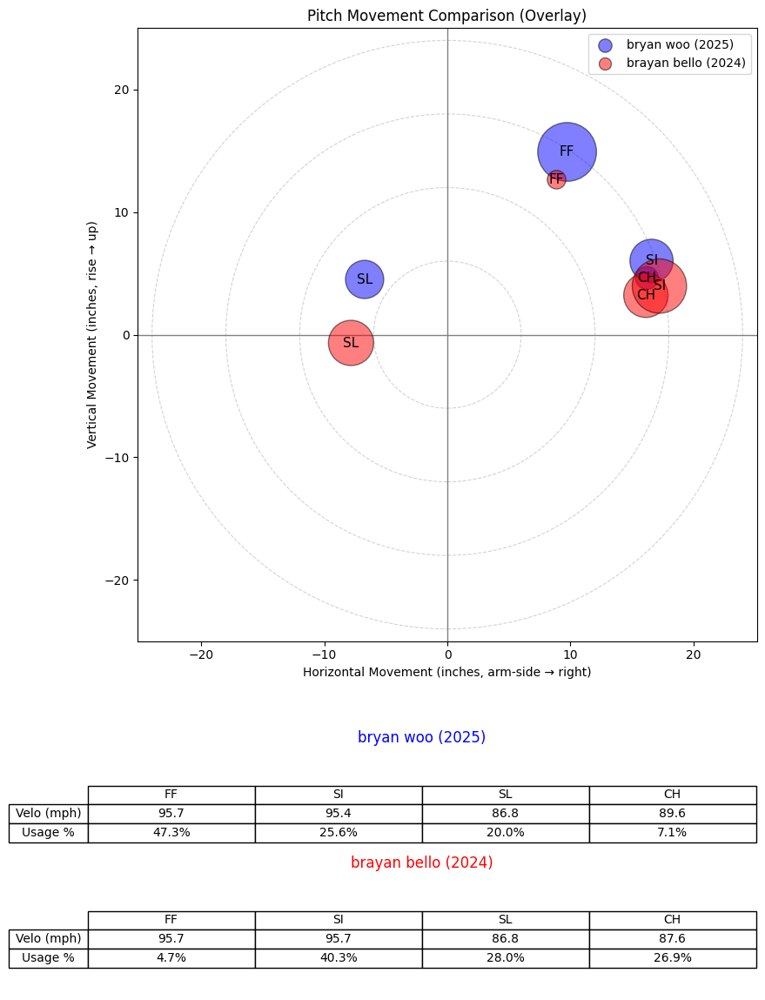

In [121]:
compare_pitchers_overlay(
    df=movement_long_all,
    nameA="bryan woo",
    yearA=2025,
    nameB="brayan bello",
    yearB=2024,
    lim_inches=25,        # whatever you used before
    size_scale=5000,      # whatever you used before
)


/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_22911/1489908689.py:100: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


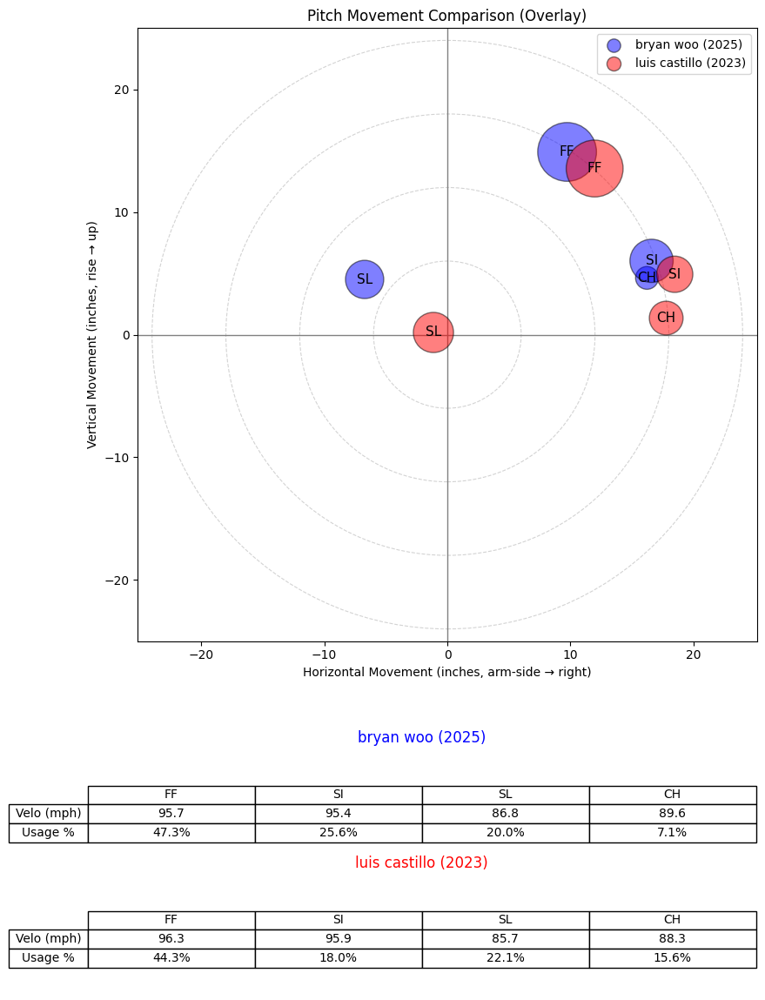

In [122]:
compare_pitchers_overlay(
    df=movement_long_all,
    nameA="bryan woo",
    yearA=2025,
    nameB="luis castillo",
    yearB=2023,
    lim_inches=25,        # whatever you used before
    size_scale=5000,      # whatever you used before
)


In [126]:
base_name, base_year, neighbors_woo = find_similar_pitchers_mlp(
    pitcher_name="shota imanaga",
    year=2024,
    model=model,                       # your trained PairwiseMLP
    X_all_df=X_scaled_all_17_25,
    meta_all_df=meta_all_17_25,
    n_neighbors=10,
    restrict_same_group=True,
)

print(base_name, base_year)
display(neighbors_woo)


shota imanaga 2024


,pitcher,game_year,name,name_first,name_last,p_throws,role,mlp_similarity
2115,477132.0,2025,clayton kershaw,clayton,kershaw,L,starter,1.000000
2326,684007.0,2025,shota imanaga,shota,imanaga,L,starter,0.999999
1957,669373.0,2021,tarik skubal,tarik,skubal,L,starter,0.999989
705,571510.0,2019,matt boyd,matt,boyd,L,starter,0.999989
2128,571510.0,2025,matt boyd,matt,boyd,L,starter,0.999856
197,461829.0,2017,gio gonzalez,gio,gonzalez,L,starter,0.999392
654,547943.0,2017,hyun jin ryu,hyun jin,ryu,L,starter,0.999080
1765,660761.0,2022,josé suarez,josé,suarez,L,starter,0.998836
706,571510.0,2020,matt boyd,matt,boyd,L,starter,0.998752
2289,671106.0,2025,logan allen,logan,allen,L,starter,0.997296


/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_22911/1489908689.py:100: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


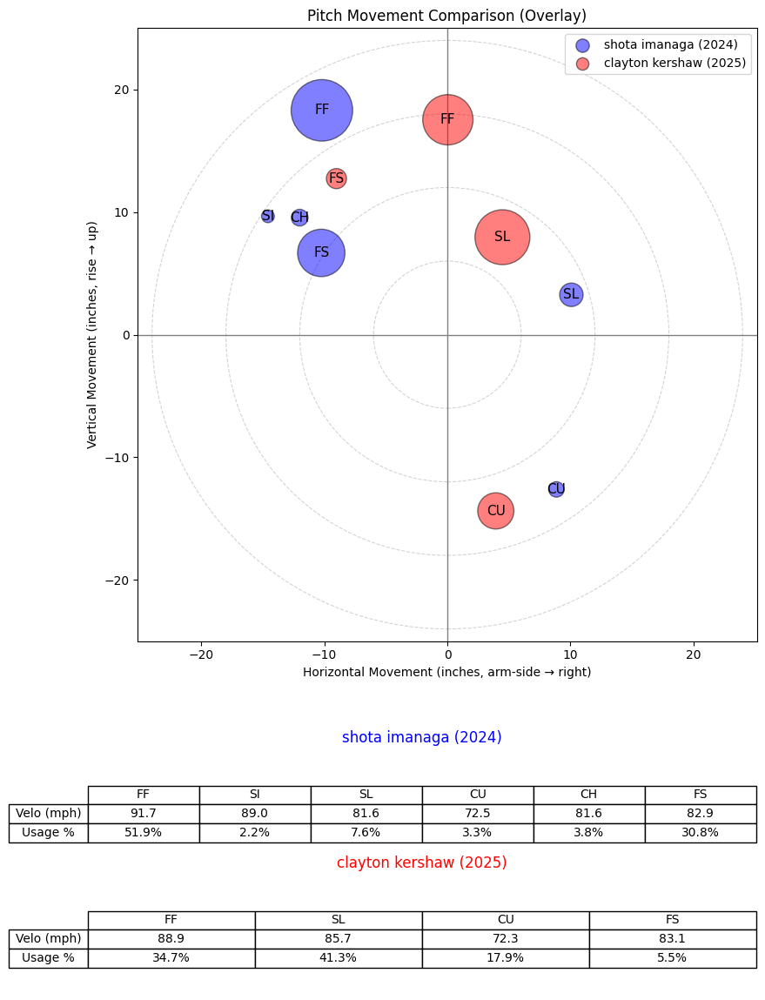

In [127]:
compare_pitchers_overlay(
    df=movement_long_all,
    nameA="shota imanaga",
    yearA=2024,
    nameB="clayton kershaw",
    yearB=2025,
    lim_inches=25,        # whatever you used before
    size_scale=5000,      # whatever you used before
)


In [130]:
base_name, base_year, neighbors_woo = find_similar_pitchers_mlp(
    pitcher_name="néstor cortés",
    year=2024,
    model=model,                       # your trained PairwiseMLP
    X_all_df=X_scaled_all_17_25,
    meta_all_df=meta_all_17_25,
    n_neighbors=10,
    restrict_same_group=True,
)

print(base_name, base_year)
display(neighbors_woo)


néstor cortés 2024


,pitcher,game_year,name,name_first,name_last,p_throws,role,mlp_similarity
1449,628711.0,2023,julio urías,julio,urías,L,starter,1.000000
1488,641482.0,2022,néstor cortés,néstor,cortés,L,starter,1.000000
2006,671106.0,2023,logan allen,logan,allen,L,starter,0.999958
2289,671106.0,2025,logan allen,logan,allen,L,starter,0.999072
1448,628711.0,2022,julio urías,julio,urías,L,starter,0.994896
82,448179.0,2022,rich hill,rich,hill,L,starter,0.993688
260,489119.0,2021,wade miley,wade,miley,L,starter,0.988462
2079,682227.0,2023,brandon williamson,brandon,williamson,L,starter,0.985566
1446,628711.0,2020,julio urías,julio,urías,L,starter,0.980676
1447,628711.0,2021,julio urías,julio,urías,L,starter,0.965898


/var/folders/jj/pg09j1dn24d5qgc0lzyrqlr40000gn/T/ipykernel_22911/1489908689.py:100: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


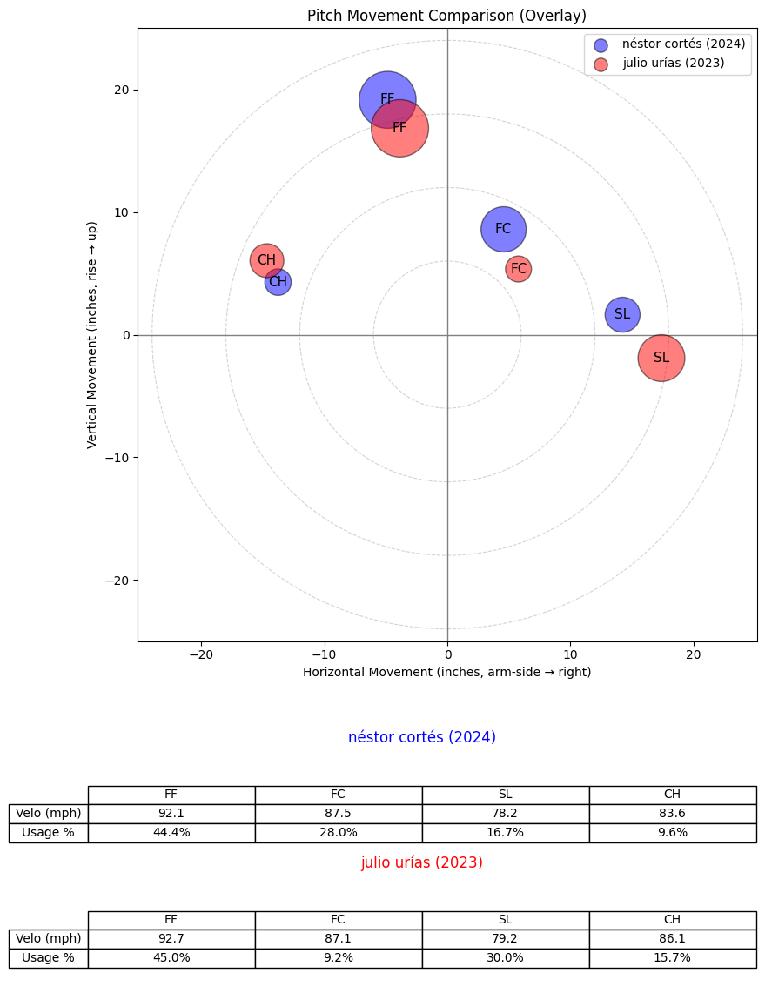

In [132]:
compare_pitchers_overlay(
    df=movement_long_all,
    nameA="néstor cortés",
    yearA=2024,
    nameB="julio urías",
    yearB=2023,
    lim_inches=25,        # whatever you used before
    size_scale=5000,      # whatever you used before
)
